In [169]:
!pip install pystac_client==0.6.1 stackstac==0.4.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.5/169.5 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 17.7 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 17.3 MB/s eta 0:00:00
  Attempting uninstall: pystac
    Found existing installation: pystac 1.6.1
    Uninstalling pystac-1.6.1:
      Successfully uninstalled pystac-1.6.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
rastervision-core 0.20.3.dev0 requires geopandas==0.12.0, but you have geopandas 0.13.2 which is incompatible.
rastervision-core 0.20.3.dev0 requires imageio==2.22.1, but you have imageio 2.31.1 which is incompatible.
rastervision-core 0.20.3.dev0 requires numpy==1.23.3, but you have numpy 1.25.0 which is incompatible.
rastervision-core 0.20

In [1]:
import os

os.environ['AWS_ACCESS_KEY_ID'] = ''
os.environ['AWS_SECRET_ACCESS_KEY'] = ''
os.environ['AWS_SESSION_TOKEN'] = ''

In [2]:
from os.path import join
import gc
from time import perf_counter

from rastervision.core.box import Box
from rastervision.core.data import (
    MinMaxTransformer, RasterioCRSTransformer, 
    StatsTransformer, XarraySource)
from rastervision.core.data.raster_source import XarraySource

from rastervision.pipeline.file_system.utils import (
    download_if_needed, json_to_file, file_to_json)
from rastervision.core.evaluation import ensure_json_serializable

import math
from tqdm.auto import tqdm, trange
import numpy as np
from shapely.geometry import mapping
import torch
from torch.utils.data import DataLoader
from torchvision.transforms import Normalize
import albumentations as A

from matplotlib import pyplot as plt
import seaborn as sns
sns.reset_defaults()

/opt/conda/lib/python3.10/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [156]:
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture

In [55]:
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import matplotlib.colors as colors

def draw_windows(ax, windows, cs, **kwargs):
    for w, c in zip(windows, cs):
        p = patches.Polygon(w.to_points(), ec=c, **kwargs)
        ax.add_patch(p)


## Get a time-series of Sentinel-2 images from a STAC API

Get Sentinel-2 imagery from 2023-06-01 to 2023-06-20 over Paris, France.

In [170]:
import pystac_client
import pystac
import stackstac

In [171]:
bbox = Box(xmin=67.882, ymin=27.674, xmax=67.929, ymax=27.825)
bbox_geometry = mapping(bbox.to_shapely().oriented_envelope)

In [252]:
%%time

URL = "https://earth-search.aws.element84.com/v1"
catalog = pystac_client.Client.open(URL)

items = catalog.search(
    intersects=bbox_geometry,
    collections=["sentinel-2-l1c"],
    # collections=["sentinel-2-l2a"],
    datetime="2022-06-01/2022-06-30",
    query={"eo:cloud_cover": {"lt": 25}},
).item_collection()

len(items)

CPU times: user 47.9 ms, sys: 4.97 ms, total: 52.9 ms
Wall time: 1.65 s


11

In [253]:
stack = stackstac.stack(items)

In [254]:
stack

<xarray.DataArray 'stackstac-3e00120d946f46d851b21533e44eee13' (time: 11,
                                                                band: 14,
                                                                y: 10980,
                                                                x: 10980)>
dask.array<fetch_raster_window, shape=(11, 14, 10980, 10980), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/40)
  * time                              (time) datetime64[ns] 2022-06-02T06:11:...
    id                                (time) <U24 'S2A_42RUR_20220602_0_L1C' ...
  * band                              (band) <U8 'blue' 'cirrus' ... 'visual'
  * x                                 (x) float64 3e+05 3e+05 ... 4.098e+05
  * y                                 (y) float64 3.1e+06 3.1e+06 ... 2.99e+06
    earthsearch:s3_path               (time) <U76 's3://earthsearch-data/sent...
    ...                                ...
    raster:bands                      (band) object [{'nodata': 0, 'data_type...
    title                             (band) <U30 'Blue (band 2) - 10m' ... '...
    common_name                       (band) object 'blue' 'cirrus' ... None
    center_wavelength                 (band) object 0.49 1.3735 ... 2.19 None
    full_width_half_max               (band) object 0.098 0.075 ... 0.242 None
    epsg                              int64 32642
Attributes:
    spec:        RasterSpec(epsg=32642, bounds=(300000.0, 2990220.0, 409800.0...
    crs:         epsg:32642
    transform:   | 10.00, 0.00, 300000.00|\n| 0.00,-10.00, 3100020.00|\n| 0.0...
    resolution:  10.0

In [ ]:
data_array = stack
data_array = data_array.sel(
    band=[
        'coastal', # B01
        'blue', # B02
        'green', # B03
        'red', # B04
        'rededge1', # B05
        'rededge2', # B06
        'rededge3', # B07
        'nir', # B08
        'nir08', # B8A
        'nir09', # B09
        'scl', # B10 (?)
        'swir16', # B11
        'swir22', # B12
    ])

In [237]:
valid_ts, _ = np.where(~np.isnan(data_array.isel(x=0, y=0, band=[3]).to_numpy()))
data_array = data_array.isel(time=valid_ts)
data_array

<xarray.DataArray 'stackstac-c9f5f27fc004be2f751aa240824774d3' (time: 6,
                                                                band: 13,
                                                                y: 10980,
                                                                x: 10980)>
dask.array<getitem, shape=(6, 13, 10980, 10980), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/53)
  * time                                     (time) datetime64[ns] 2022-06-05...
    id                                       (time) <U24 'S2A_42RUR_20220605_...
  * band                                     (band) <U12 'coastal' ... 'swir22'
  * x                                        (x) float64 3e+05 ... 4.098e+05
  * y                                        (y) float64 3.1e+06 ... 2.99e+06
    proj:epsg                                int64 32642
    ...                                       ...
    title                                    (band) <U31 'Coastal aerosol (ba...
    gsd                                      (band) object 60 10 10 ... 20 20
    common_name                              (band) object 'coastal' ... 'swi...
    center_wavelength                        (band) object 0.443 0.49 ... 2.19
    full_width_half_max                      (band) object 0.027 0.098 ... 0.242
    epsg                                     int64 32642
Attributes:
    spec:        RasterSpec(epsg=32642, bounds=(300000.0, 2990220.0, 409800.0...
    crs:         epsg:32642
    transform:   | 10.00, 0.00, 300000.00|\n| 0.00,-10.00, 3100020.00|\n| 0.0...
    resolution:  10.0

In [238]:
crs_transformer = RasterioCRSTransformer(
    transform=stack.transform, image_crs=stack.crs)

In [211]:
# stats_uri = 's3://raster-vision-ahassan/sentinel-2-embeddings/42R_stats.json'
stats_uri = '42RUR_stats.json'
stats_tf = StatsTransformer.from_stats_json(stats_uri)

In [239]:
raster_source = XarraySource(
    data_array,
    crs_transformer=crs_transformer,
    raster_transformers=[stats_tf],
    channel_order=list(range(len(data_array.band))),
    temporal=True
)
raster_source.shape

(6, 10980, 10980, 13)

In [240]:
T = raster_source.shape[0]
t_strs = np.array([str(_t.date()) for _t in raster_source.data_array.time.to_series().to_list()])

  0%|          | 0/69 [00:00<?, ?it/s]

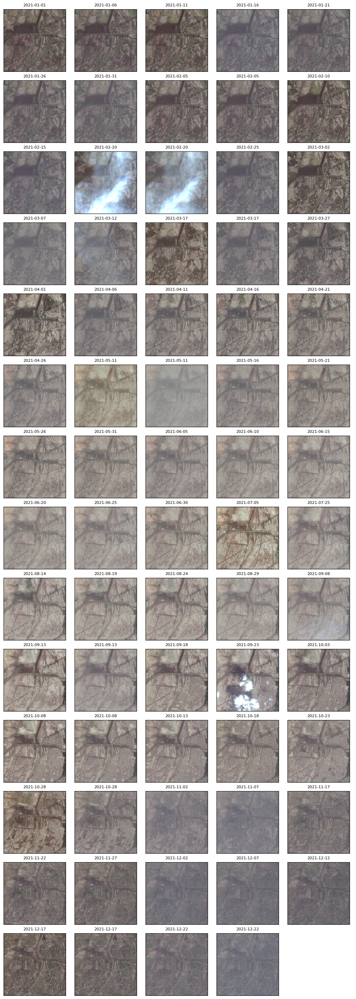

In [189]:
window = windows[12]

plt.close('all')
ncols = 5
nrows = int(math.ceil(T / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(range(T), t_strs, axs.flat), total=T) as bar:
    for t, t_str_t, ax in bar:
        chip_t = raster_source.get_chip(window, bands=[3, 2, 1], time=t)
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if t < len(axs.flat) - 1:
    for ax in axs.flat[t + 1:]:
        ax.axis('off')
plt.show()

  0%|          | 0/54 [00:00<?, ?it/s]

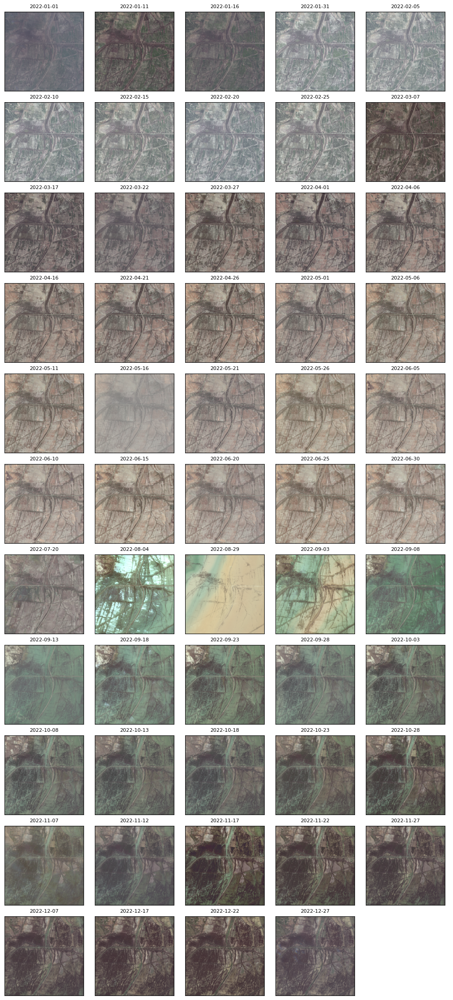

In [180]:
window = windows[12]

plt.close('all')
ncols = 5
nrows = int(math.ceil(T / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(range(T), t_strs, axs.flat), total=T) as bar:
    for t, t_str_t, ax in bar:
        chip_t = raster_source.get_chip(window, bands=[3, 2, 1], time=t)
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if t < len(axs.flat) - 1:
    for ax in axs.flat[t + 1:]:
        ax.axis('off')
plt.show()

  0%|          | 0/6 [00:00<?, ?it/s]

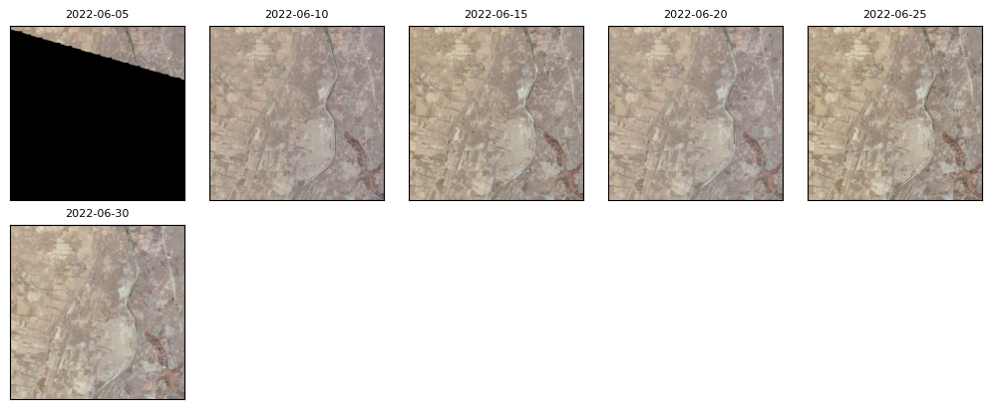

In [242]:
window = Box(8_000, 6_000, 9_000, 7_000)

plt.close('all')
ncols = 5
nrows = int(math.ceil(T / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(range(T), t_strs, axs.flat), total=T) as bar:
    for t, t_str_t, ax in bar:
        chip_t = raster_source.get_chip(window, bands=[3, 2, 1], time=t)
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if t < len(axs.flat) - 1:
    for ax in axs.flat[t + 1:]:
        ax.axis('off')
plt.show()

---

## Embeddings

In [4]:
embeddings_all = file_to_json('42R_2017-01-01--2023-07-10.json')
# embeddings_all = file_to_json('s3://raster-vision-ahassan/sentinel-2-embeddings/42R_2017-01-01--2023-07-10.json')

In [5]:
box_to_embeddings = {}
windows = next(iter(embeddings_all.values()))['windows_pixel']
windows = [Box(**w) for w in windows]
len(windows)

484

In [6]:
with tqdm(windows) as bar:
    for i, w in enumerate(bar):
        box_to_embeddings[w] = []
        for t, d_t in embeddings_all.items():
            e_w = d_t['embeddings'][i]
            box_to_embeddings[w].append({t: e_w})


  0%|          | 0/484 [00:00<?, ?it/s]

In [43]:
window = windows[0]
timestamps = np.array([next(iter(d.keys())) for d in box_to_embeddings[window]])
window_embeddings = np.array([next(iter(d.values())) for d in box_to_embeddings[window]])
window_embeddings.shape

(317, 512)

In [269]:
# window_embeddings_mean = window_embeddings.mean(axis=0)
# window_embeddings_std = window_embeddings.std(axis=0)
# window_embeddings_normalized = ((window_embeddings - window_embeddings_mean) / (window_embeddings_std + 1e-6))

In [285]:
# month_embeddings_train = {}
# month_embeddings_2021 = {}
# month_embeddings_2022 = {}
# month_embeddings_2023 = {}
# for month in range(1, 12 + 1):
#     month_embeddings_train[month] = []
#     # month_embeddings_2021[month] = []
#     month_embeddings_2022[month] = []
#     month_embeddings_2023[month] = []
#     for t, e in zip(timestamps, window_embeddings):
#         Y, M, _ = t.split('-')
#         Y = int(Y)
#         M = int(M)
#         if M == month:
#             if 2018 <= Y < 2022:
#                 month_embeddings_train[month].append(e)
#             # elif Y == 2021:
#             #     month_embeddings_2021[month].append(e)
#             elif Y == 2022:
#                 month_embeddings_2022[month].append(e)
#             elif Y == 2023:
#                 month_embeddings_2023[month].append(e)
#     month_embeddings_train[month] = np.stack(month_embeddings_train[month])
#     # month_embeddings_2021[month] = np.stack(month_embeddings_2021[month])
#     month_embeddings_2022[month] = np.stack(month_embeddings_2022[month])
#     if len(month_embeddings_2023[month]) > 0:
#         month_embeddings_2023[month] = np.stack(month_embeddings_2023[month])


## 2021

In [158]:
m_to_box_to_score = {}

  0%|          | 0/12 [00:00<?, ?it/s]

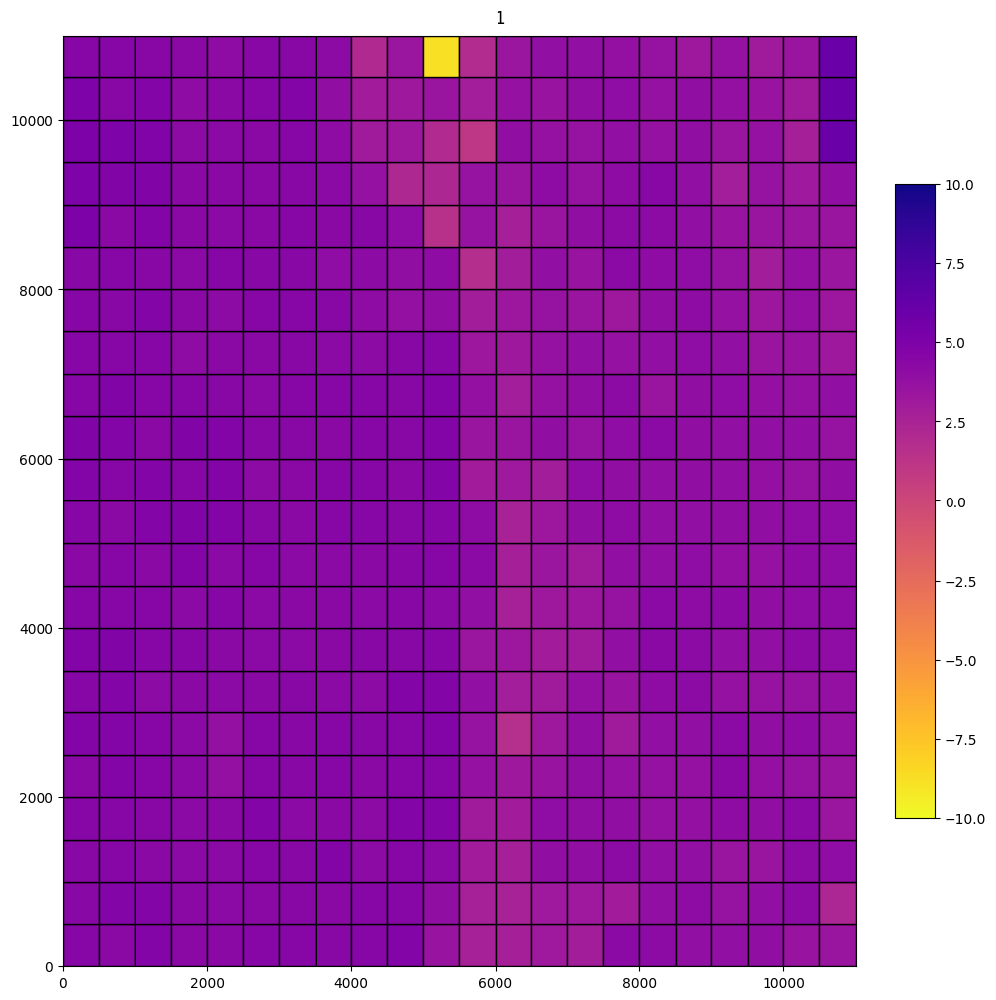

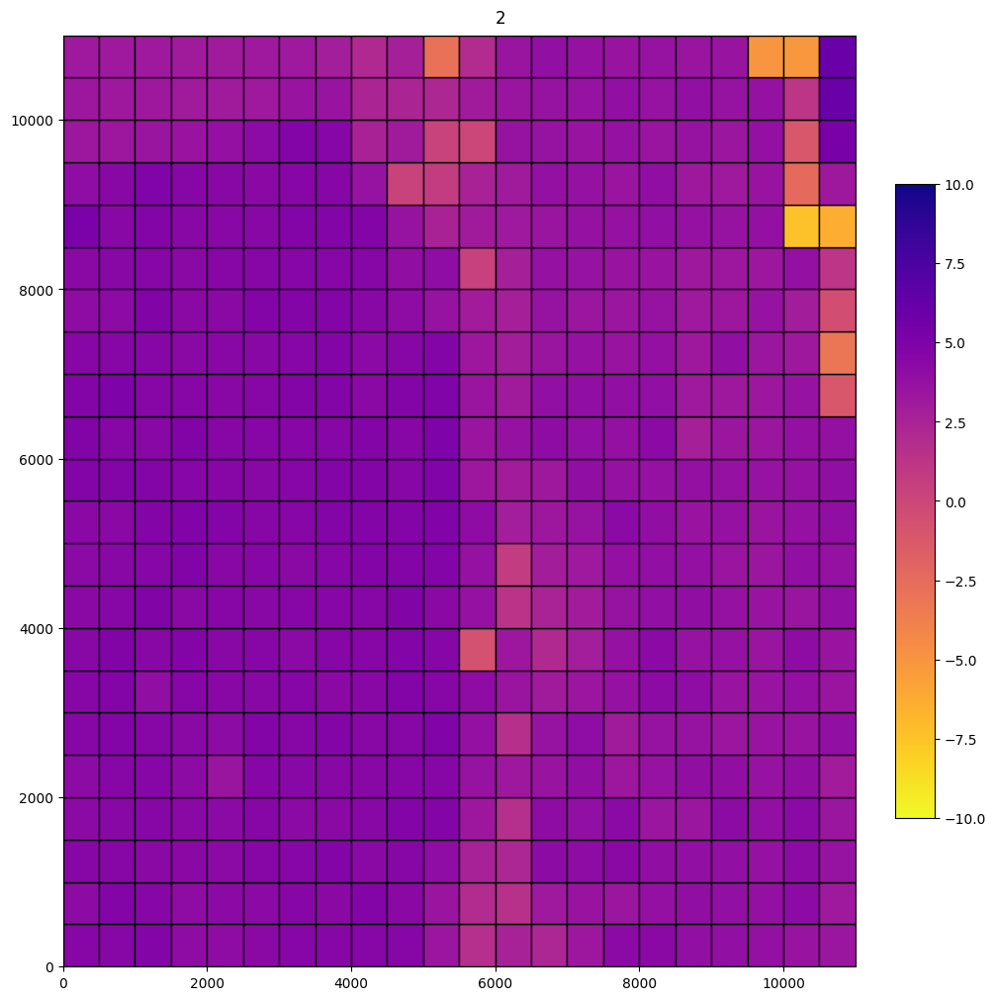

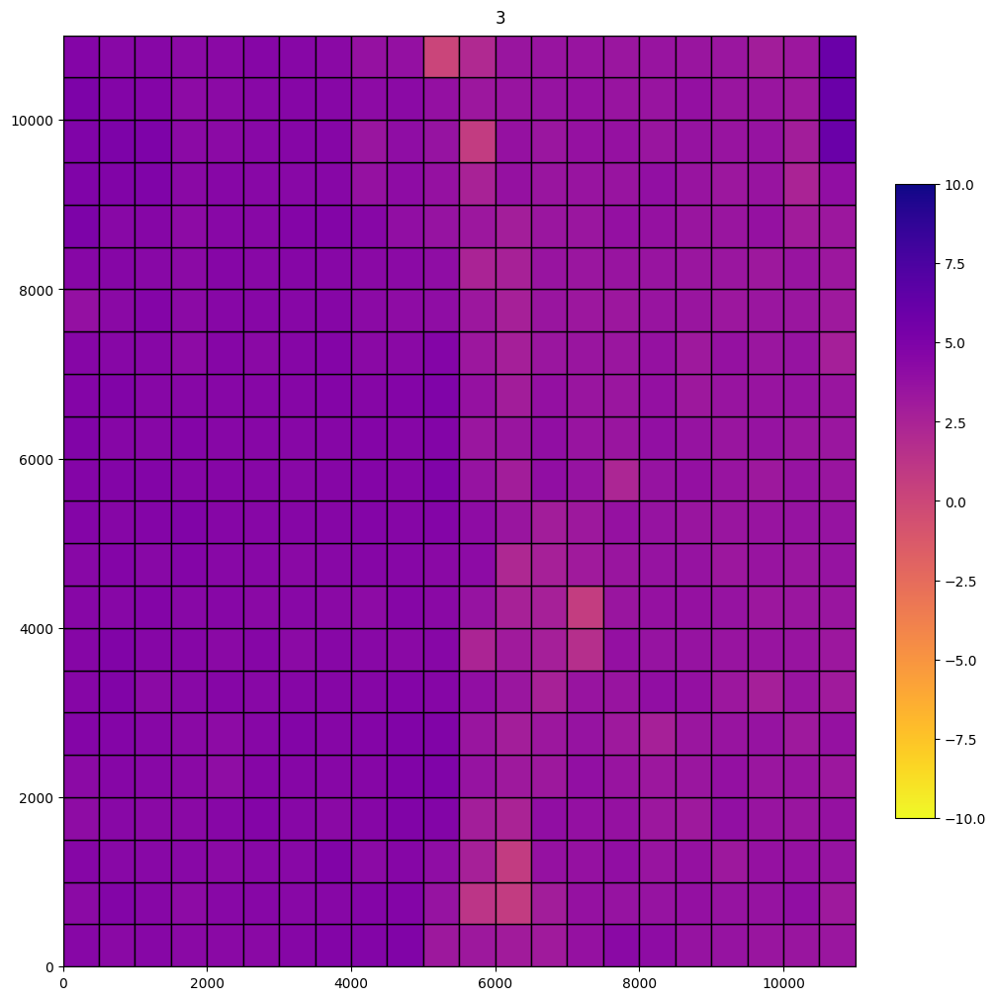

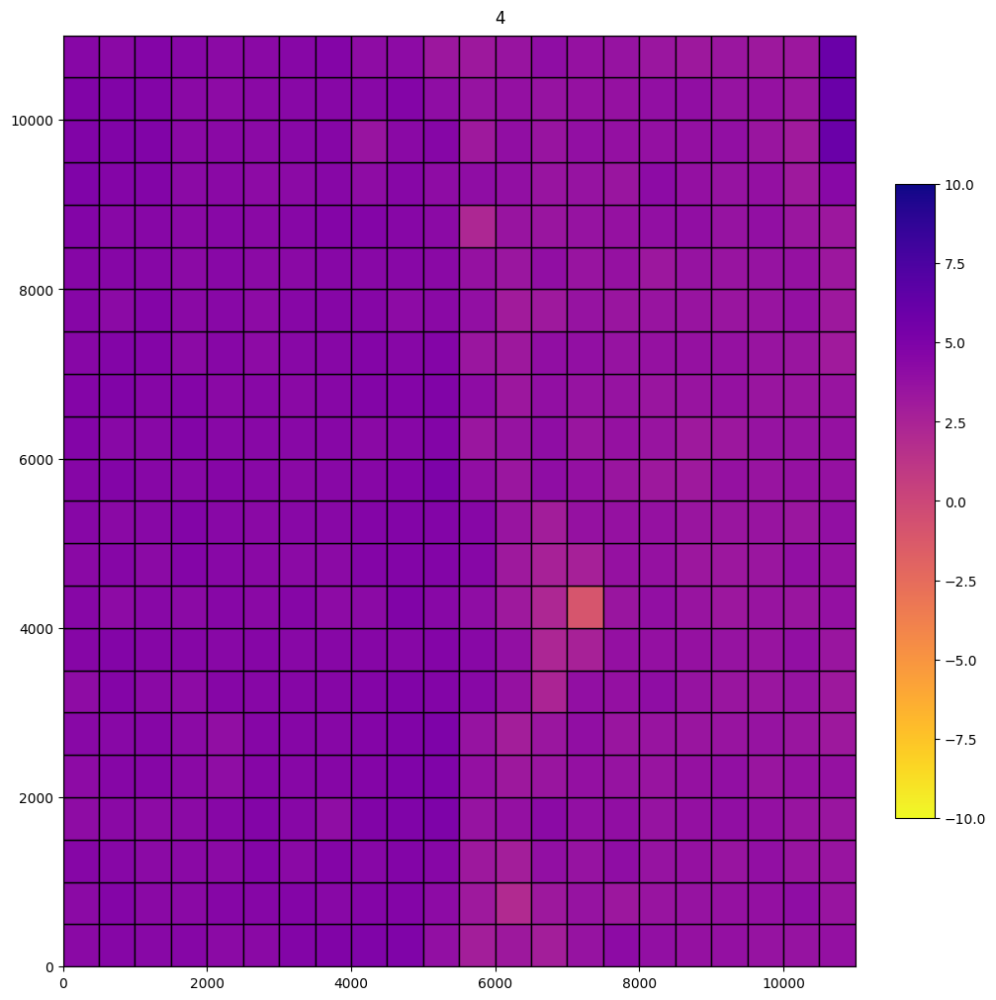

  0%|          | 0/484 [00:00<?, ?it/s]

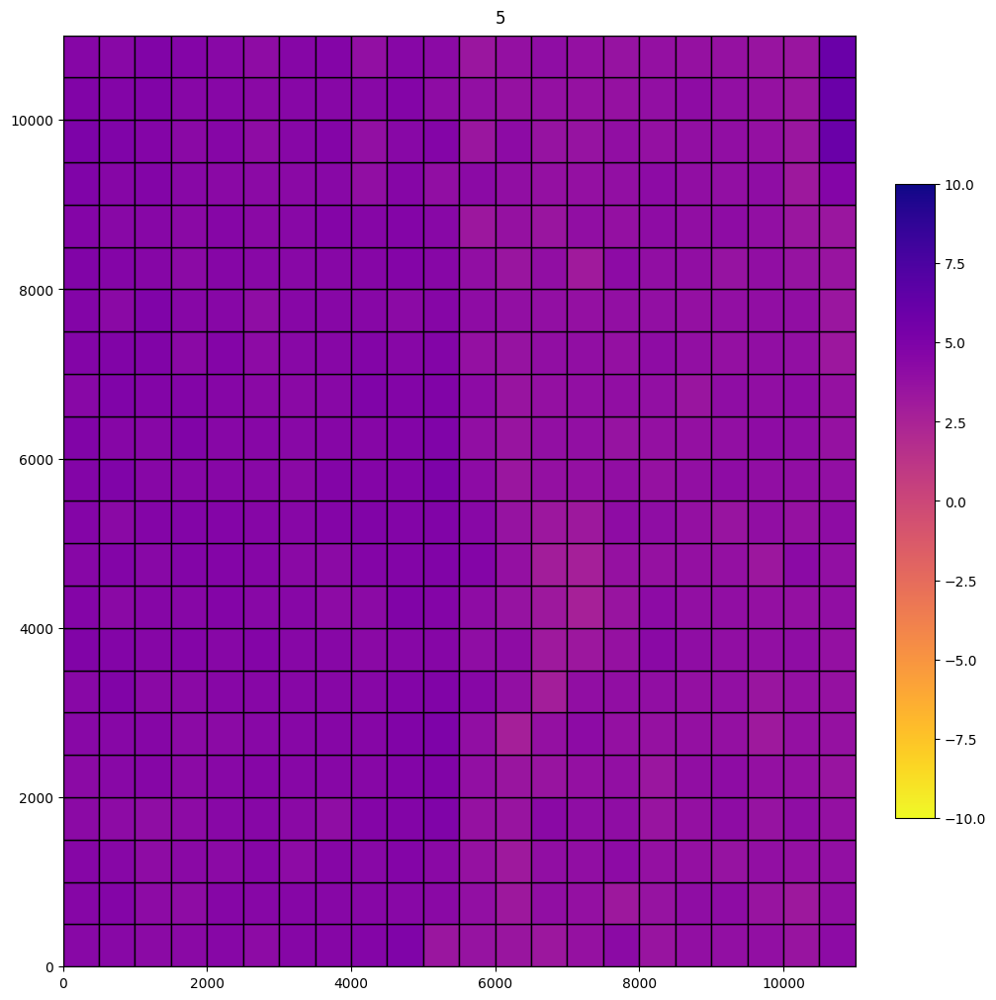

  0%|          | 0/484 [00:00<?, ?it/s]

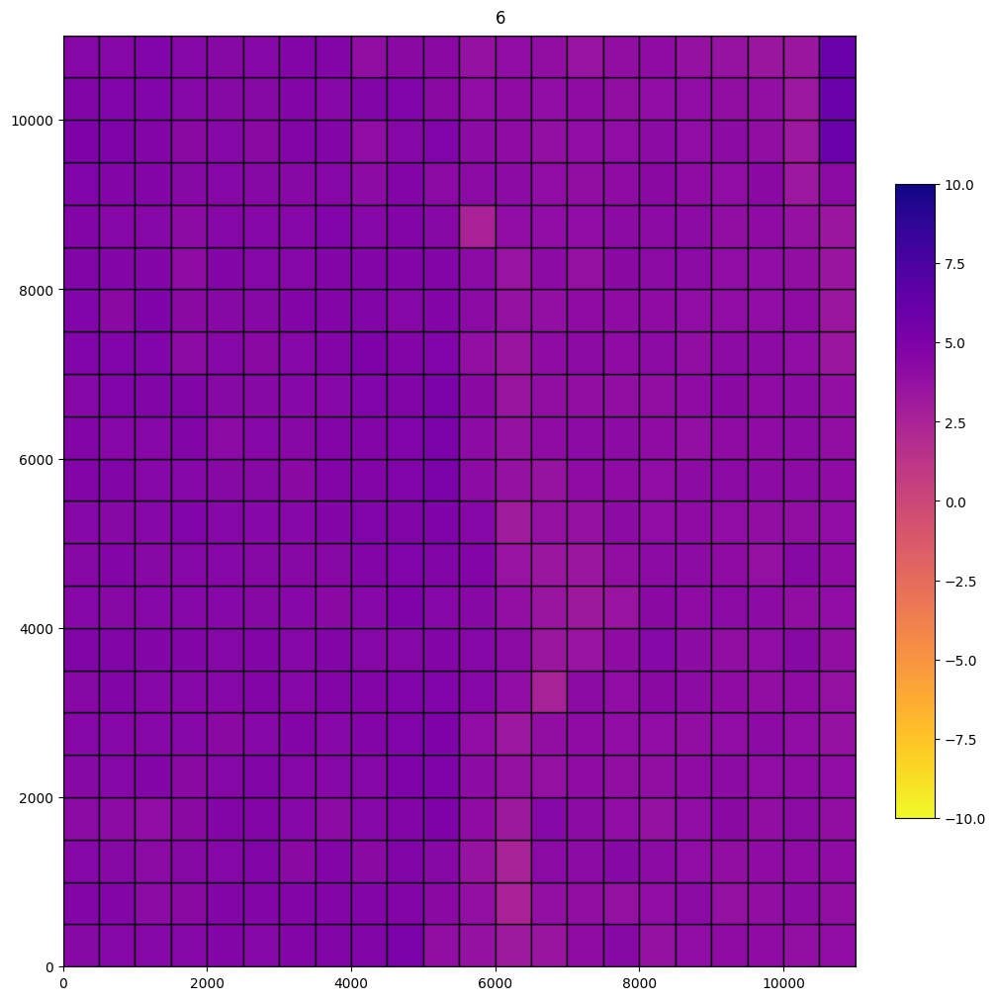

  0%|          | 0/484 [00:00<?, ?it/s]

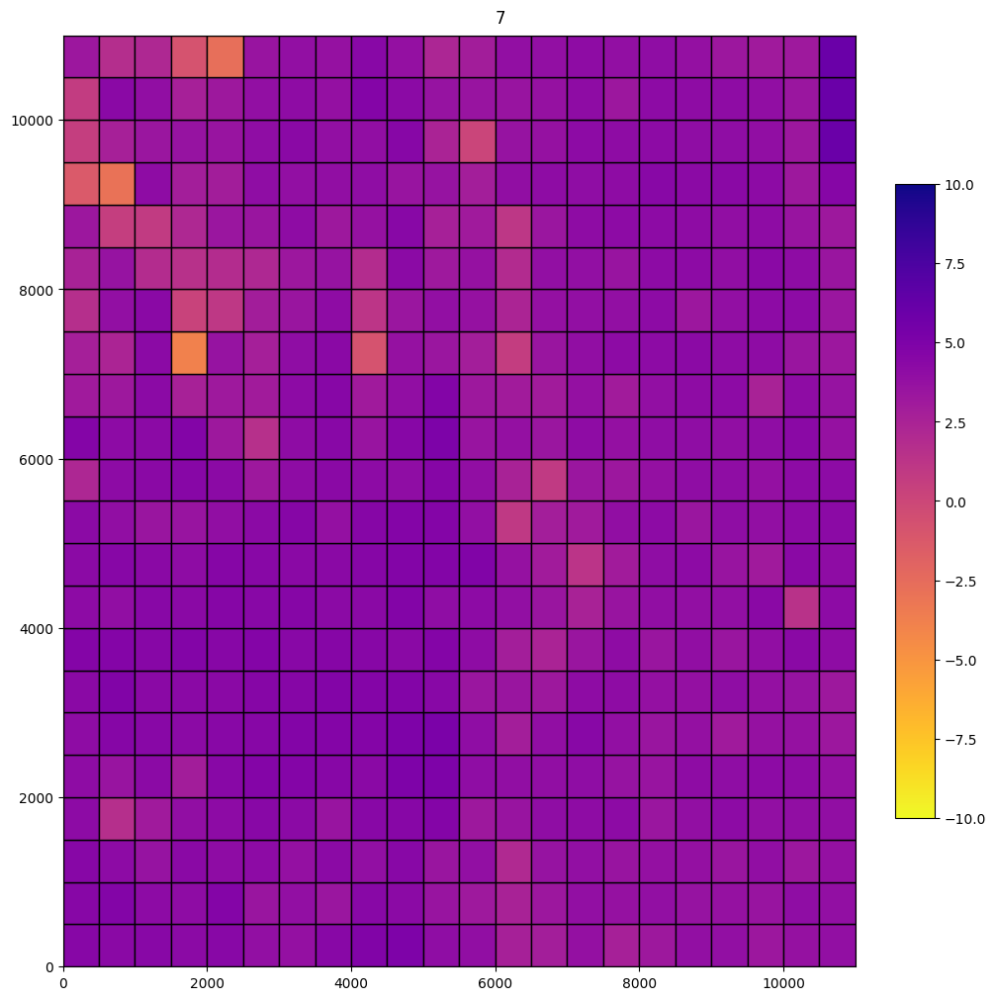

  0%|          | 0/484 [00:00<?, ?it/s]

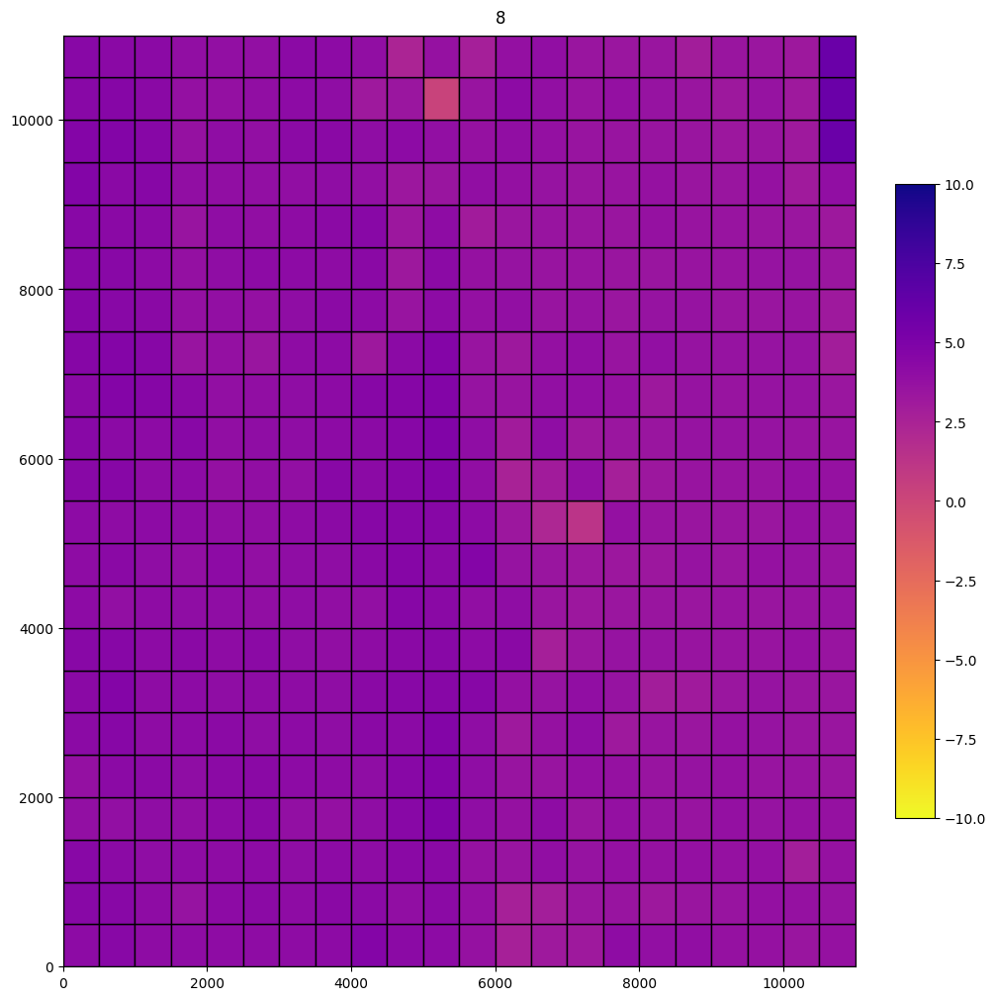

  0%|          | 0/484 [00:00<?, ?it/s]

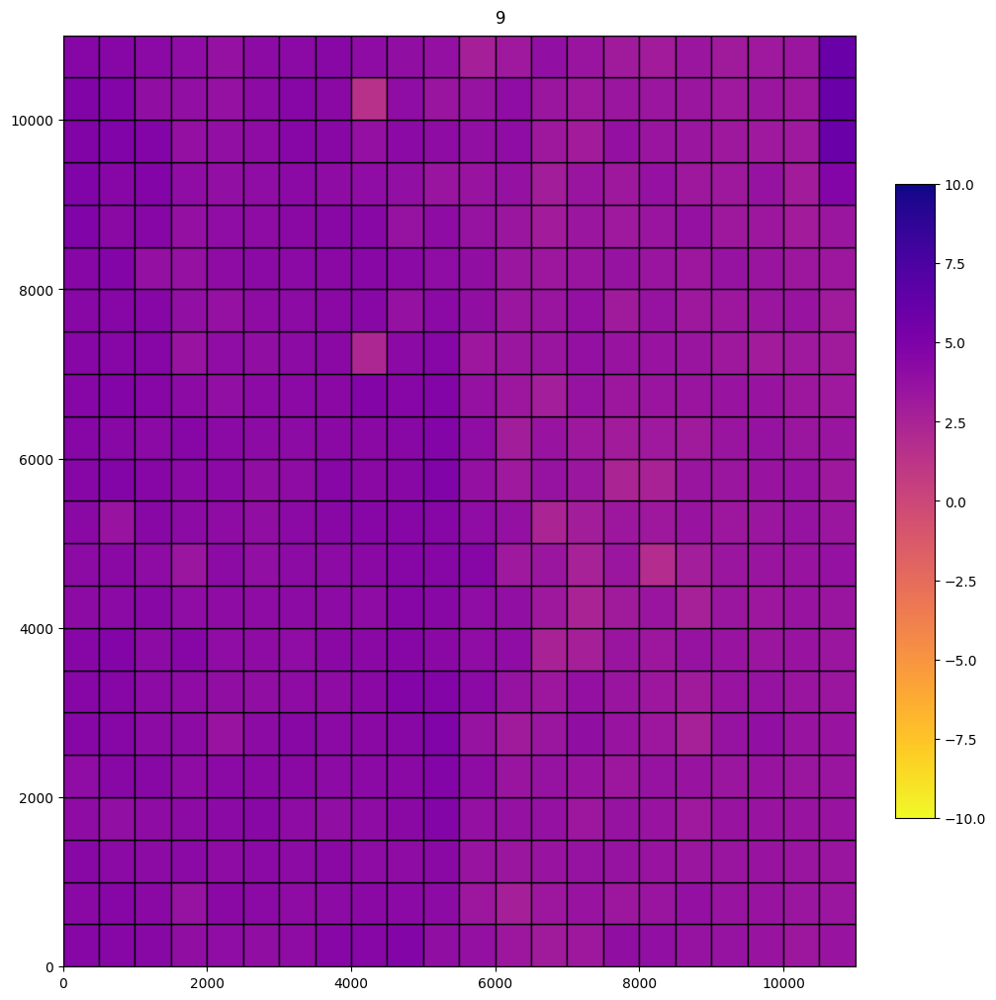

  0%|          | 0/484 [00:00<?, ?it/s]

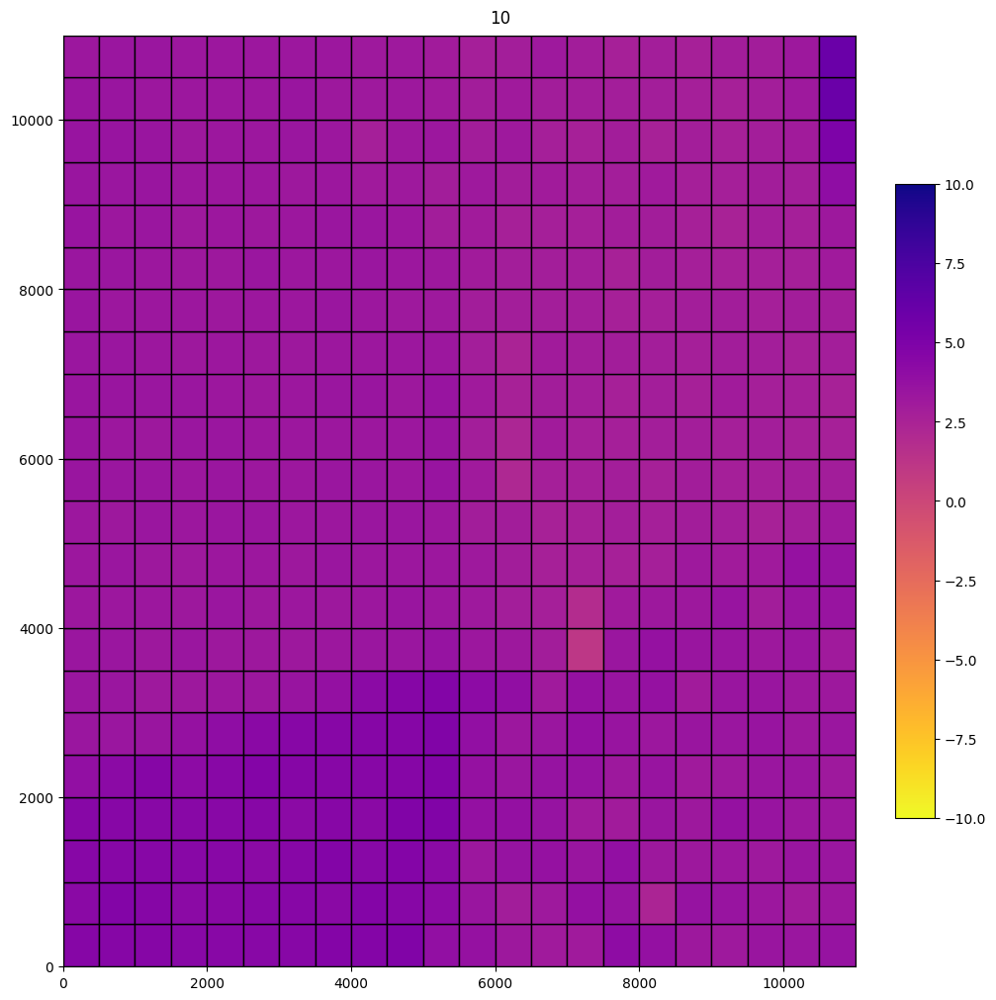

  0%|          | 0/484 [00:00<?, ?it/s]

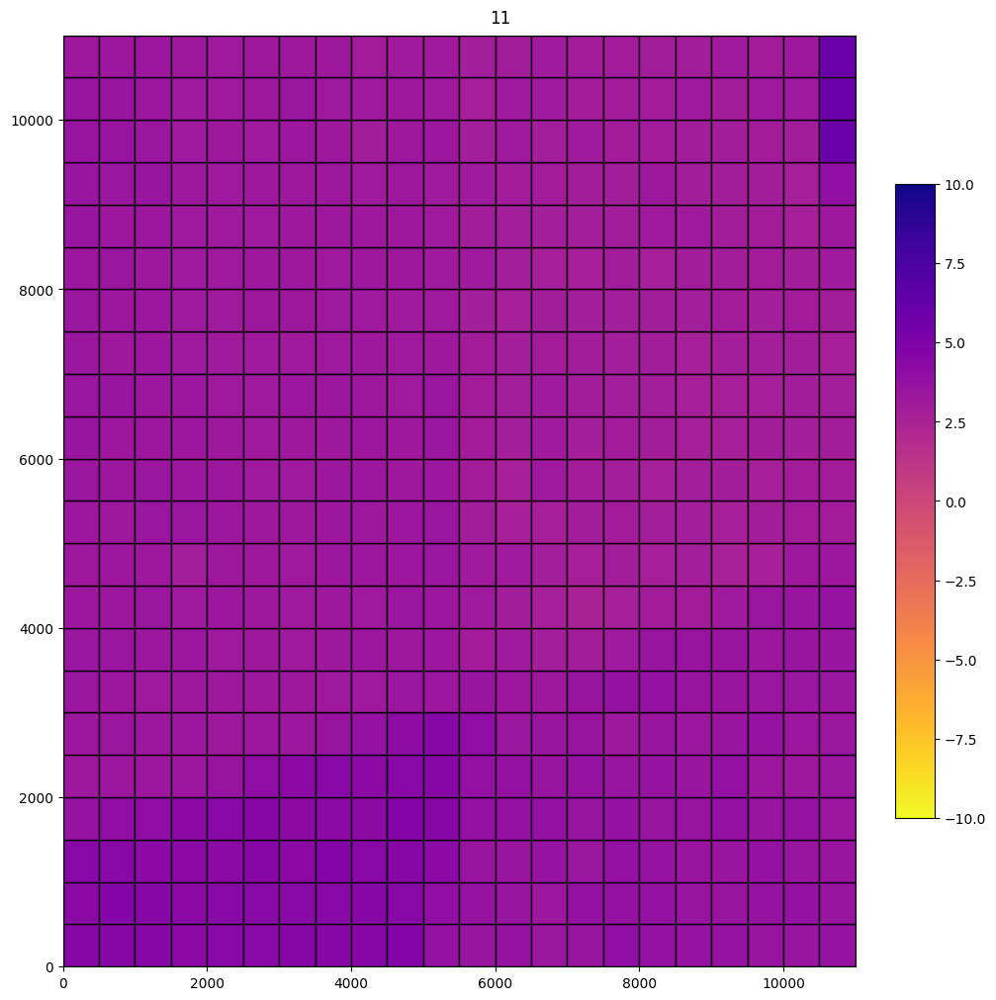

  0%|          | 0/484 [00:00<?, ?it/s]

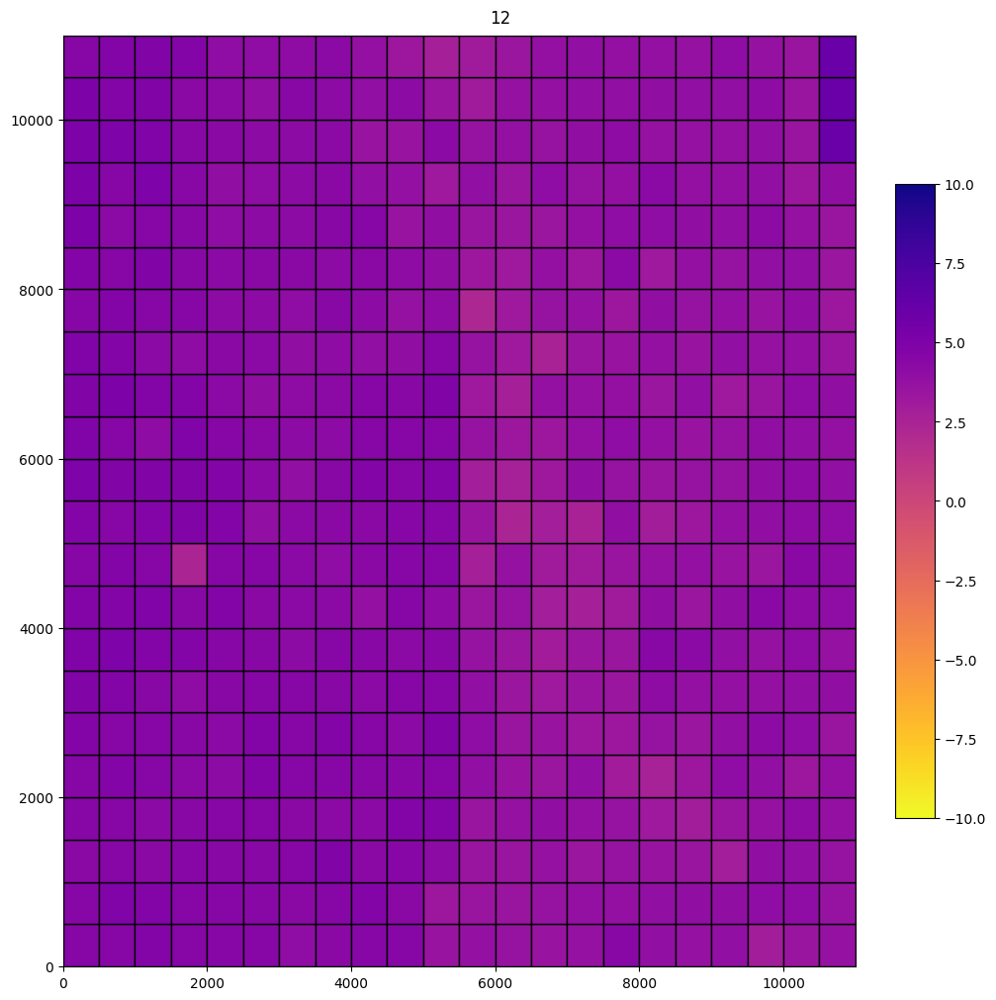

In [160]:
plt.close('all')
for m0 in trange(1, 13):
    ms = range(m0, m0 + 1)
    box_to_score = {}

    if m0 not in m_to_box_to_score:
        for w in tqdm(windows):
            window_embeddings = np.array([next(iter(d.values())) for d in box_to_embeddings[w]])
            month_embeddings_train = {}
            month_embeddings_2021 = {}
            for month in ms:
                month_embeddings_train[month] = []
                month_embeddings_2021[month] = []
                for t, e in zip(timestamps, window_embeddings):
                    Y, M, _ = t.split('-')
                    Y = int(Y)
                    M = int(M)
                    if M == month:
                        if 2017 <= Y < 2021:
                            month_embeddings_train[month].append(e)
                        elif Y == 2021:
                            month_embeddings_2021[month].append(e)
                        else:
                            continue
                month_embeddings_train[month] = np.stack(month_embeddings_train[month])
                month_embeddings_2021[month] = np.stack(month_embeddings_2021[month])
                mu = month_embeddings_train[month].mean(axis=0)
                sigma = month_embeddings_train[month].std(axis=0)
                month_embeddings_train[m] = np.nan_to_num((month_embeddings_train[month] - mu) / sigma)
                month_embeddings_2021[m] = np.nan_to_num((month_embeddings_2021[month] - mu) / sigma)

            gmm = GaussianMixture(n_components=1, covariance_type='diag')
            gmm.fit(np.concatenate([month_embeddings_train[m] for m in ms]))

            ll = gmm.score_samples(np.concatenate([month_embeddings_2021[m] for m in ms])) / 512
            box_to_score[w] = ll.max()
    
        m_to_box_to_score[m0] = box_to_score
    else:
        box_to_score = m_to_box_to_score[m0]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10), constrained_layout=True, squeeze=True)
    fig.suptitle(str(m0))
    patches = []
    for w in windows:
        p = Polygon(w.to_points())
        patches.append(p)

    scores = np.array([box_to_score[w] for w in windows])
    cmap = plt.get_cmap('plasma_r')
    norm = colors.Normalize(vmin=-10, vmax=10)
    pc = PatchCollection(patches, fc=cmap(norm(scores)), ec='k', cmap=cmap, norm=norm)
    ax.add_collection(pc)
    # ax.autoscale()
    cbar = fig.colorbar(pc, ax=ax, fraction=0.05, pad=0.05, orientation='vertical', aspect=16)
    ax.set_xlim((0, 11_000))
    ax.set_ylim((0, 11_000))

    plt.show()
    # break

## 2022

In [224]:
m_to_box_to_score = {}

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/484 [00:00<?, ?it/s]

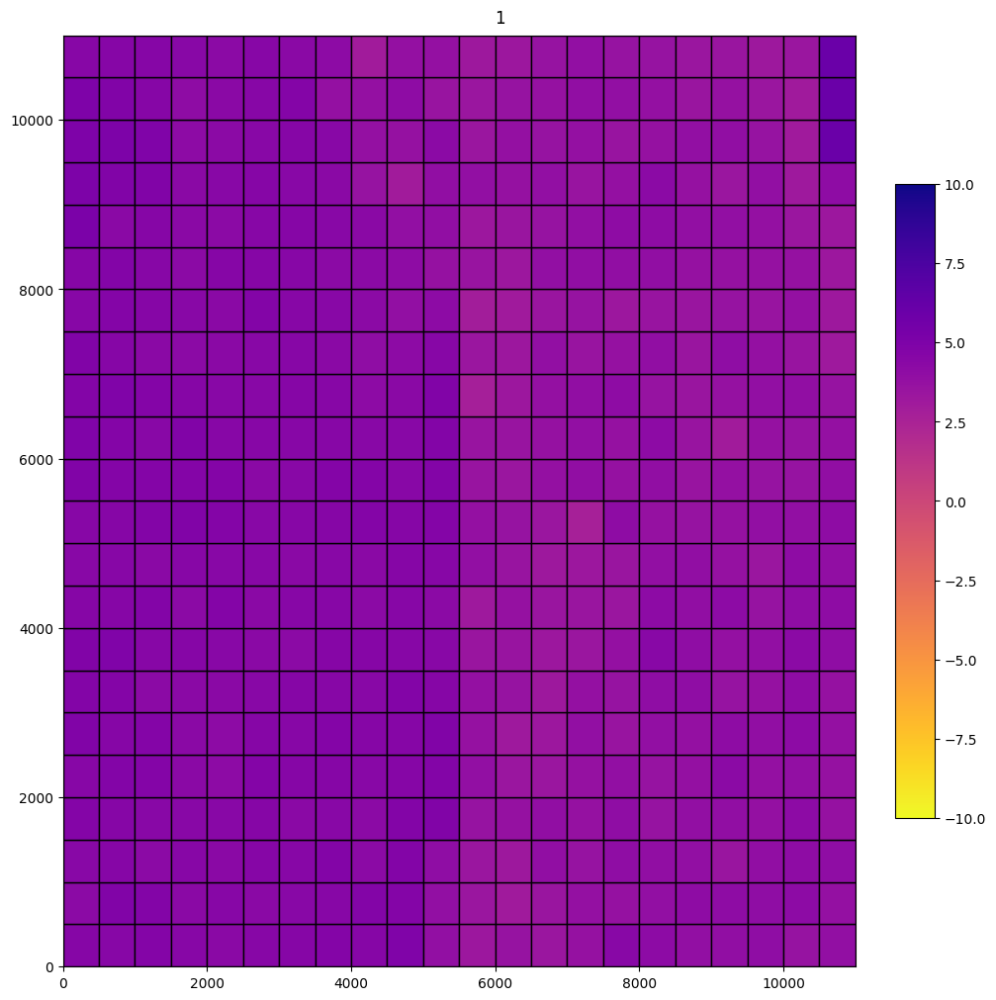

  0%|          | 0/484 [00:00<?, ?it/s]

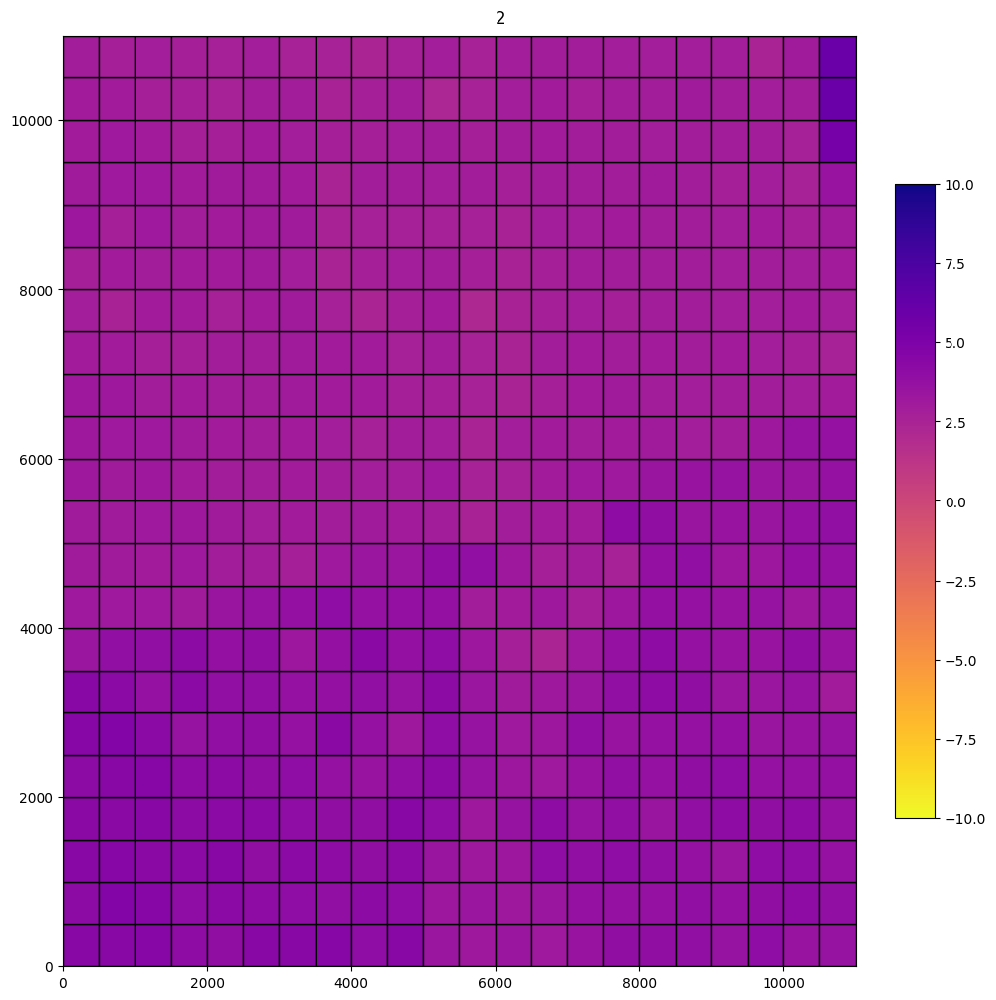

  0%|          | 0/484 [00:00<?, ?it/s]

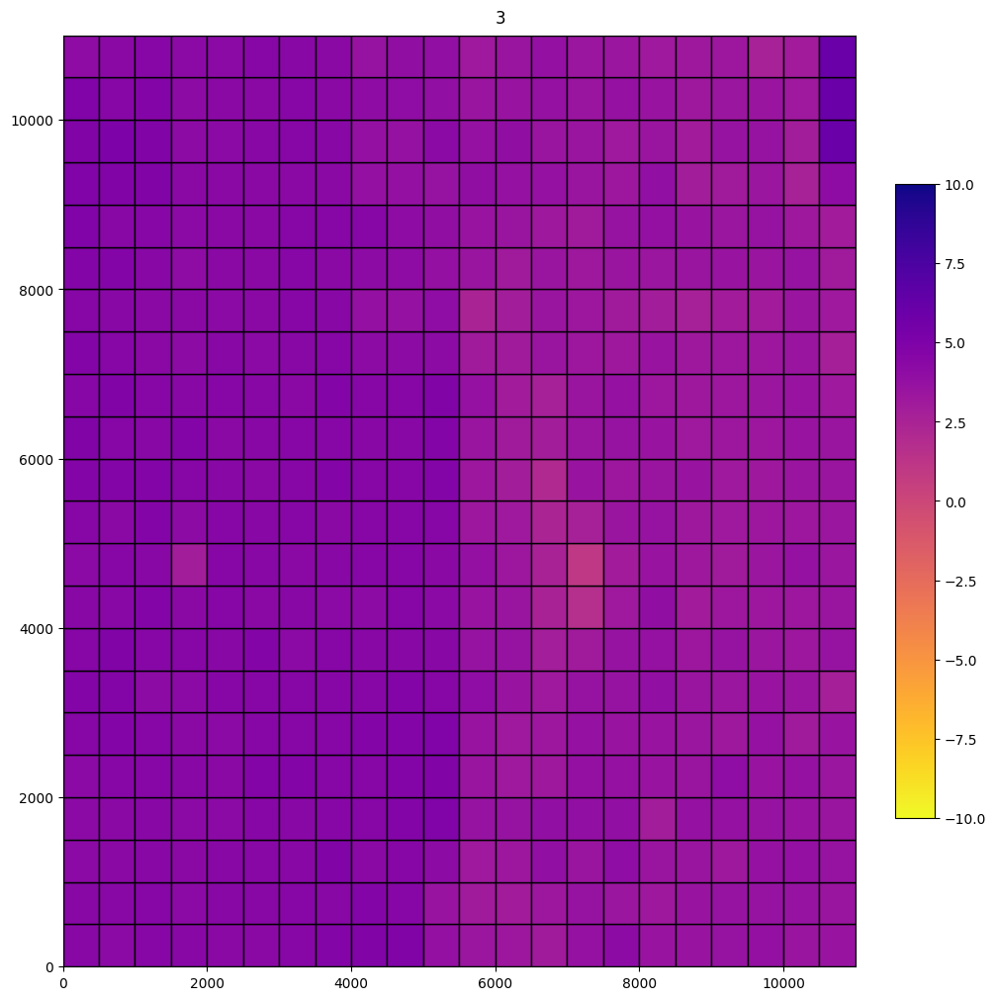

  0%|          | 0/484 [00:00<?, ?it/s]

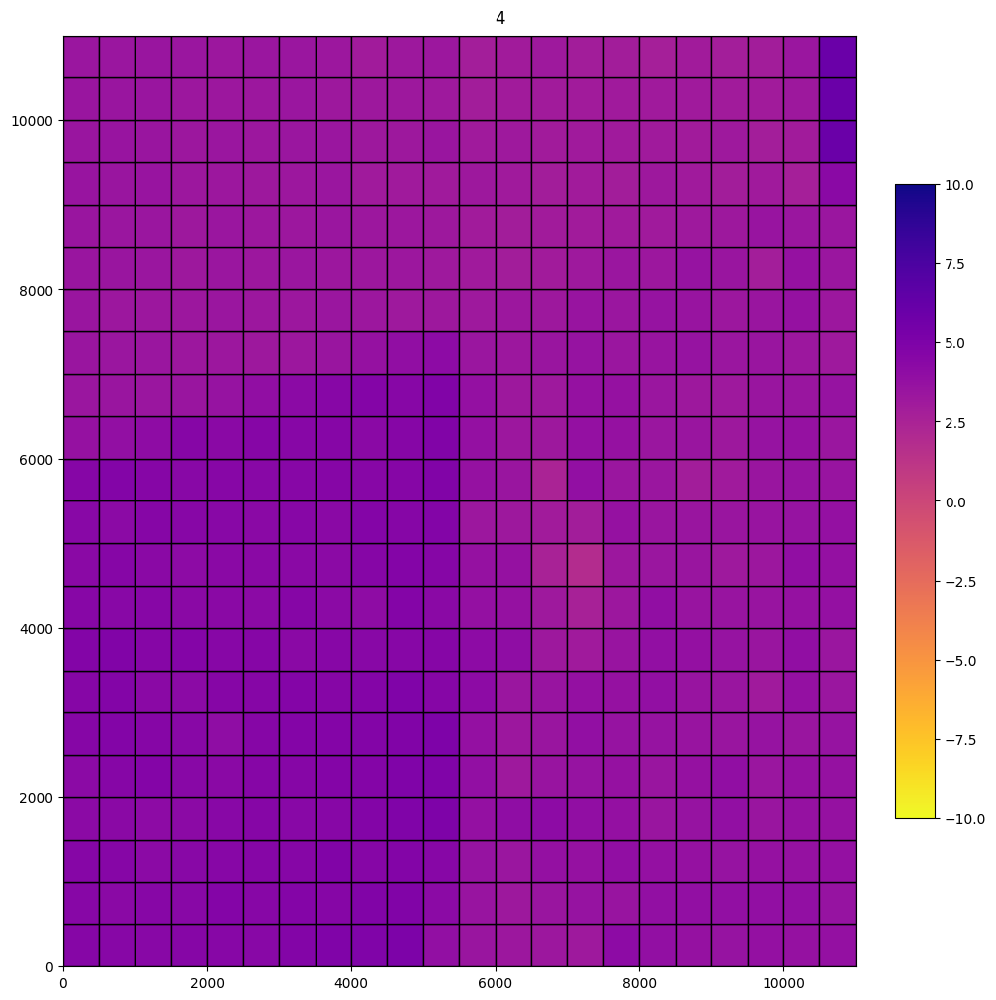

  0%|          | 0/484 [00:00<?, ?it/s]

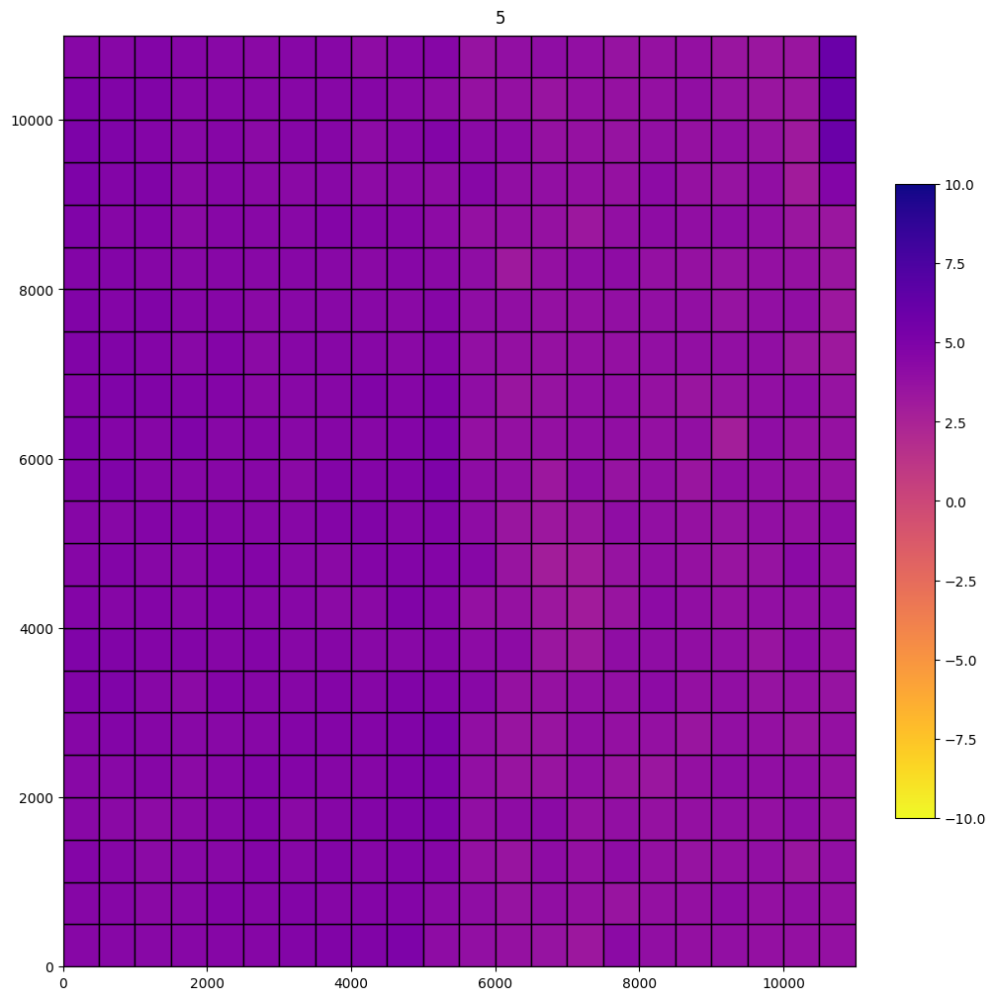

  0%|          | 0/484 [00:00<?, ?it/s]

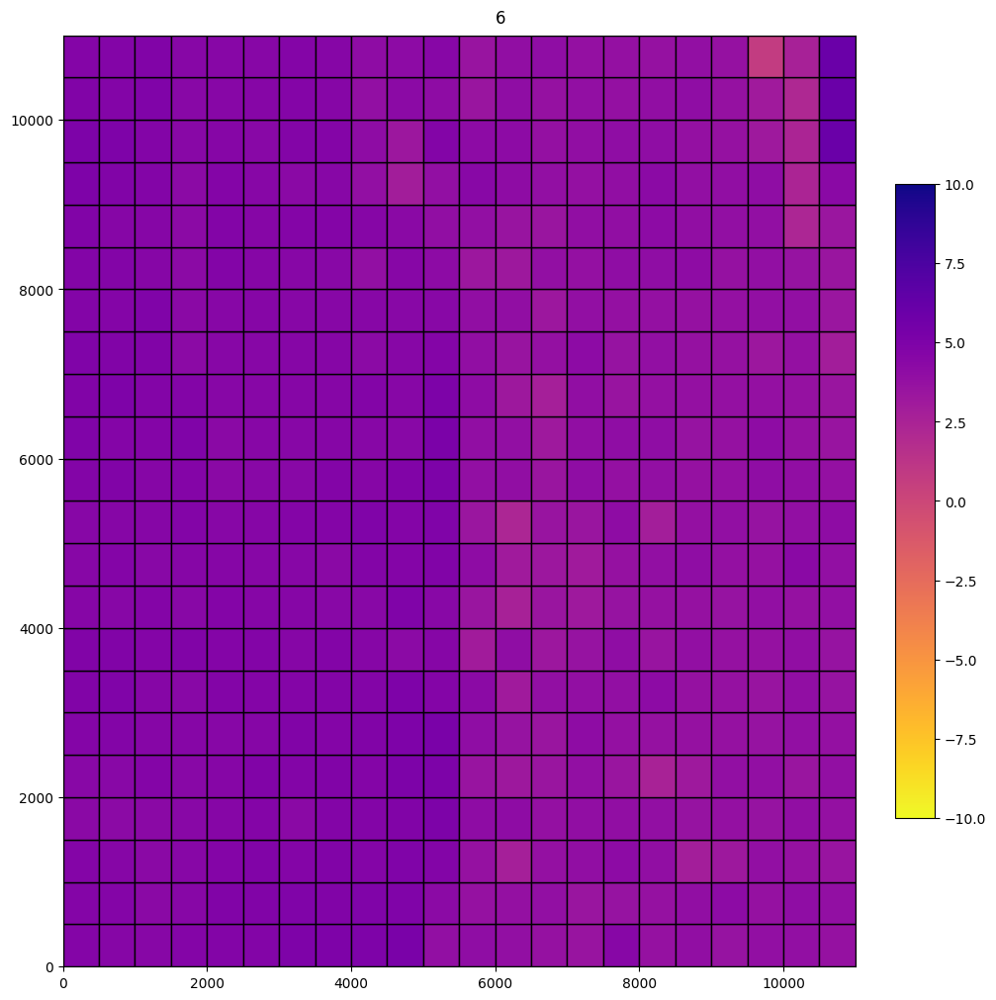

  0%|          | 0/484 [00:00<?, ?it/s]

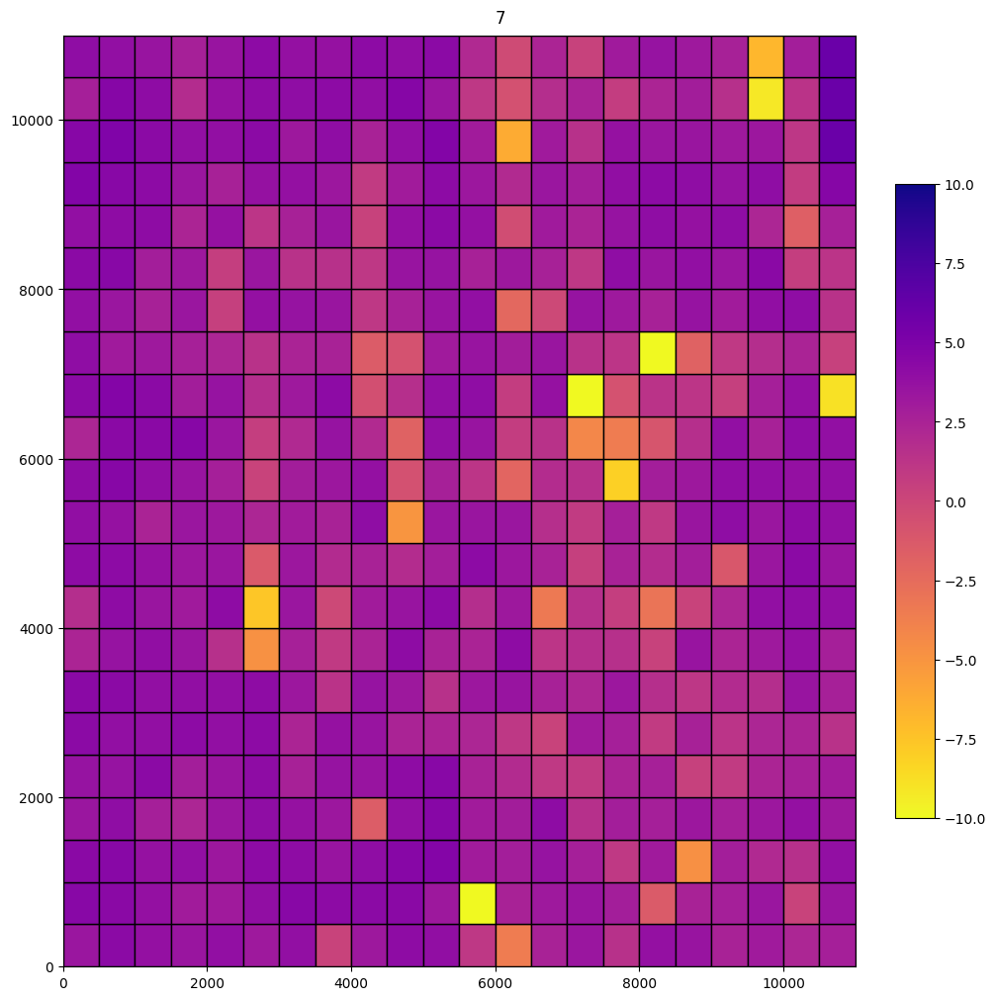

  0%|          | 0/484 [00:00<?, ?it/s]

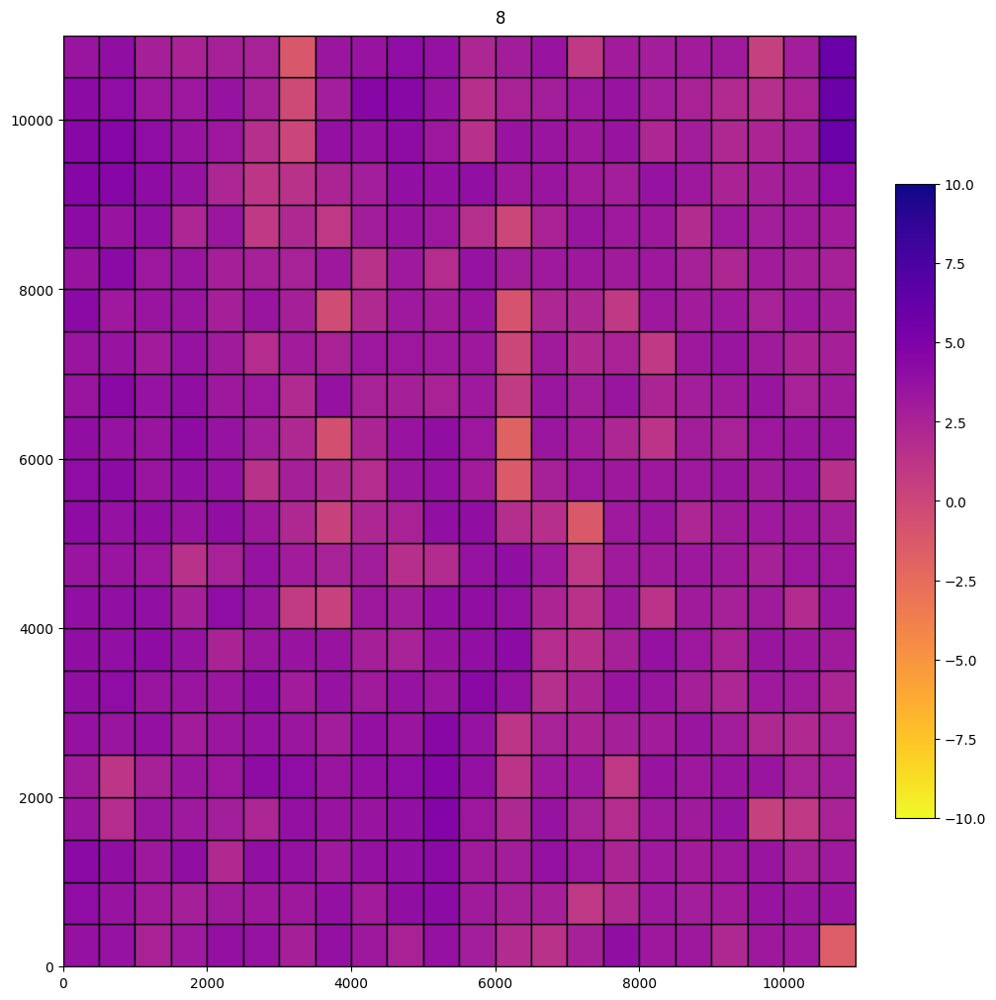

  0%|          | 0/484 [00:00<?, ?it/s]

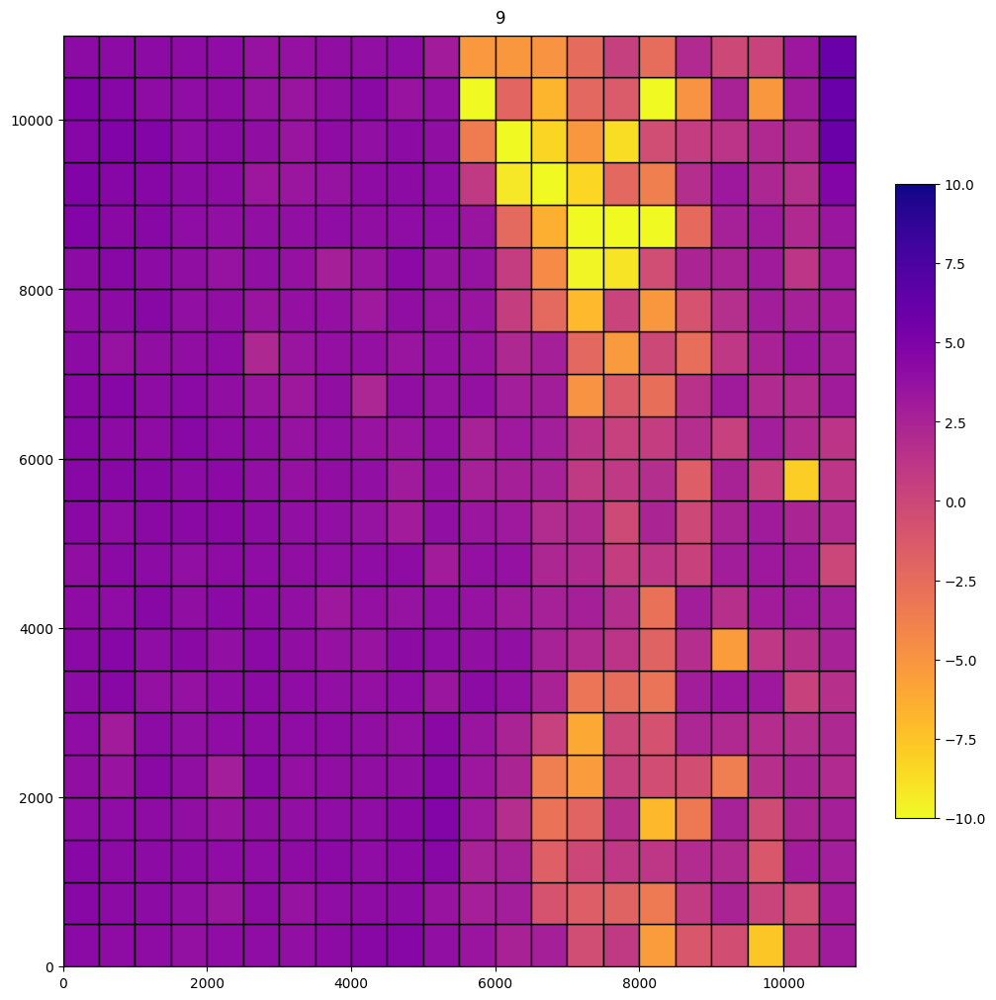

  0%|          | 0/484 [00:00<?, ?it/s]

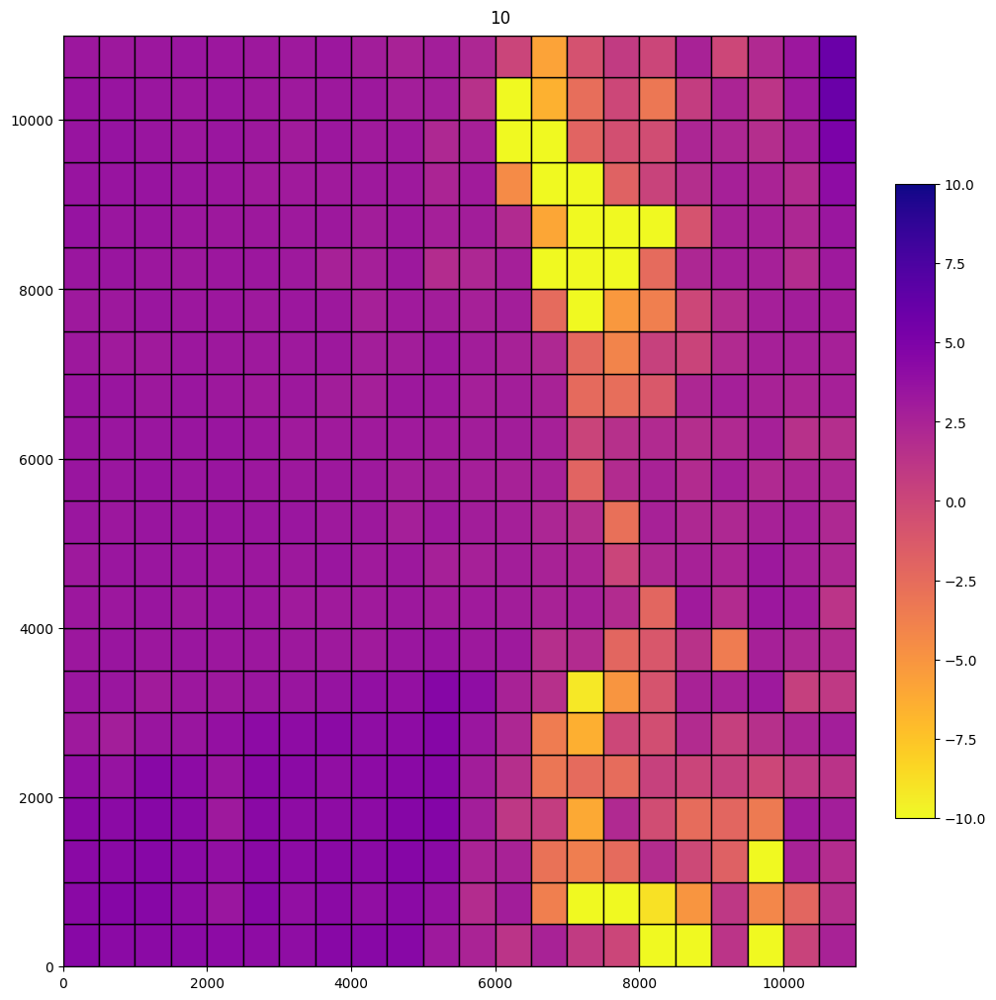

  0%|          | 0/484 [00:00<?, ?it/s]

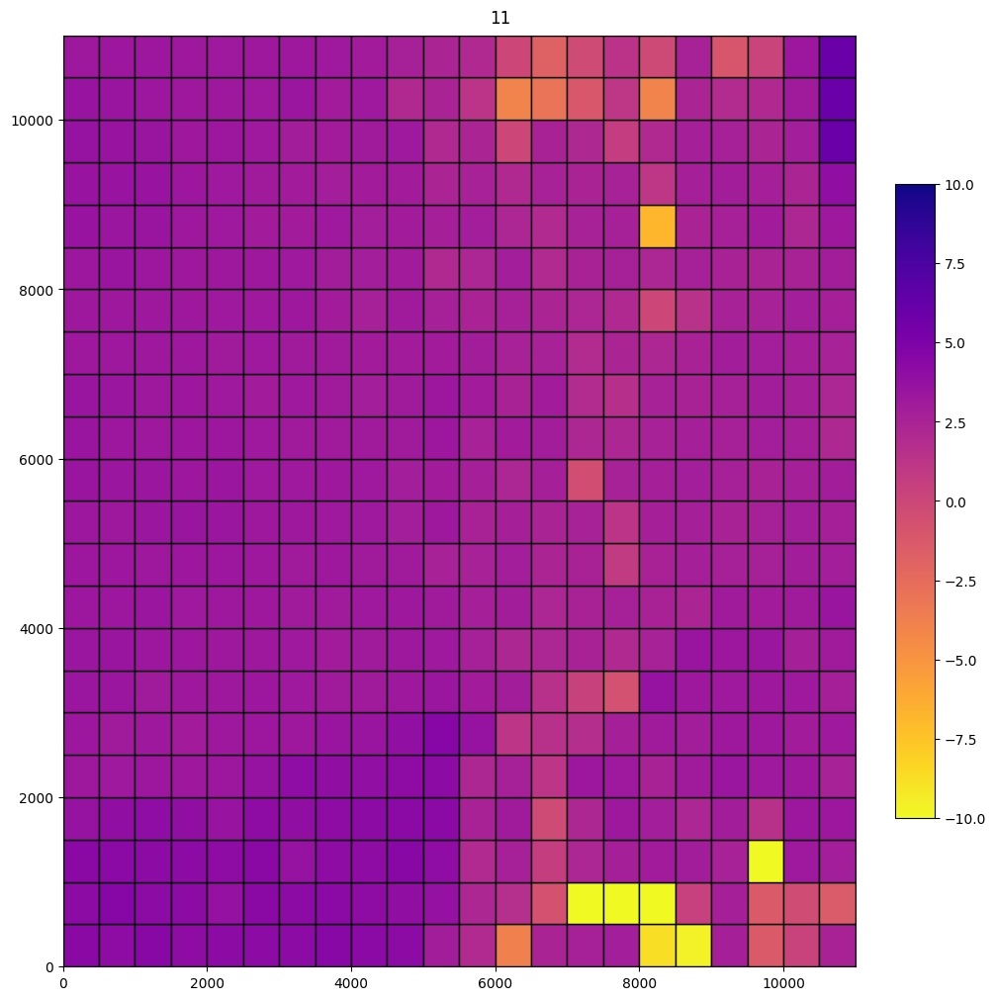

  0%|          | 0/484 [00:00<?, ?it/s]

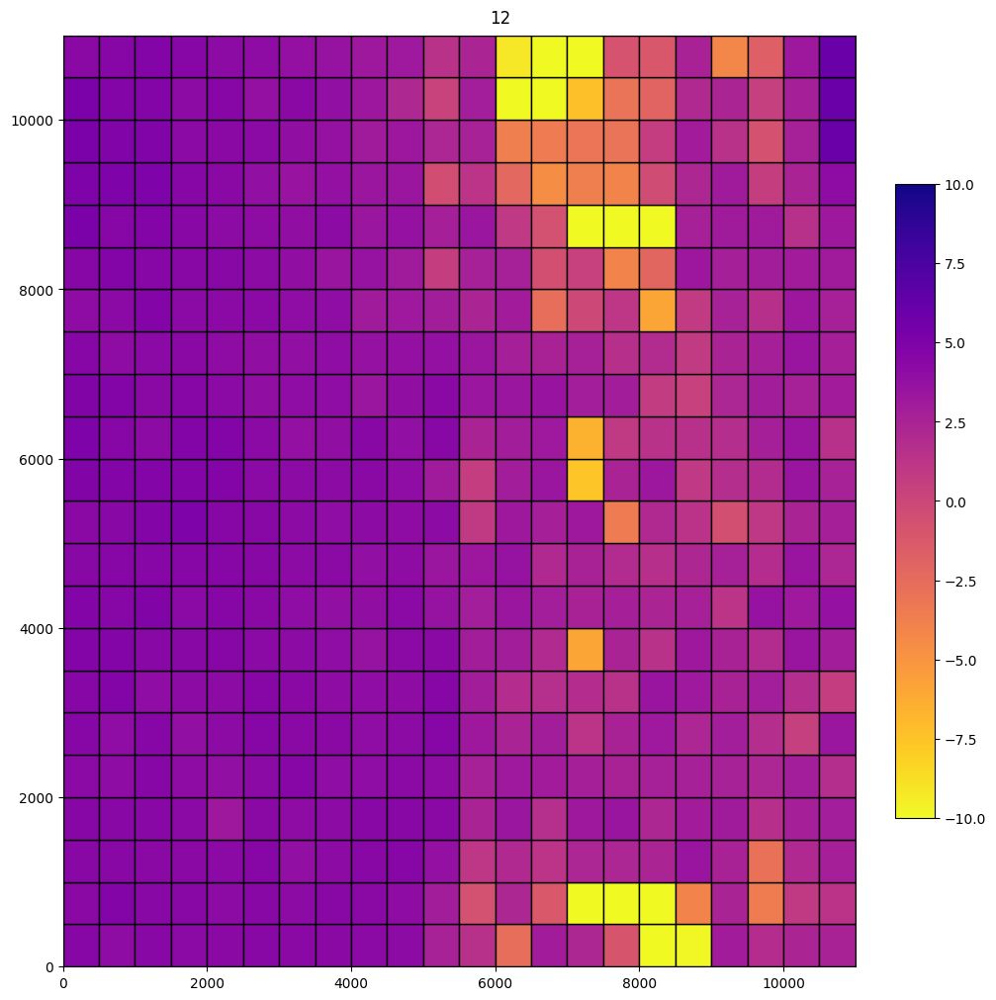

In [162]:
plt.close('all')
for m0 in trange(1, 13):
    ms = range(m0, m0 + 1)
    box_to_score = {}

    if m0 not in m_to_box_to_score:
        for w in tqdm(windows):
            window_embeddings = np.array([next(iter(d.values())) for d in box_to_embeddings[w]])
            month_embeddings_train = {}
            month_embeddings_pred = {}
            for month in ms:
                month_embeddings_train[month] = []
                month_embeddings_pred[month] = []
                for t, e in zip(timestamps, window_embeddings):
                    Y, M, _ = t.split('-')
                    Y = int(Y)
                    M = int(M)
                    if M == month:
                        if 2017 <= Y < 2022:
                            month_embeddings_train[month].append(e)
                        elif Y == 2022:
                            month_embeddings_pred[month].append(e)
                        else:
                            continue
                month_embeddings_train[month] = np.stack(month_embeddings_train[month])
                month_embeddings_pred[month] = np.stack(month_embeddings_pred[month])
                mu = month_embeddings_train[month].mean(axis=0)
                sigma = month_embeddings_train[month].std(axis=0)
                month_embeddings_train[m] = np.nan_to_num((month_embeddings_train[month] - mu) / sigma)
                month_embeddings_pred[m] = np.nan_to_num((month_embeddings_pred[month] - mu) / sigma)

            gmm = GaussianMixture(n_components=1, covariance_type='diag')
            gmm.fit(np.concatenate([month_embeddings_train[m] for m in ms]))

            ll = gmm.score_samples(np.concatenate([month_embeddings_pred[m] for m in ms])) / 512
            box_to_score[w] = ll.max()
    
        m_to_box_to_score[m0] = box_to_score
    else:
        box_to_score = m_to_box_to_score[m0]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10), constrained_layout=True, squeeze=True)
    fig.suptitle(str(m0))
    patches = []
    for w in windows:
        p = Polygon(w.to_points())
        patches.append(p)

    scores = np.array([box_to_score[w] for w in windows])
    cmap = plt.get_cmap('plasma_r')
    norm = colors.Normalize(vmin=-10, vmax=10)
    pc = PatchCollection(patches, fc=cmap(norm(scores)), ec='k', cmap=cmap, norm=norm)
    ax.add_collection(pc)
    # ax.autoscale()
    cbar = fig.colorbar(pc, ax=ax, fraction=0.05, pad=0.05, orientation='vertical', aspect=16)
    ax.set_xlim((0, 11_000))
    ax.set_ylim((0, 11_000))

    plt.show()
    # break

In [163]:
m_to_box_to_score_2022 = m_to_box_to_score

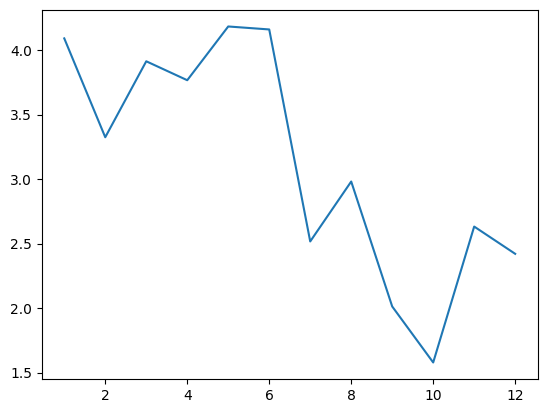

In [202]:
plt.plot(range(1, 13), [np.mean(list(m_to_box_to_score_2022[m].values())) for m in range(1, 13)])
plt.show()

In [200]:
m_to_box_to_score = {}

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/484 [00:00<?, ?it/s]

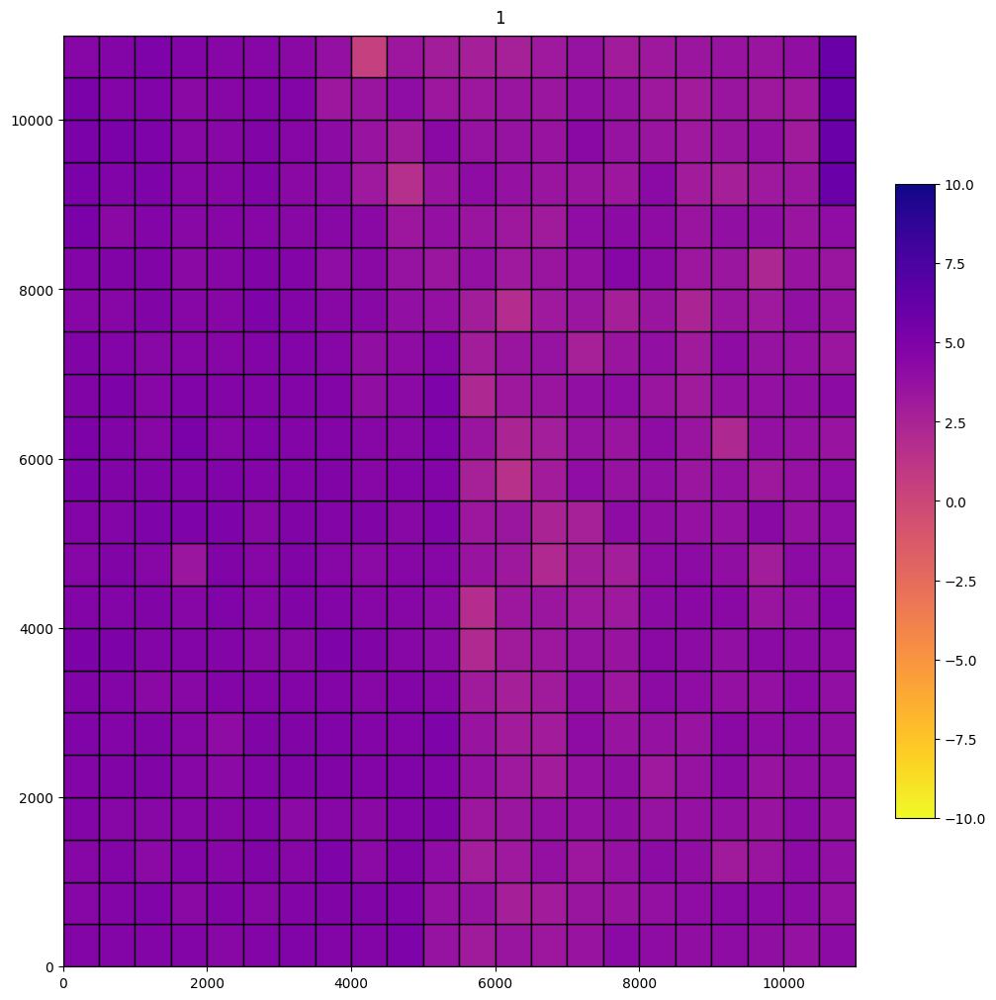

  0%|          | 0/484 [00:00<?, ?it/s]

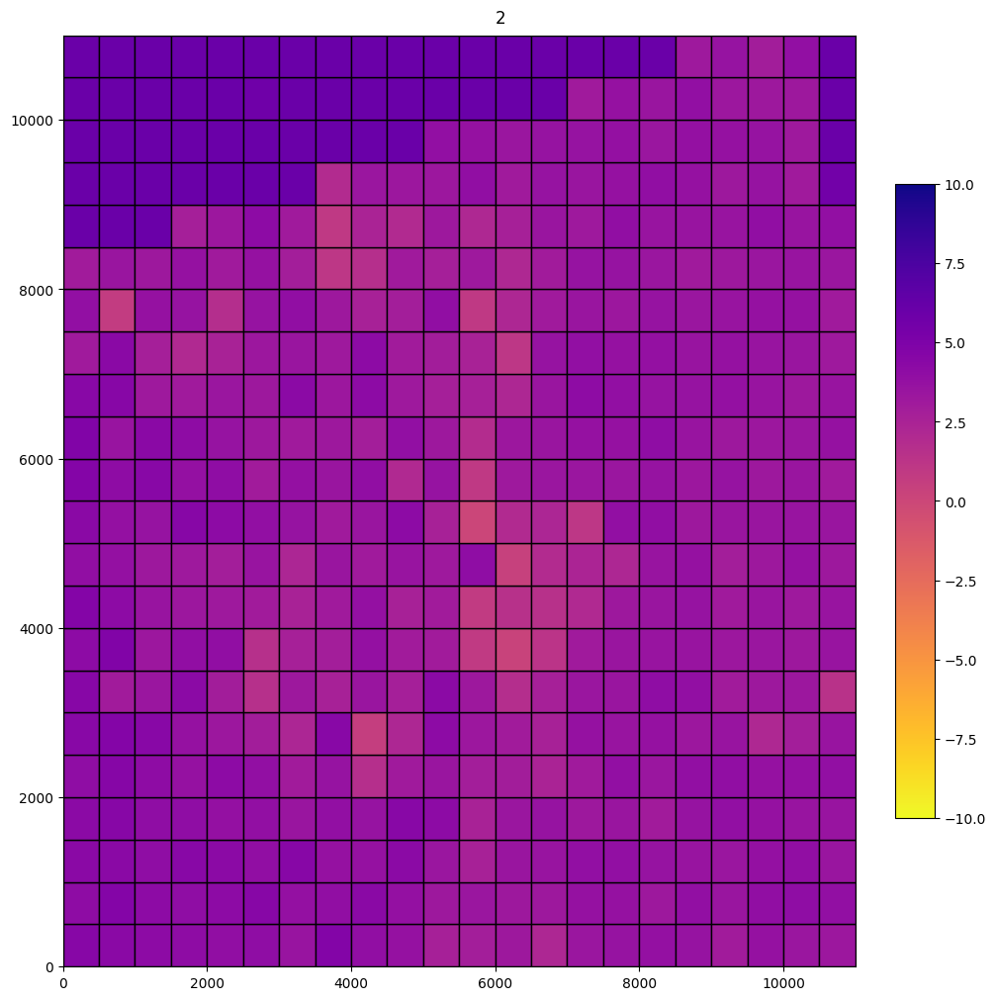

  0%|          | 0/484 [00:00<?, ?it/s]

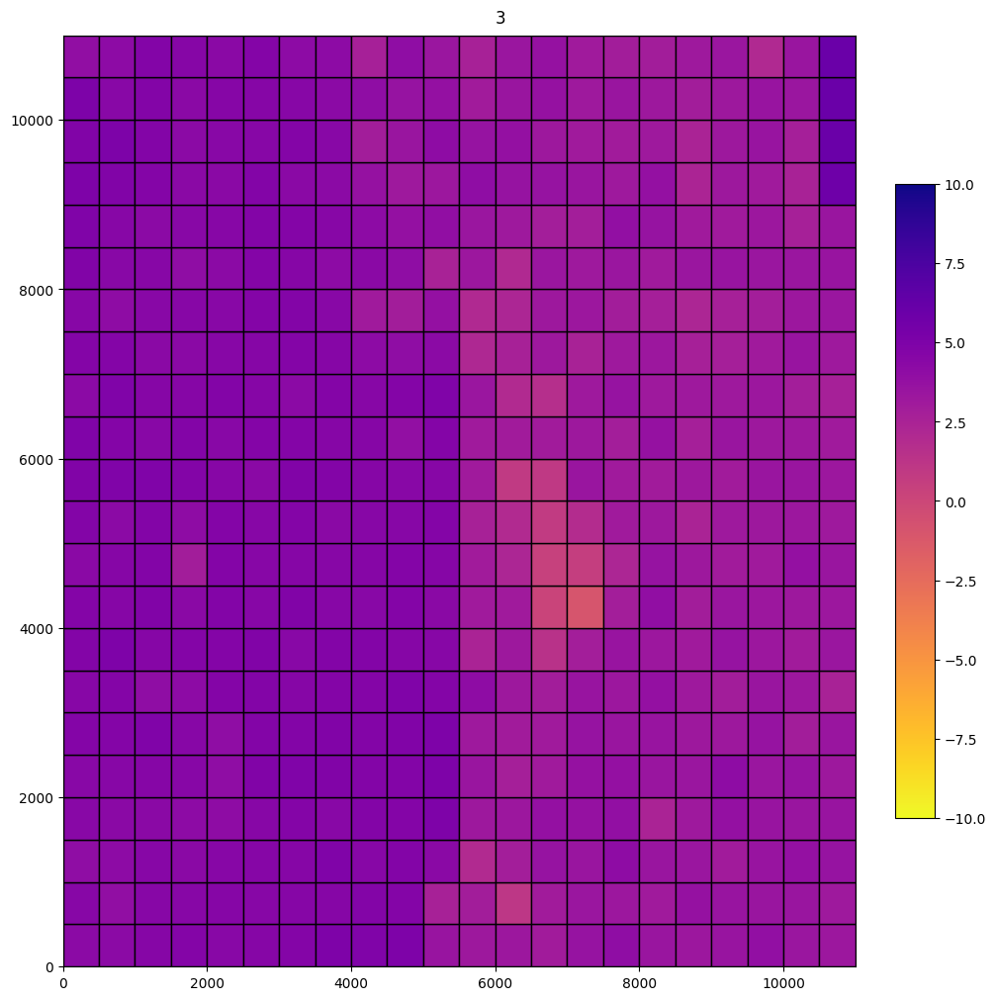

  0%|          | 0/484 [00:00<?, ?it/s]

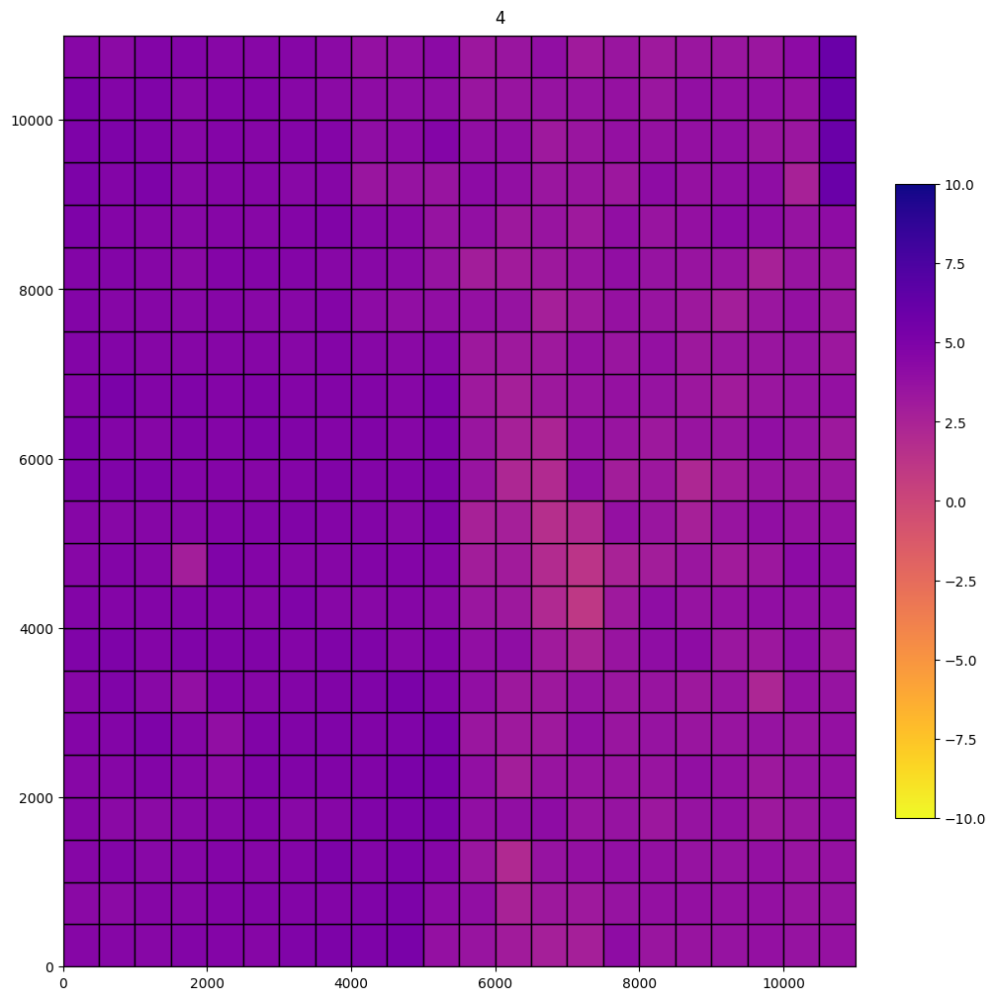

  0%|          | 0/484 [00:00<?, ?it/s]

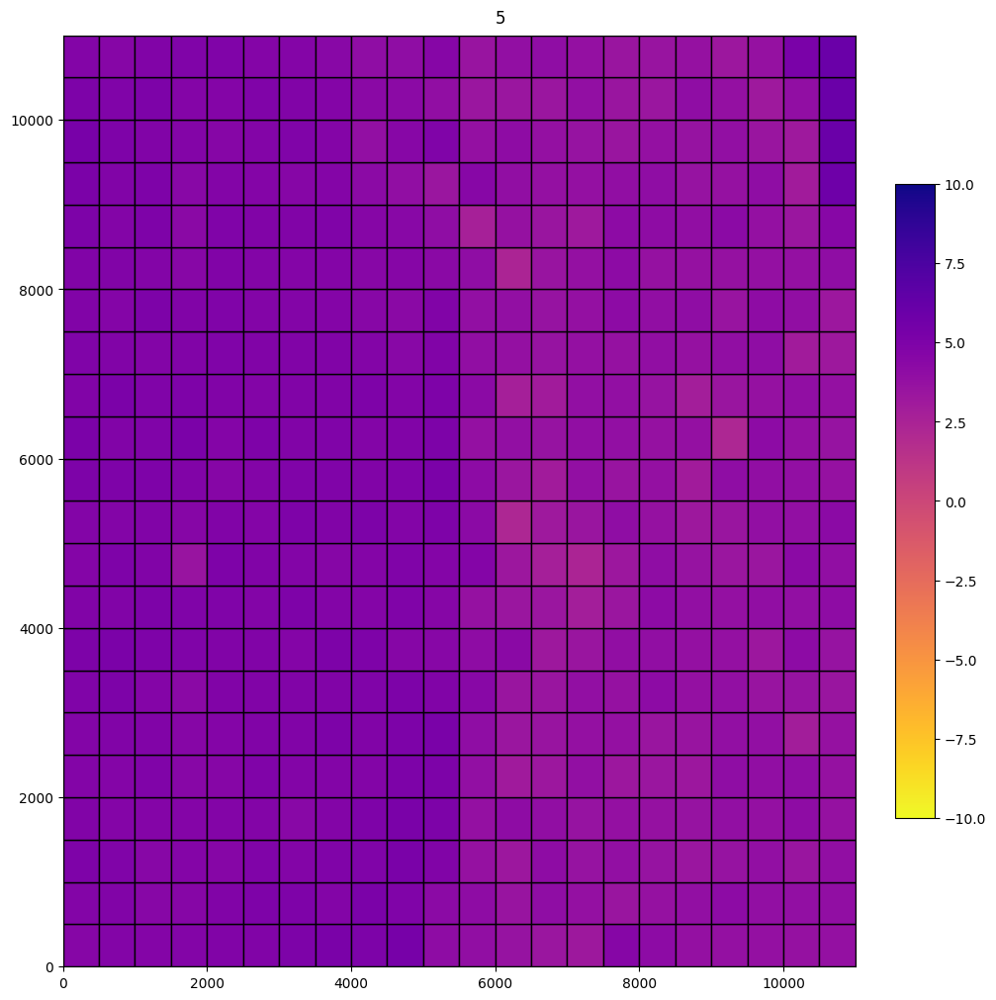

  0%|          | 0/484 [00:00<?, ?it/s]

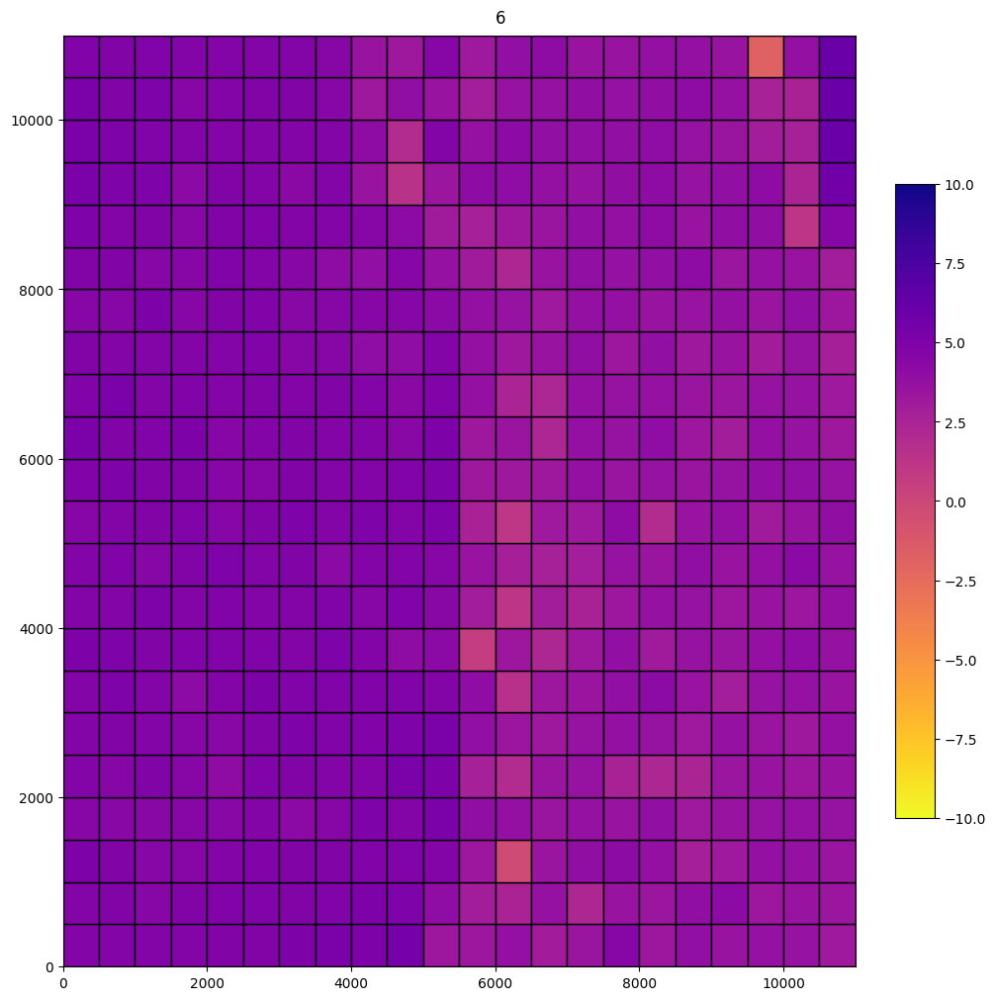

  0%|          | 0/484 [00:00<?, ?it/s]

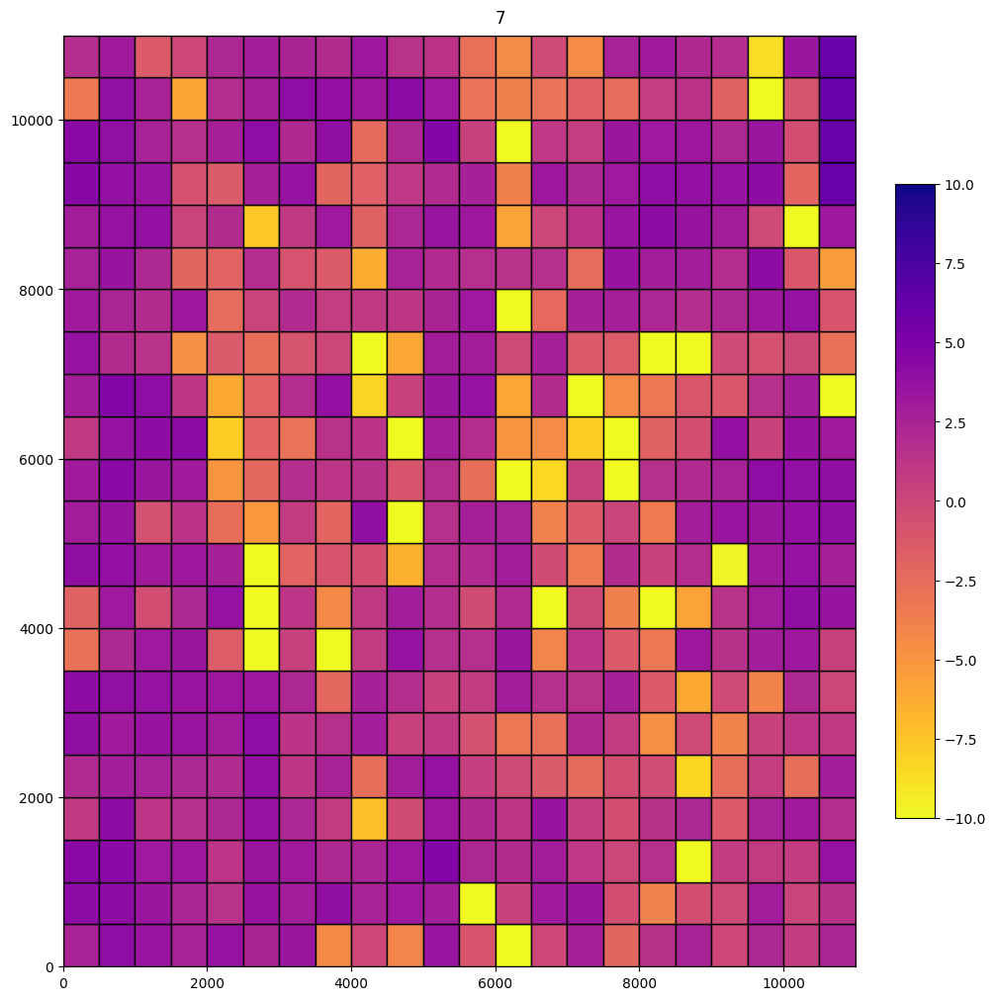

  0%|          | 0/484 [00:00<?, ?it/s]

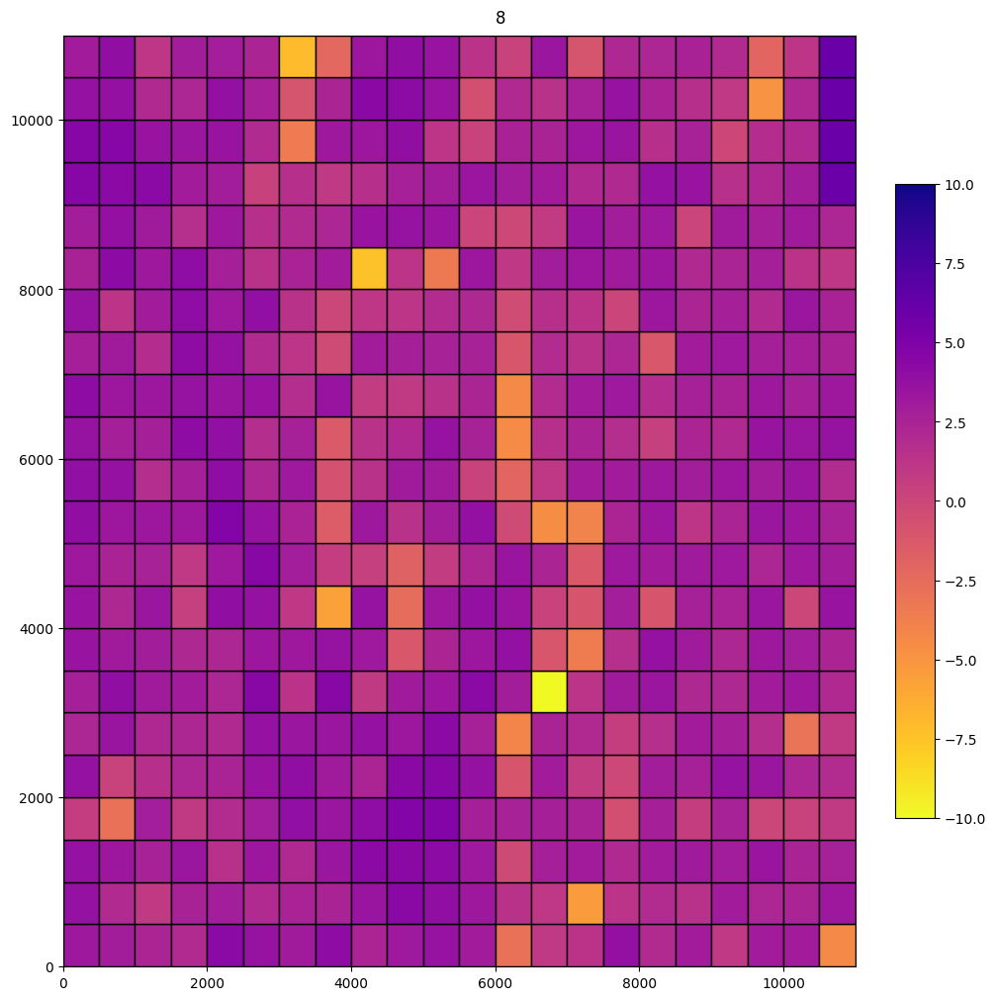

  0%|          | 0/484 [00:00<?, ?it/s]

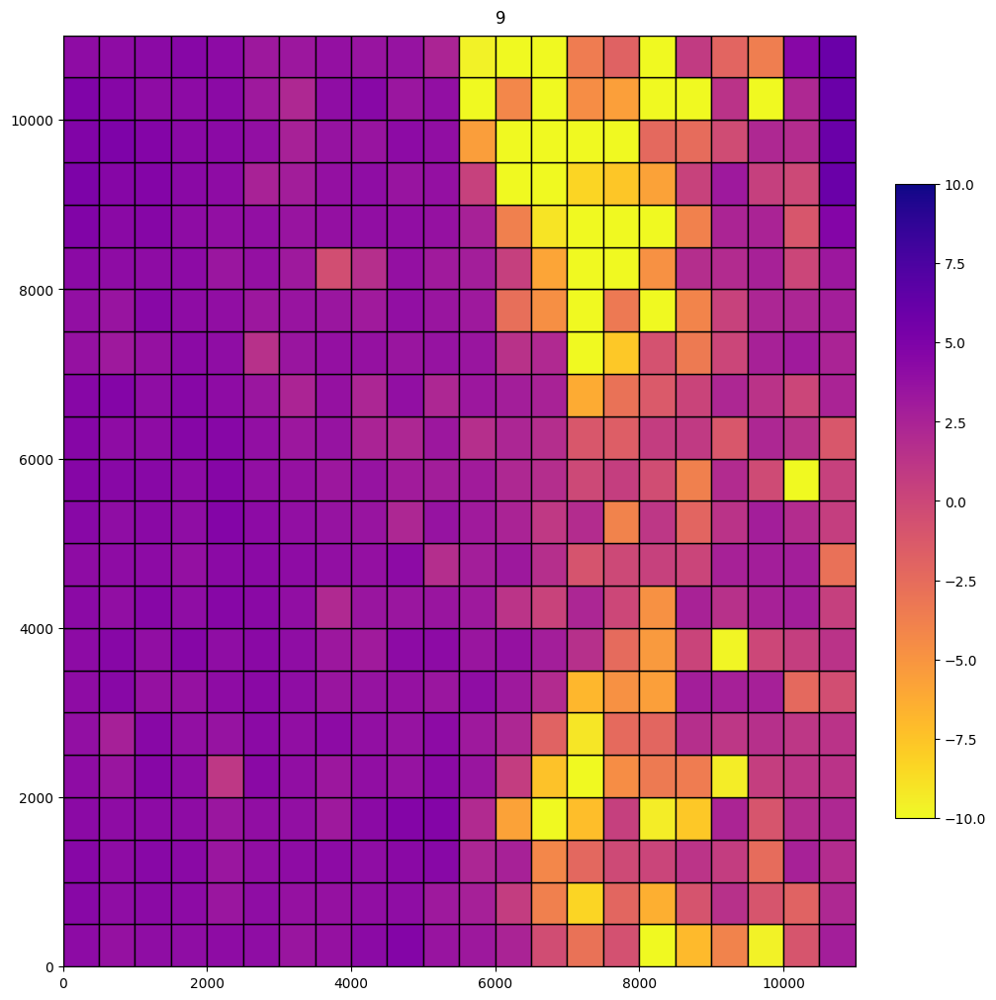

  0%|          | 0/484 [00:00<?, ?it/s]

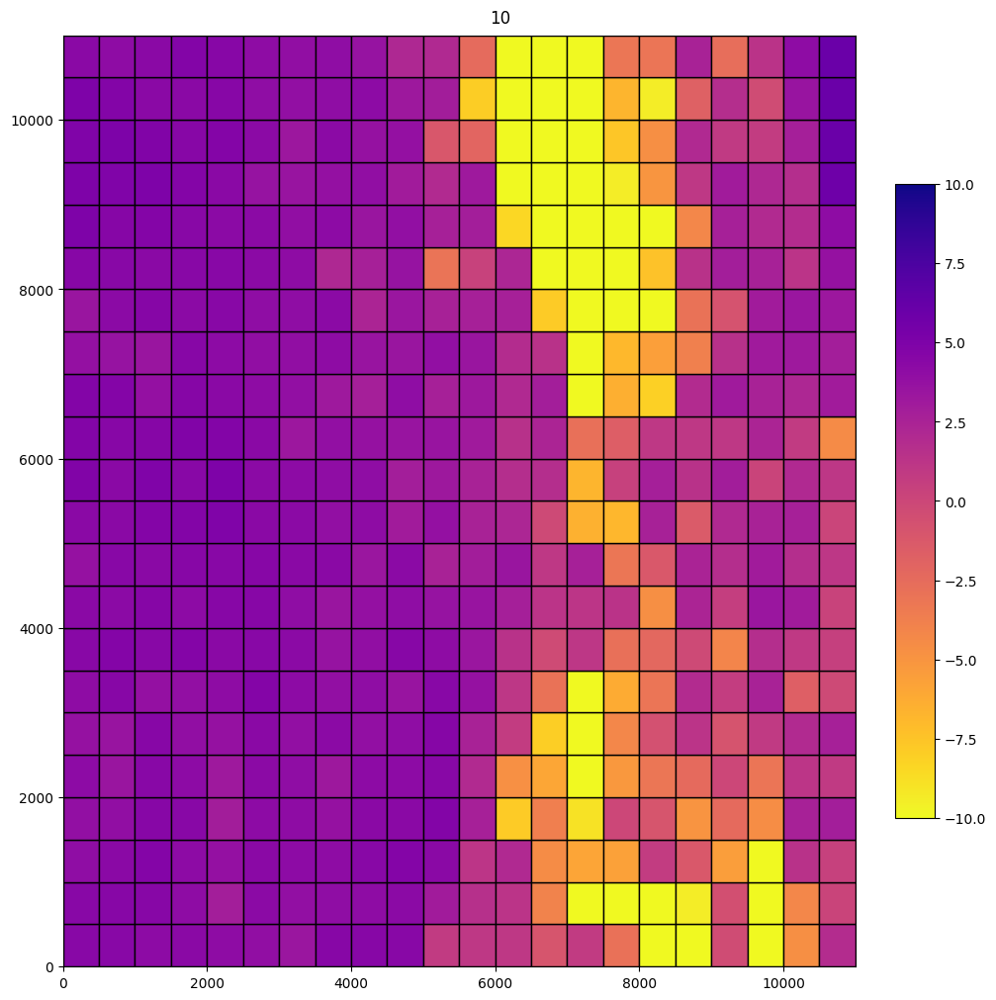

  0%|          | 0/484 [00:00<?, ?it/s]

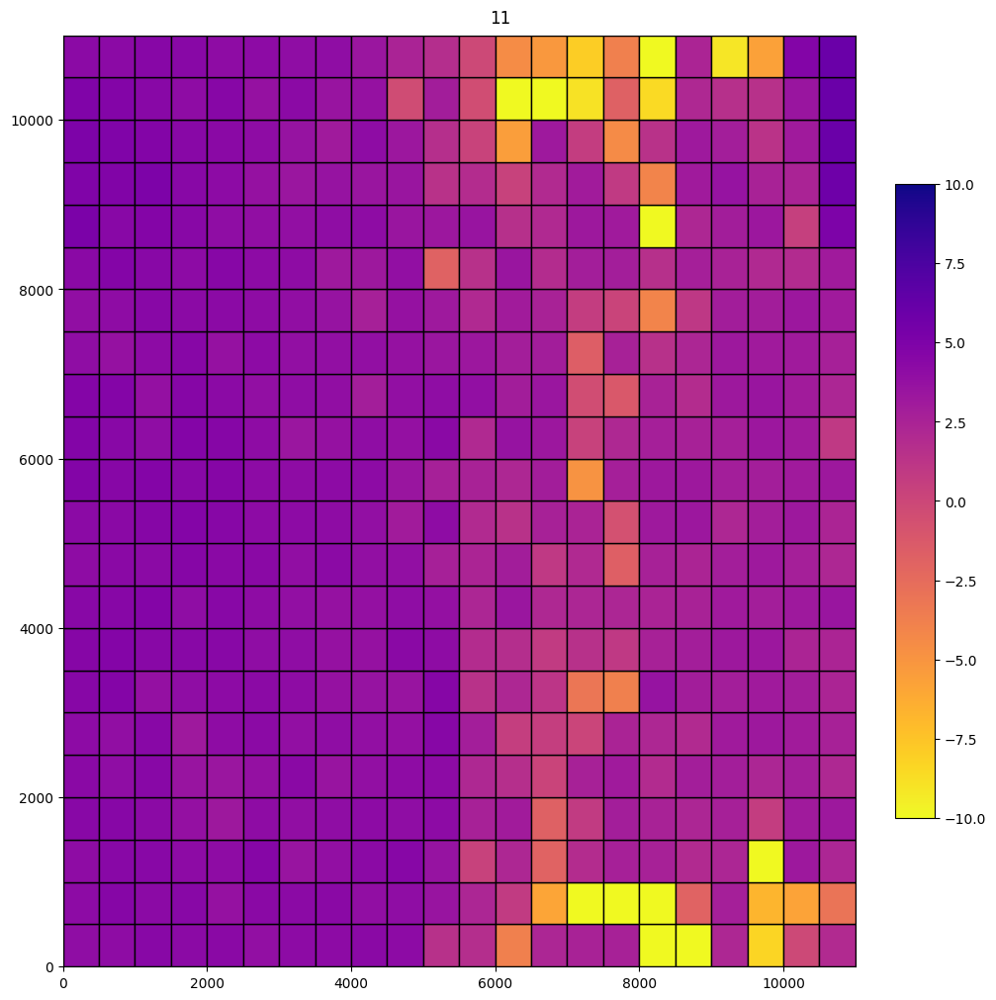

  0%|          | 0/484 [00:00<?, ?it/s]

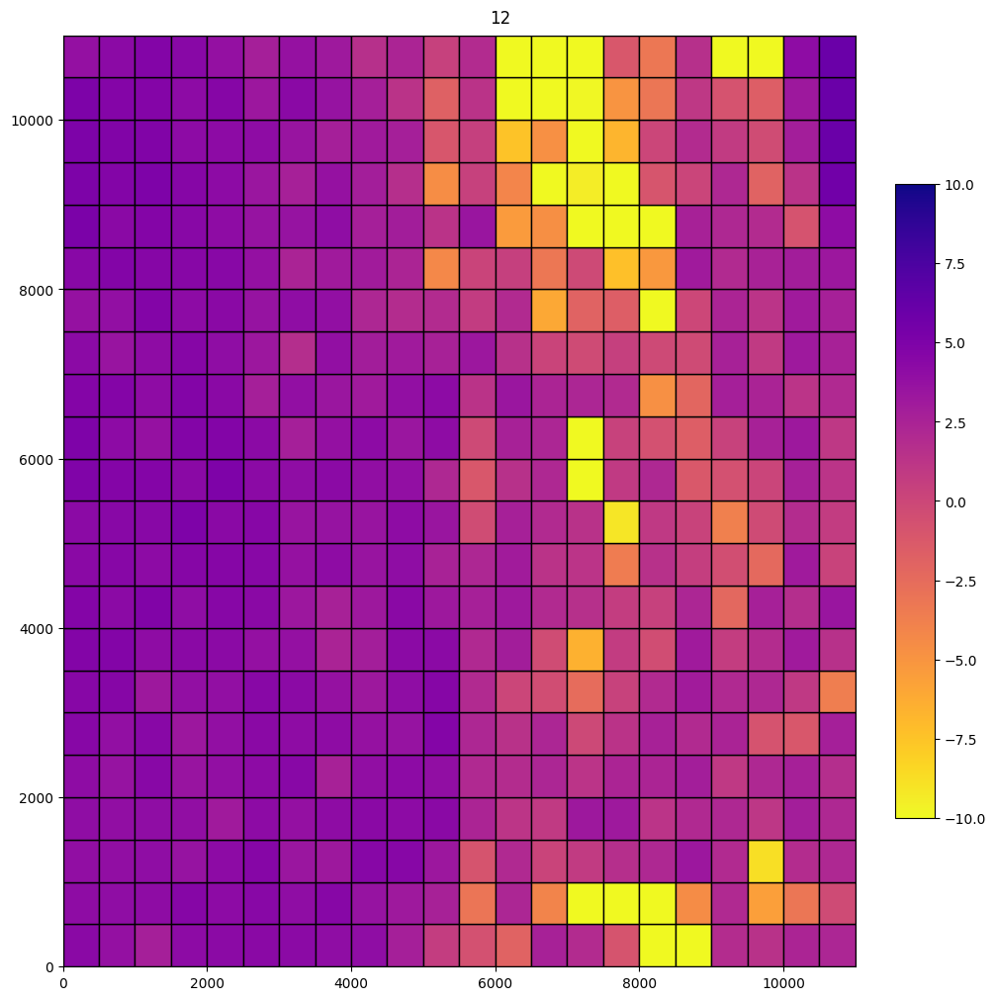

In [201]:
plt.close('all')
for m0 in trange(1, 13):
    ms = range(m0, m0 + 1)
    box_to_score = {}

    if m0 not in m_to_box_to_score:
        for w in tqdm(windows):
            window_embeddings = np.array([next(iter(d.values())) for d in box_to_embeddings[w]])
            month_embeddings_train = {}
            month_embeddings_pred = {}
            for month in ms:
                month_embeddings_train[month] = []
                month_embeddings_pred[month] = []
                for t, e in zip(timestamps, window_embeddings):
                    Y, M, _ = t.split('-')
                    Y = int(Y)
                    M = int(M)
                    if M == month:
                        if 2017 <= Y < 2022:
                            month_embeddings_train[month].append(e)
                        elif Y == 2022:
                            month_embeddings_pred[month].append(e)
                        else:
                            continue
                month_embeddings_train[month] = np.stack(month_embeddings_train[month])
                month_embeddings_pred[month] = np.stack(month_embeddings_pred[month])
                mu = month_embeddings_train[month].mean(axis=0)
                sigma = month_embeddings_train[month].std(axis=0)
                month_embeddings_train[m] = np.nan_to_num((month_embeddings_train[month] - mu) / sigma)
                month_embeddings_pred[m] = np.nan_to_num((month_embeddings_pred[month] - mu) / sigma)

            gmm = GaussianMixture(n_components=3, covariance_type='diag')
            gmm.fit(np.concatenate([month_embeddings_train[m] for m in ms]))

            ll = gmm.score_samples(np.concatenate([month_embeddings_pred[m] for m in ms])) / 512
            box_to_score[w] = ll.max()
    
        m_to_box_to_score[m0] = box_to_score
    else:
        box_to_score = m_to_box_to_score[m0]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10), constrained_layout=True, squeeze=True)
    fig.suptitle(str(m0))
    patches = []
    for w in windows:
        p = Polygon(w.to_points())
        patches.append(p)

    scores = np.array([box_to_score[w] for w in windows])
    cmap = plt.get_cmap('plasma_r')
    norm = colors.Normalize(vmin=-10, vmax=10)
    pc = PatchCollection(patches, fc=cmap(norm(scores)), ec='k', cmap=cmap, norm=norm)
    ax.add_collection(pc)
    # ax.autoscale()
    cbar = fig.colorbar(pc, ax=ax, fraction=0.05, pad=0.05, orientation='vertical', aspect=16)
    ax.set_xlim((0, 11_000))
    ax.set_ylim((0, 11_000))

    plt.show()
    # break

## 2023

In [164]:
m_to_box_to_score = {}

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/484 [00:00<?, ?it/s]

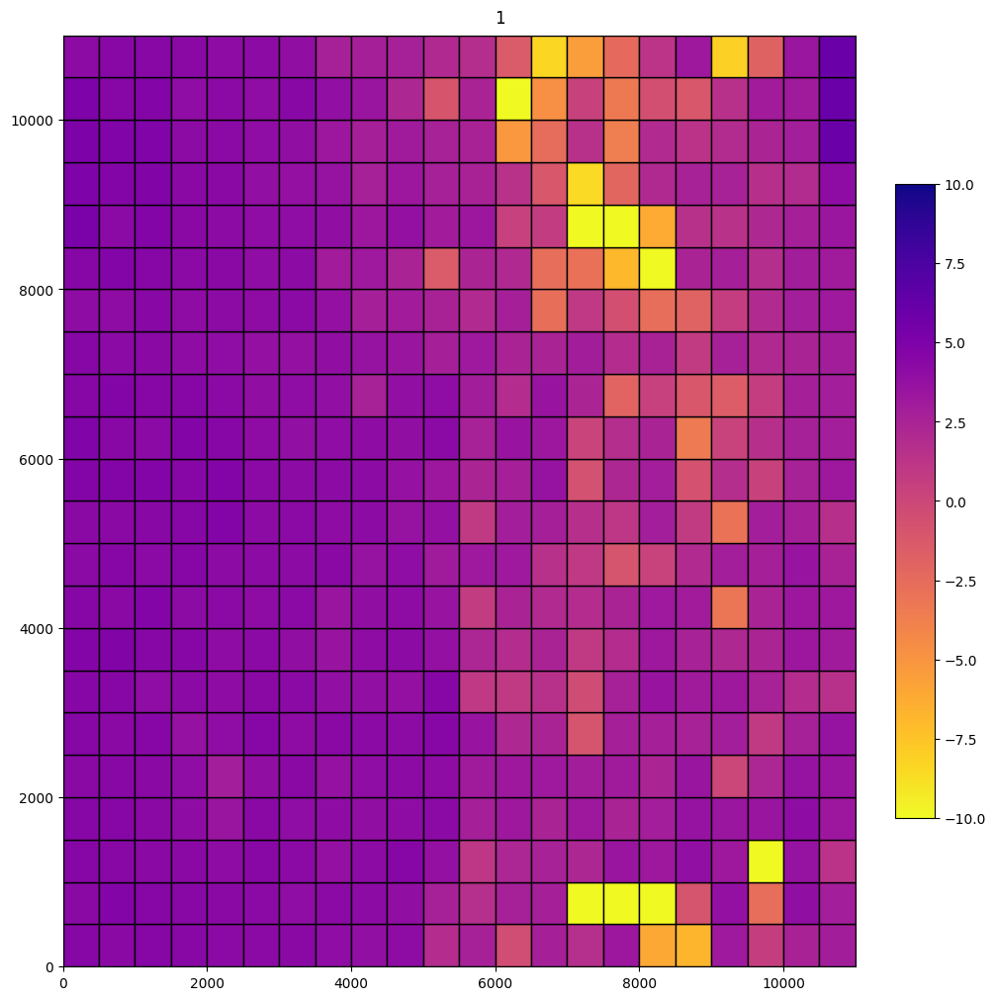

  0%|          | 0/484 [00:00<?, ?it/s]

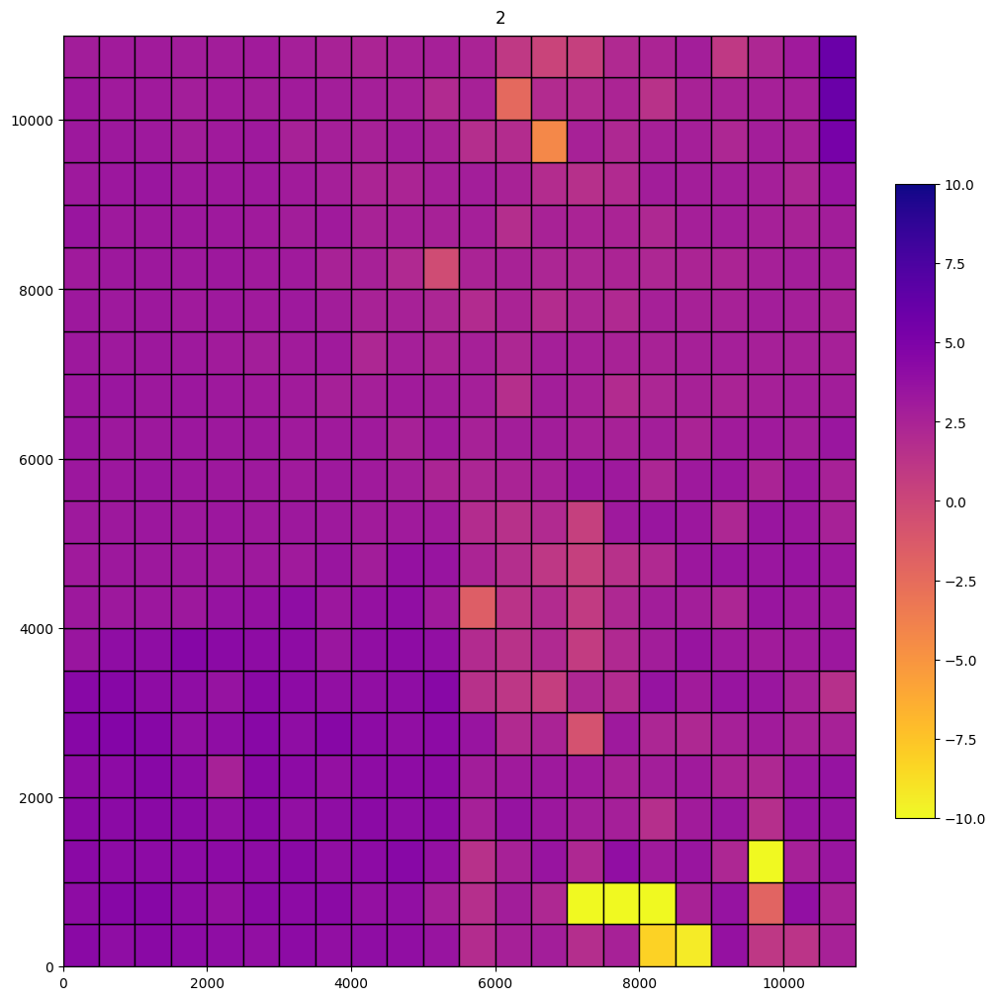

  0%|          | 0/484 [00:00<?, ?it/s]

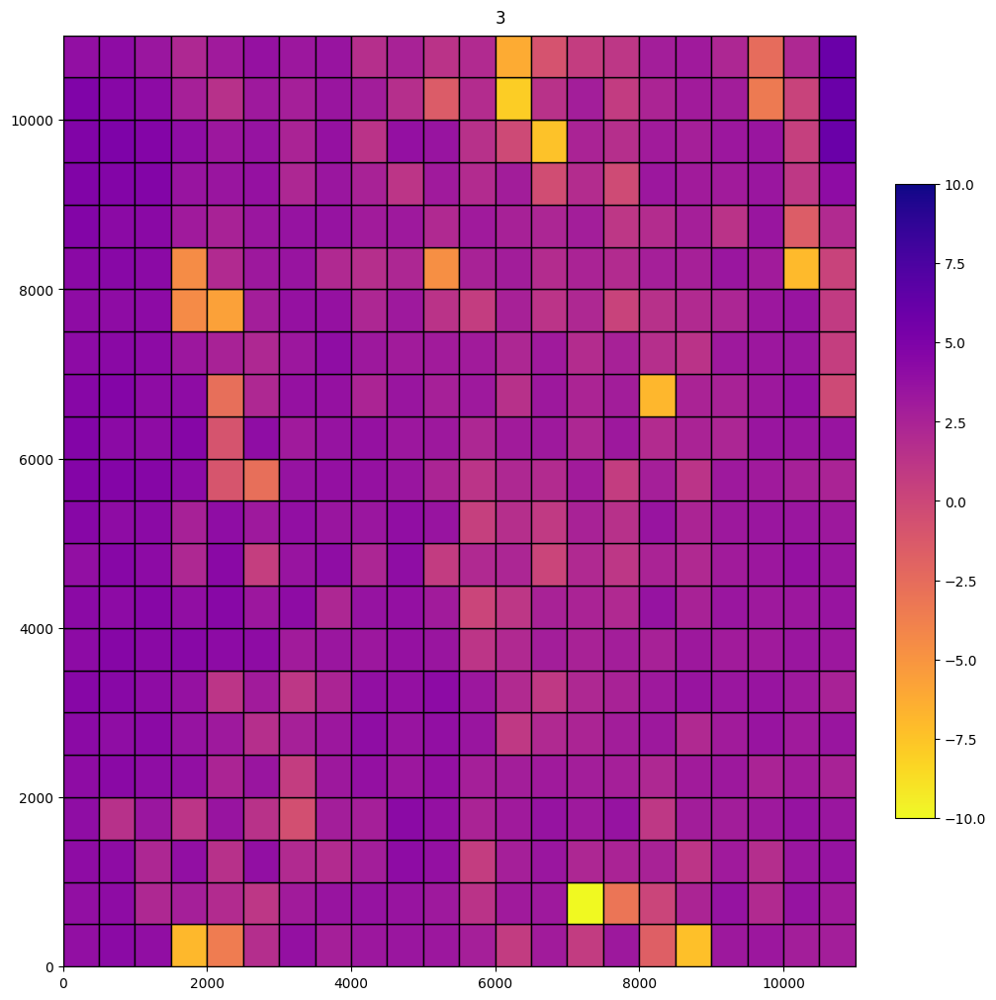

  0%|          | 0/484 [00:00<?, ?it/s]

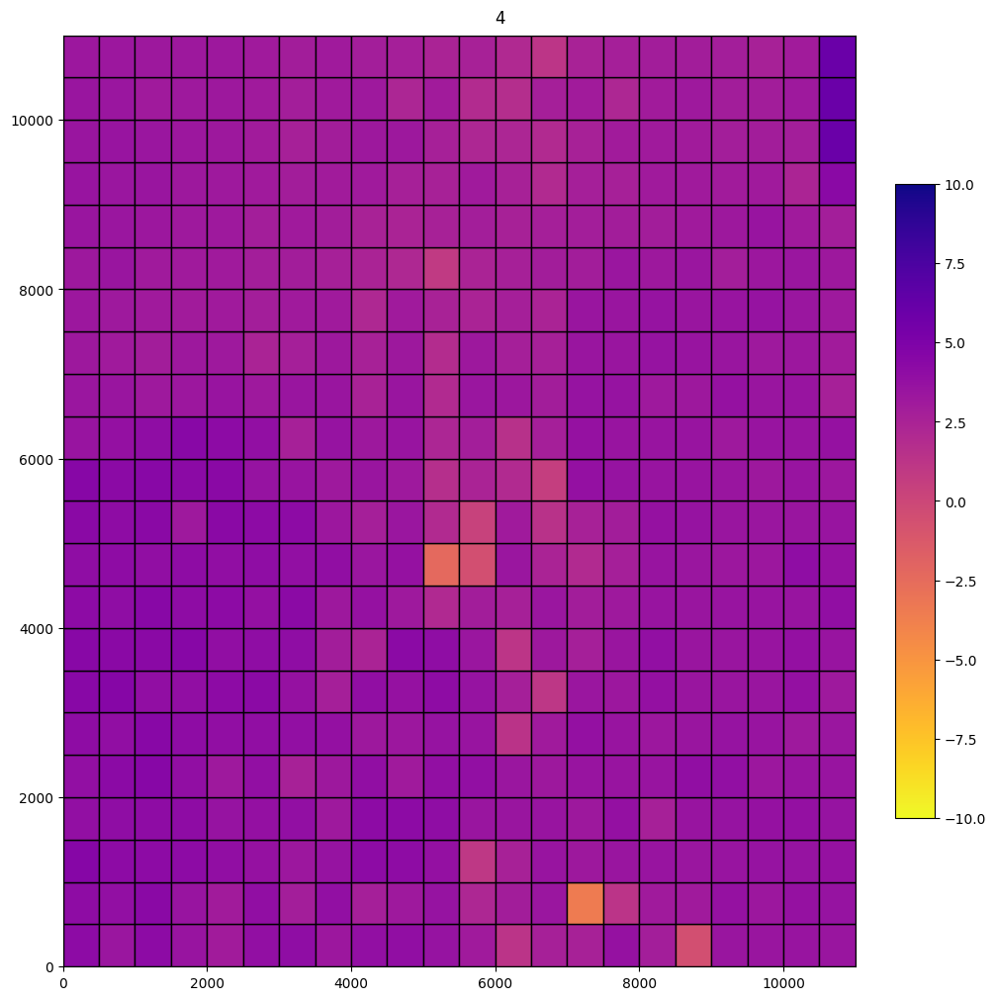

  0%|          | 0/484 [00:00<?, ?it/s]

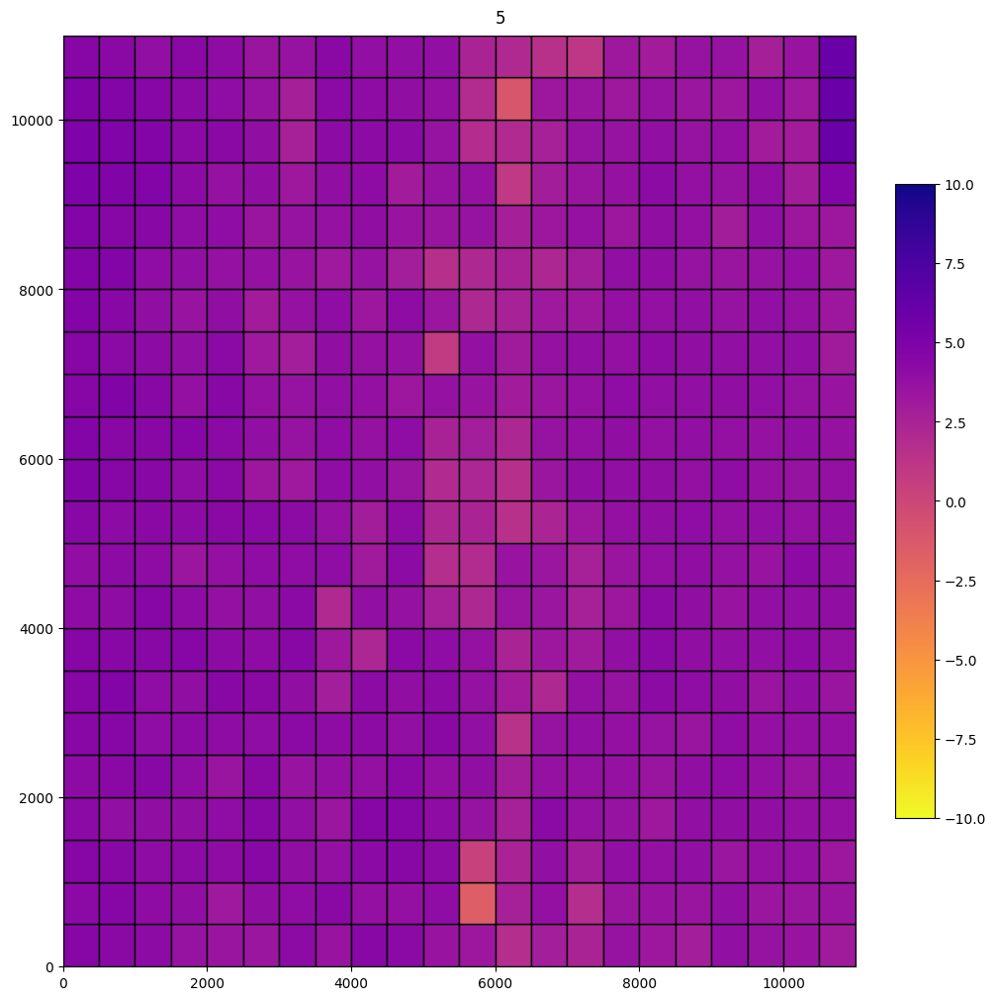

  0%|          | 0/484 [00:00<?, ?it/s]

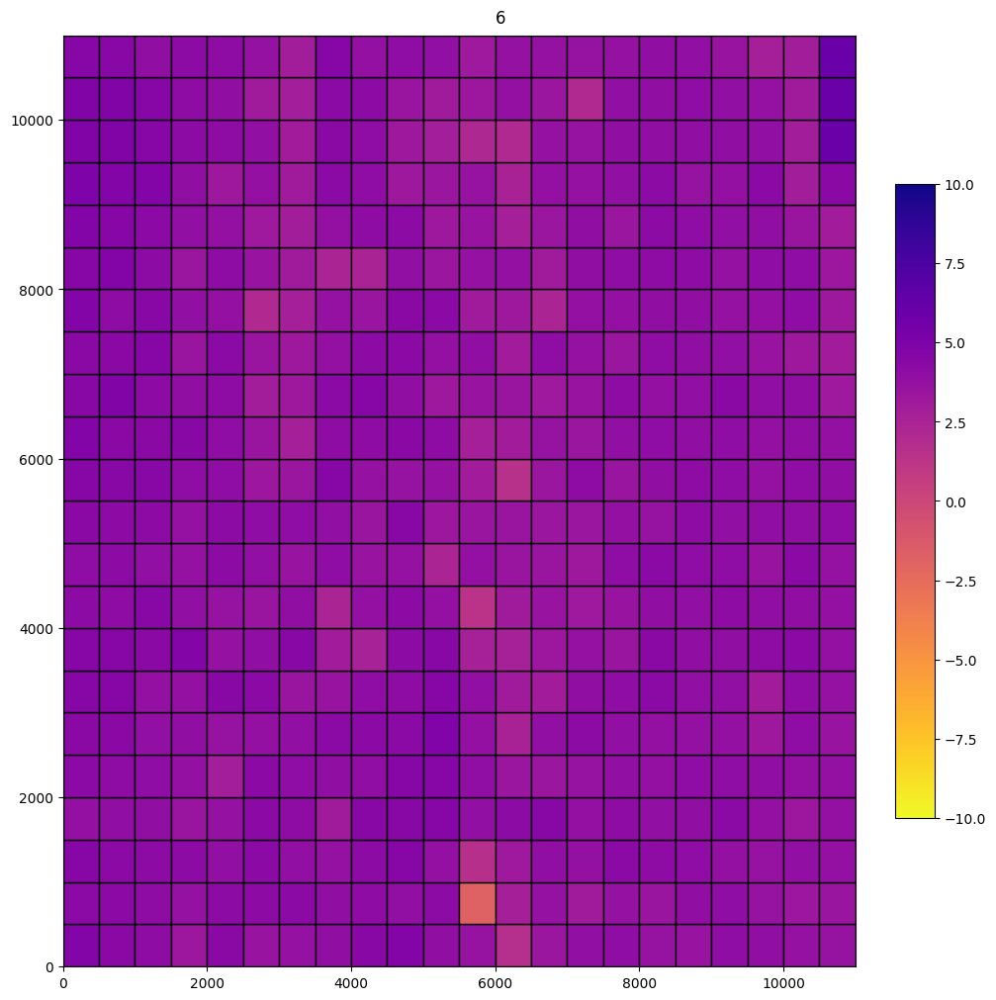

  0%|          | 0/484 [00:00<?, ?it/s]

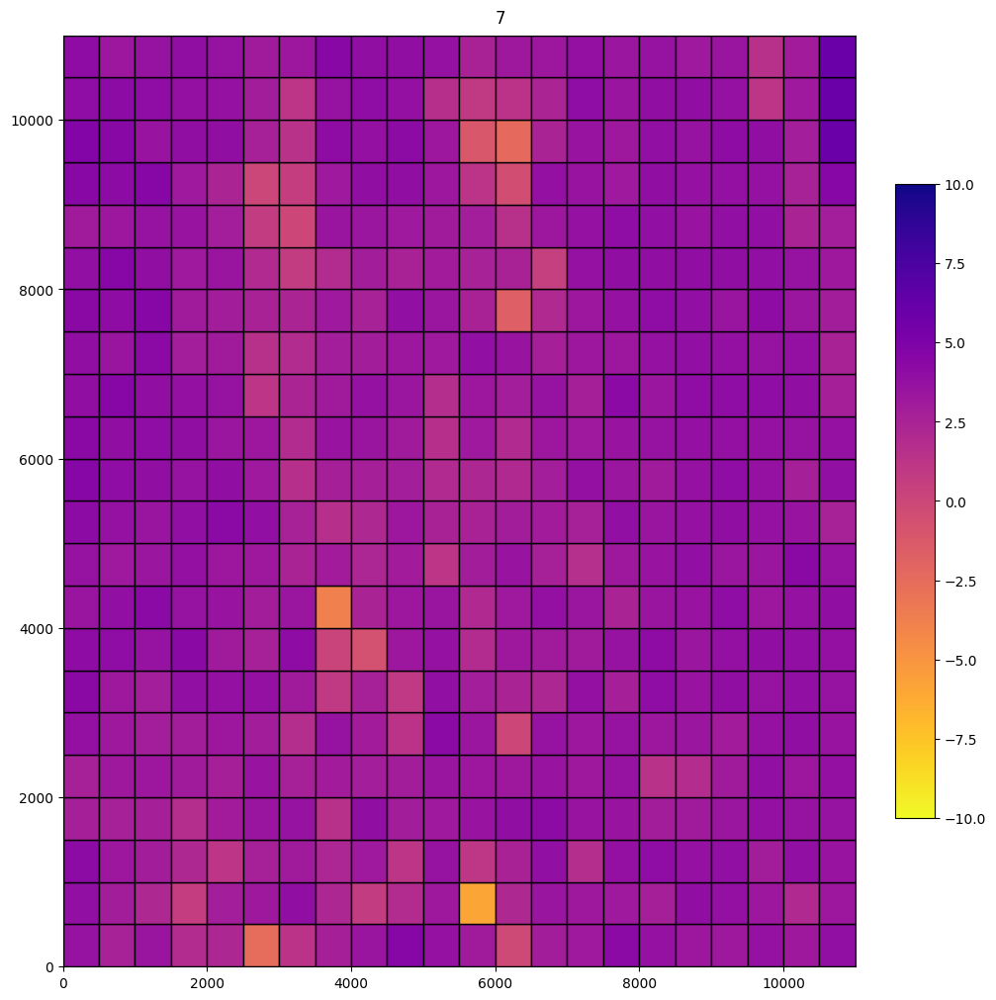

  0%|          | 0/484 [00:00<?, ?it/s]

ValueError: need at least one array to stack

In [165]:
plt.close('all')
for m0 in trange(1, 13):
    ms = range(m0, m0 + 1)
    box_to_score = {}

    if m0 not in m_to_box_to_score:
        for w in tqdm(windows):
            window_embeddings = np.array([next(iter(d.values())) for d in box_to_embeddings[w]])
            month_embeddings_train = {}
            month_embeddings_pred = {}
            for month in ms:
                month_embeddings_train[month] = []
                month_embeddings_pred[month] = []
                for t, e in zip(timestamps, window_embeddings):
                    Y, M, _ = t.split('-')
                    Y = int(Y)
                    M = int(M)
                    if M == month:
                        if 2017 <= Y < 2022:
                            month_embeddings_train[month].append(e)
                        elif Y == 2023:
                            month_embeddings_pred[month].append(e)
                        else:
                            continue
                month_embeddings_train[month] = np.stack(month_embeddings_train[month])
                month_embeddings_pred[month] = np.stack(month_embeddings_pred[month])
                mu = month_embeddings_train[month].mean(axis=0)
                sigma = month_embeddings_train[month].std(axis=0)
                month_embeddings_train[m] = np.nan_to_num((month_embeddings_train[month] - mu) / sigma)
                month_embeddings_pred[m] = np.nan_to_num((month_embeddings_pred[month] - mu) / sigma)

            gmm = GaussianMixture(n_components=1, covariance_type='diag')
            gmm.fit(np.concatenate([month_embeddings_train[m] for m in ms]))

            ll = gmm.score_samples(np.concatenate([month_embeddings_pred[m] for m in ms])) / 512
            box_to_score[w] = ll.max()
    
        m_to_box_to_score[m0] = box_to_score
    else:
        box_to_score = m_to_box_to_score[m0]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10), constrained_layout=True, squeeze=True)
    fig.suptitle(str(m0))
    patches = []
    for w in windows:
        p = Polygon(w.to_points())
        patches.append(p)

    scores = np.array([box_to_score[w] for w in windows])
    cmap = plt.get_cmap('plasma_r')
    norm = colors.Normalize(vmin=-10, vmax=10)
    pc = PatchCollection(patches, fc=cmap(norm(scores)), ec='k', cmap=cmap, norm=norm)
    ax.add_collection(pc)
    # ax.autoscale()
    cbar = fig.colorbar(pc, ax=ax, fraction=0.05, pad=0.05, orientation='vertical', aspect=16)
    ax.set_xlim((0, 11_000))
    ax.set_ylim((0, 11_000))

    plt.show()
    # break

In [406]:
m_to_box_to_score_2022 = m_to_box_to_score

  0%|          | 0/12 [00:00<?, ?it/s]

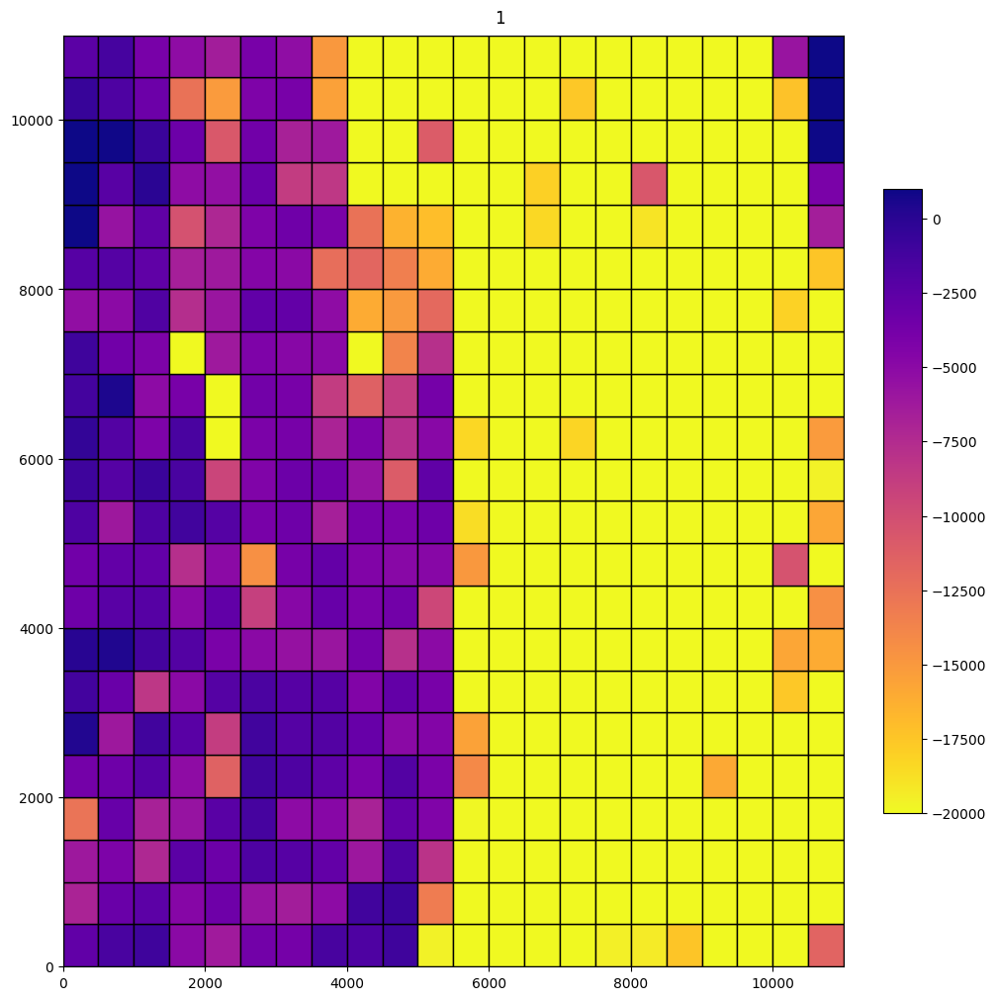

  0%|          | 0/484 [00:00<?, ?it/s]

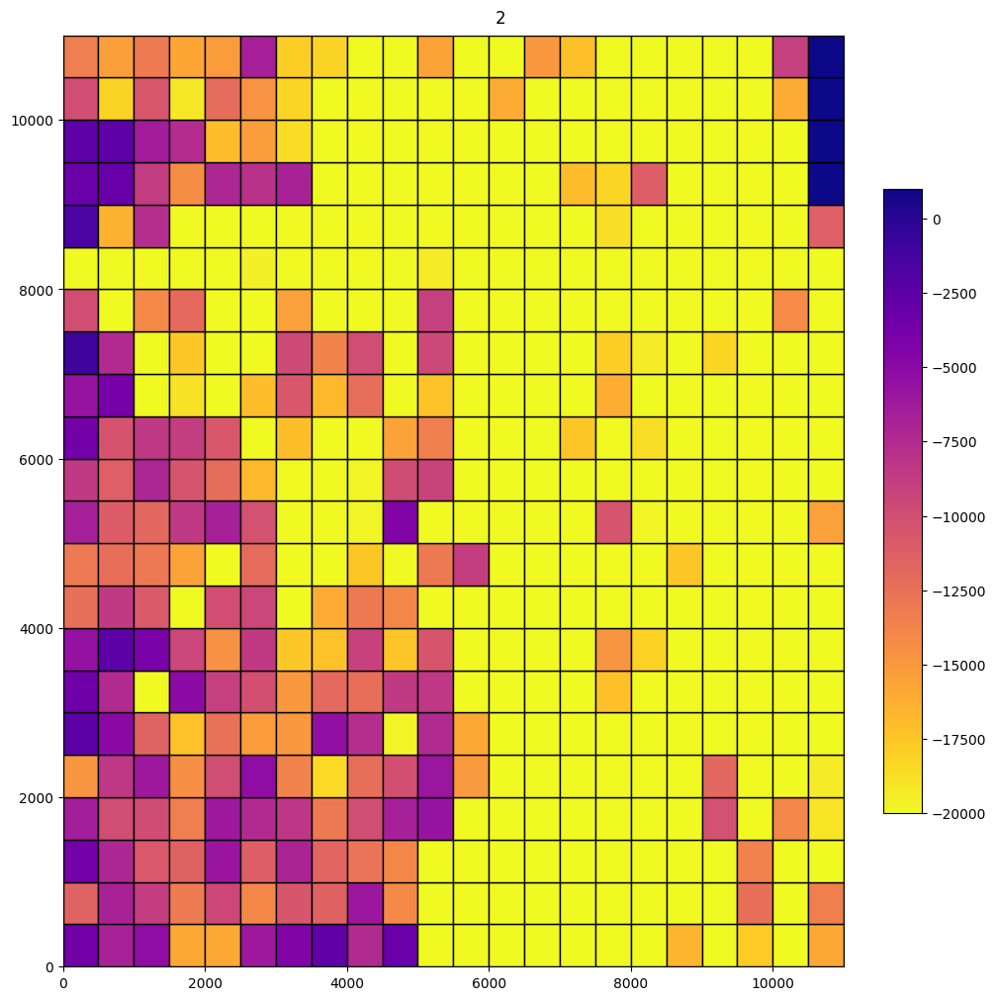

  0%|          | 0/484 [00:00<?, ?it/s]

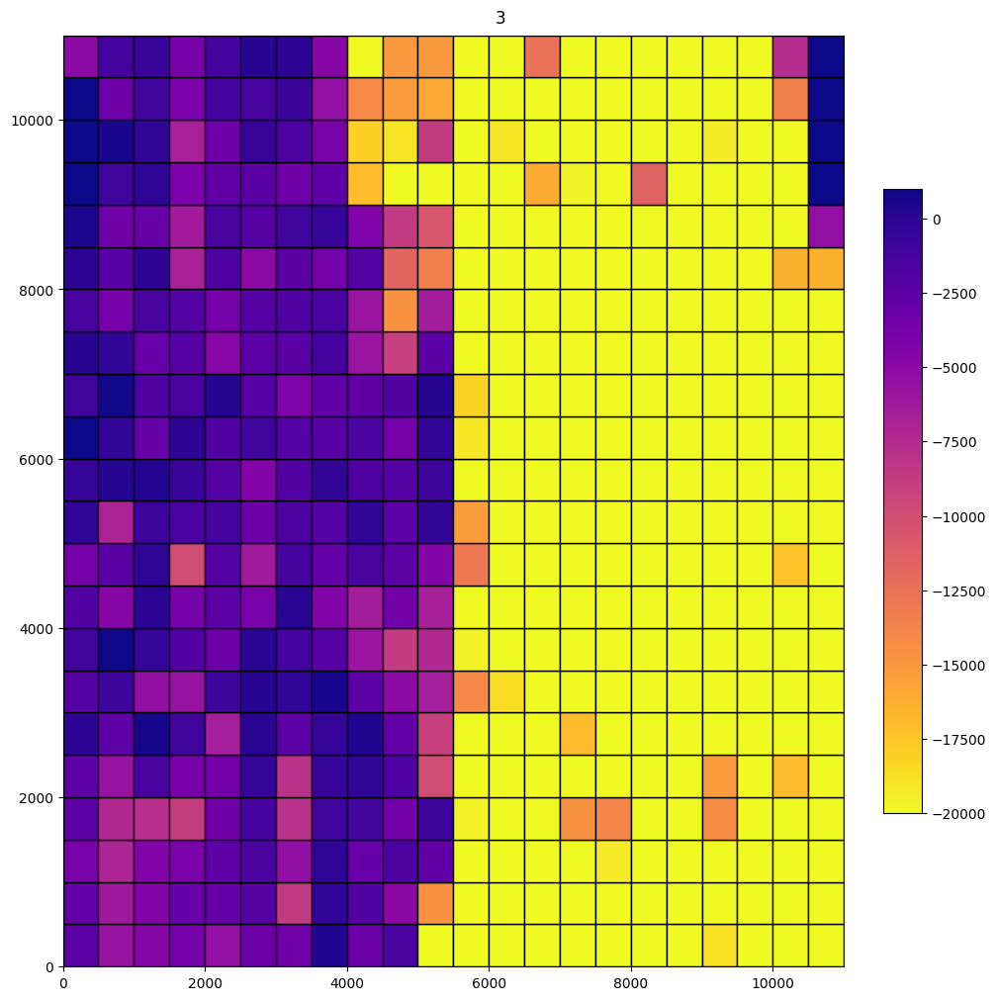

  0%|          | 0/484 [00:00<?, ?it/s]

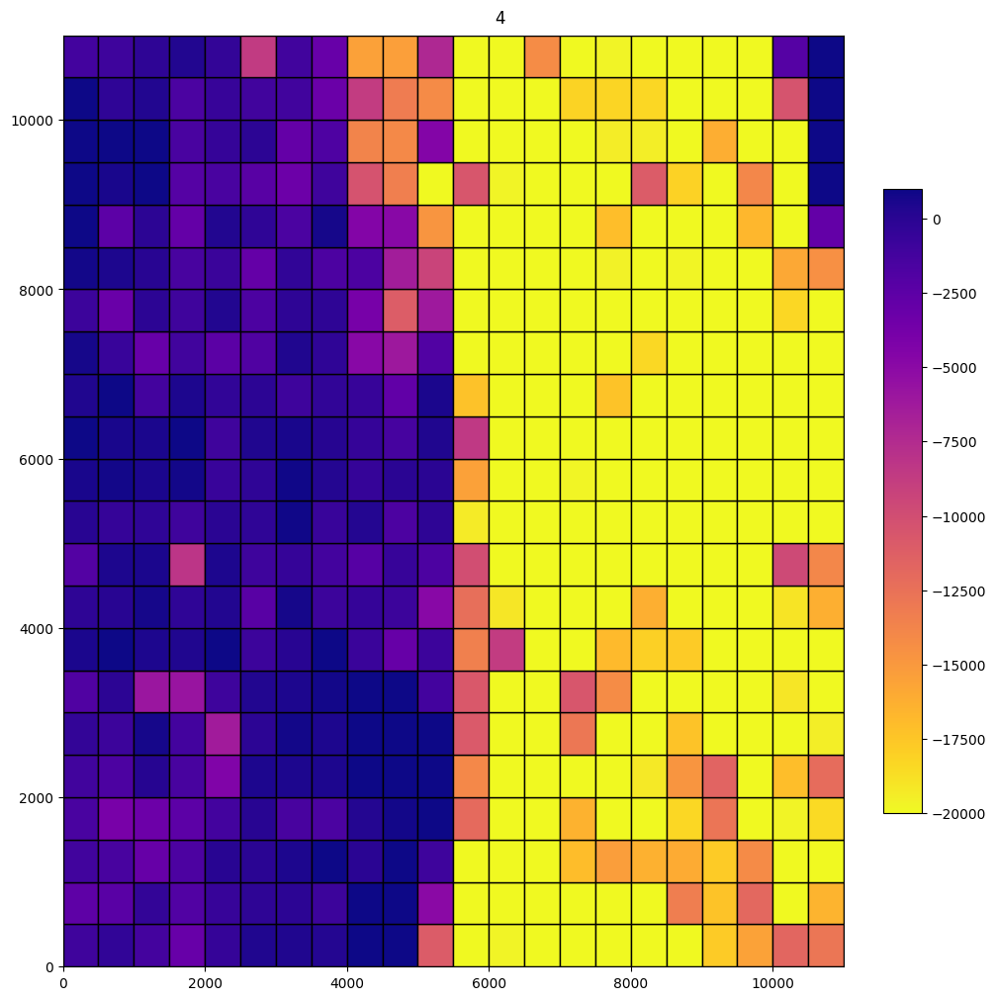

  0%|          | 0/484 [00:00<?, ?it/s]

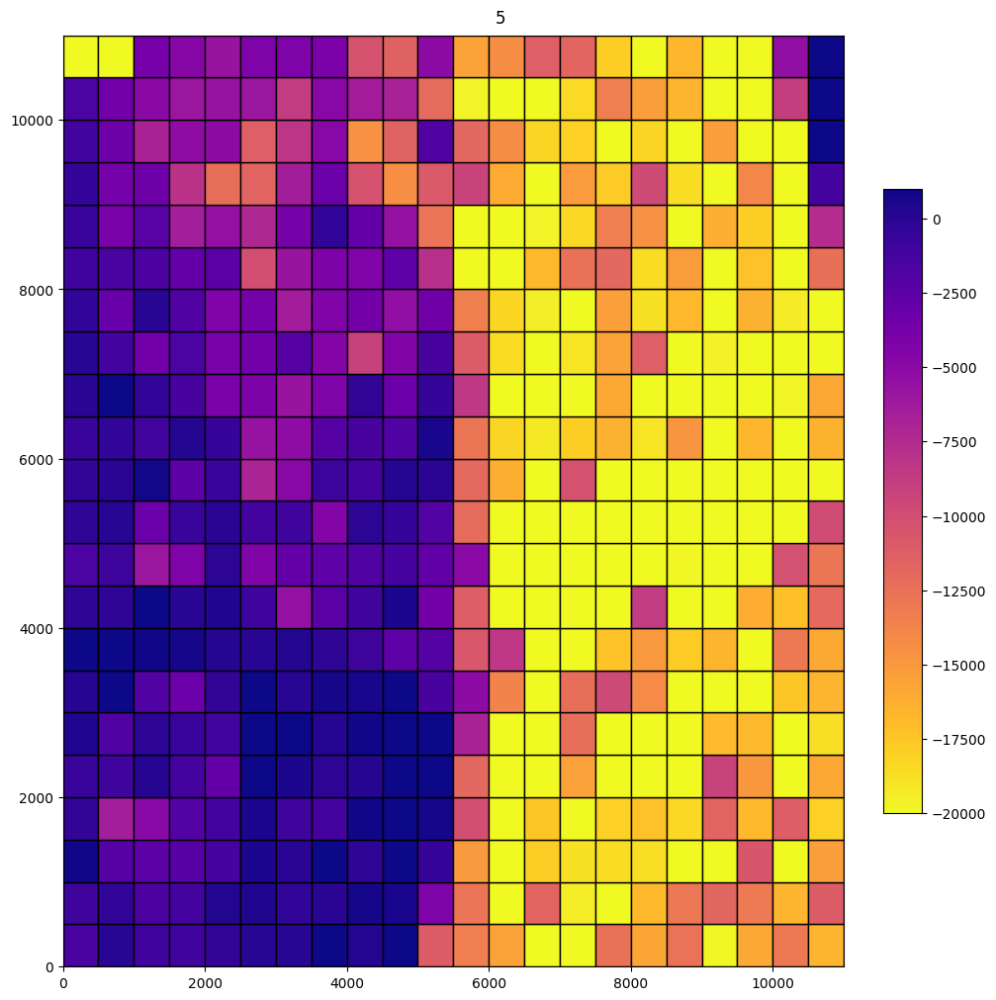

  0%|          | 0/484 [00:00<?, ?it/s]

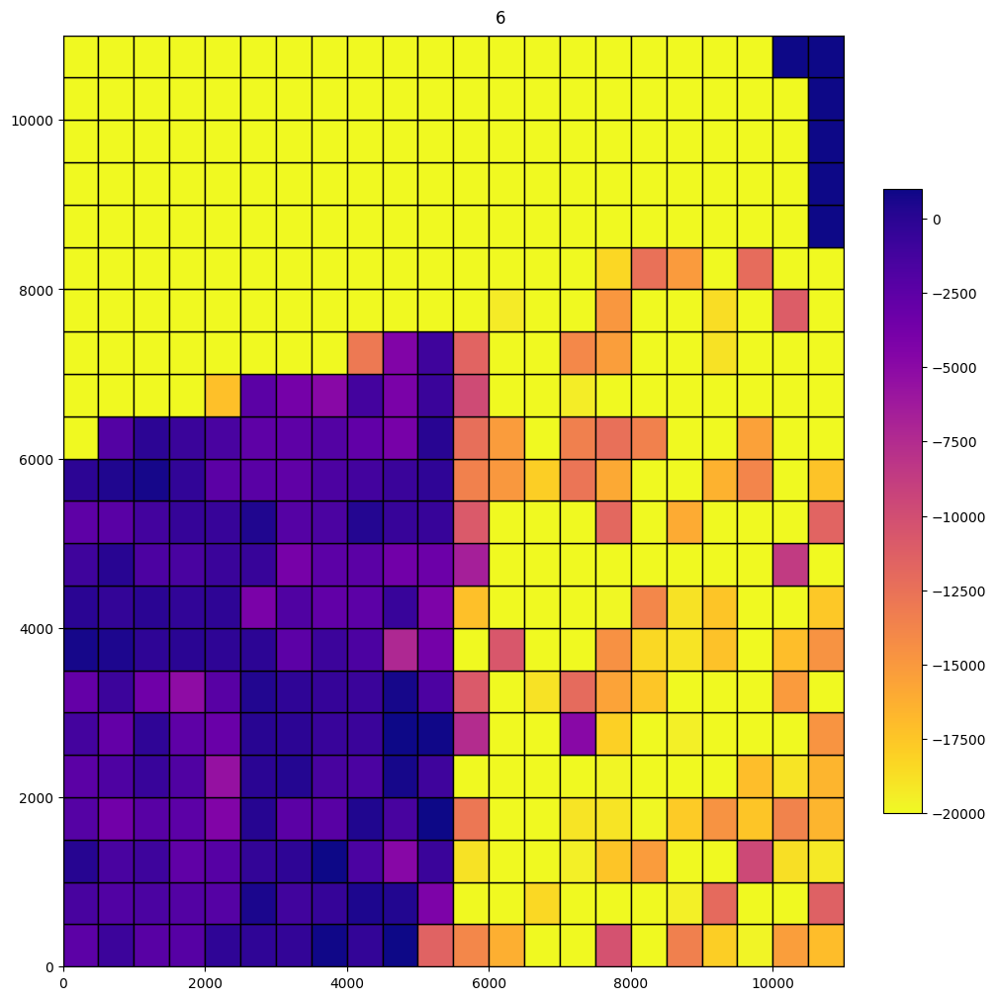

  0%|          | 0/484 [00:00<?, ?it/s]

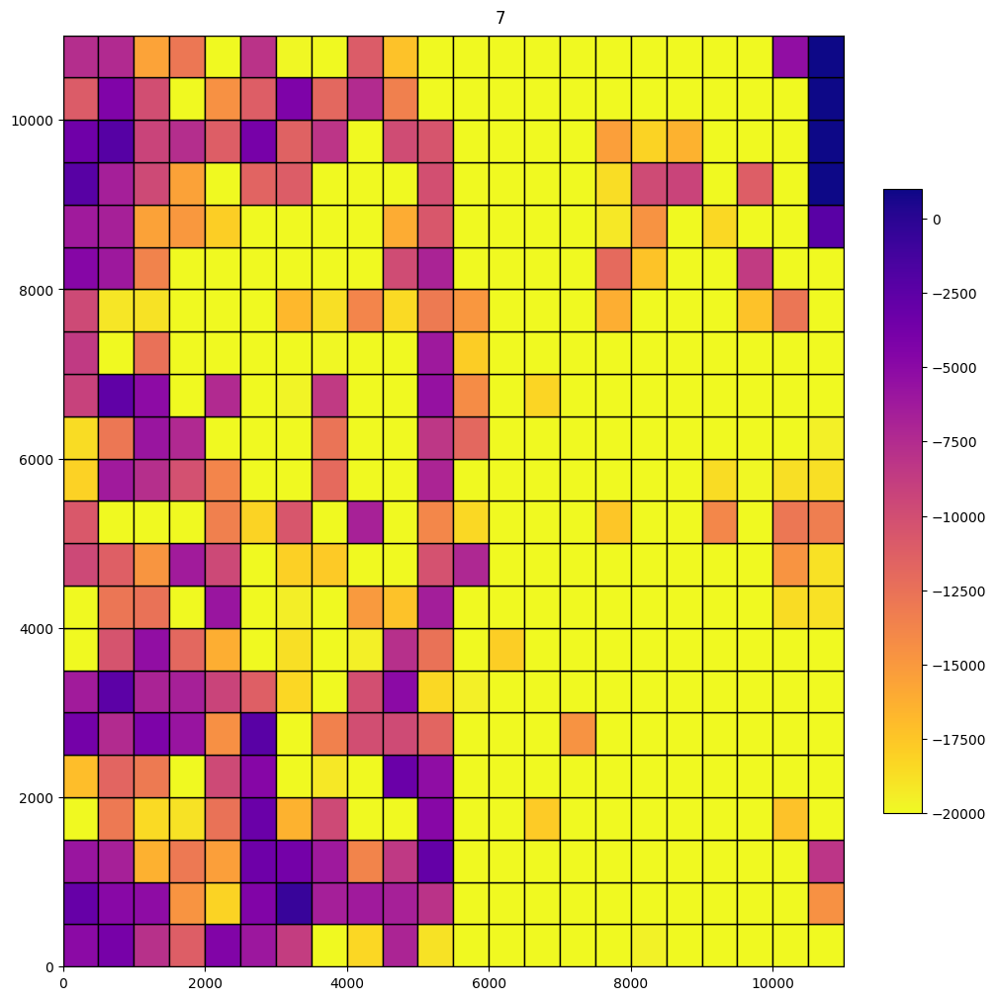

  0%|          | 0/484 [00:00<?, ?it/s]

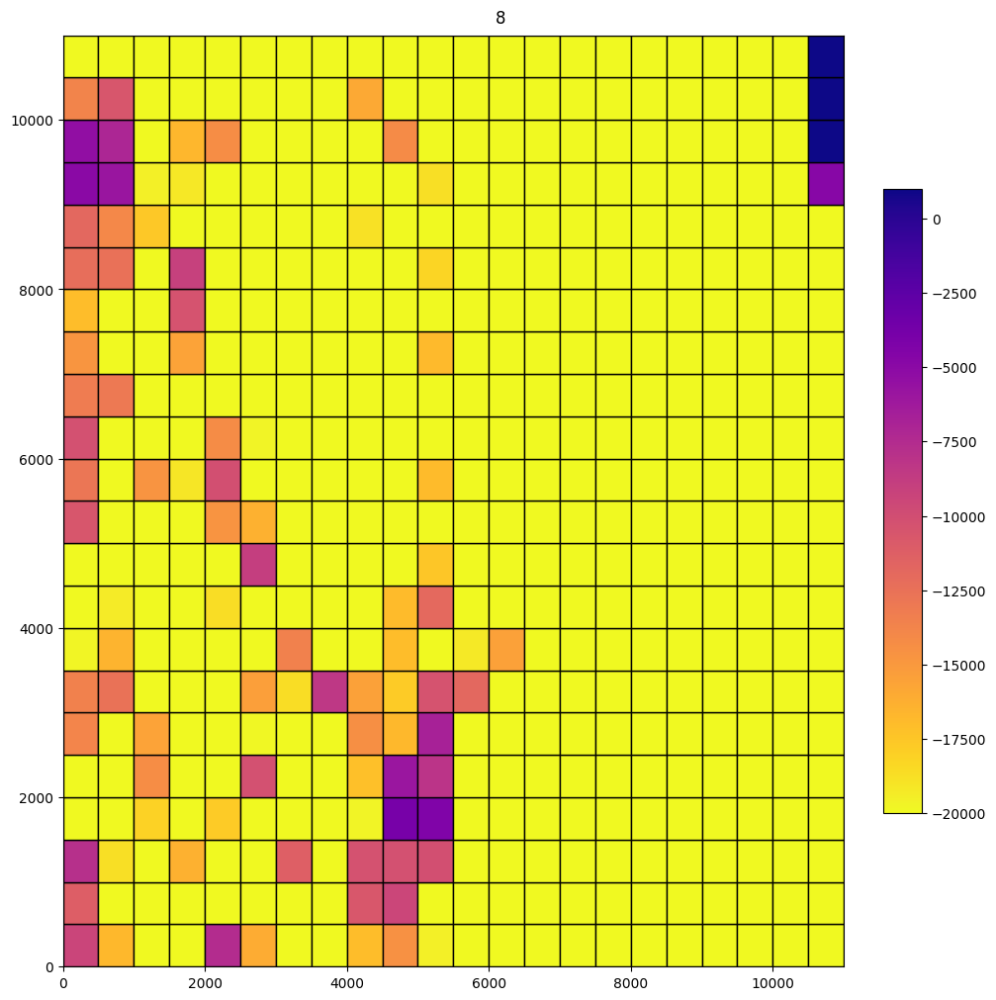

  0%|          | 0/484 [00:00<?, ?it/s]

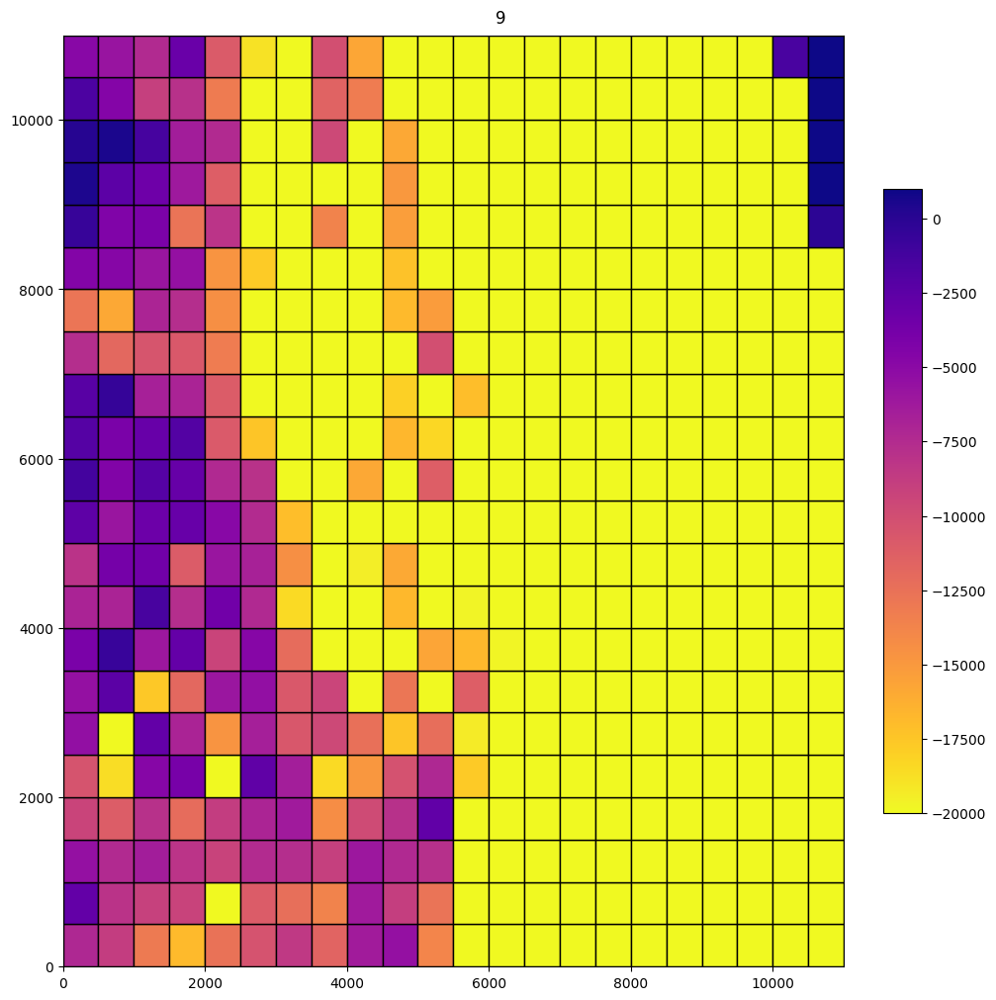

  0%|          | 0/484 [00:00<?, ?it/s]

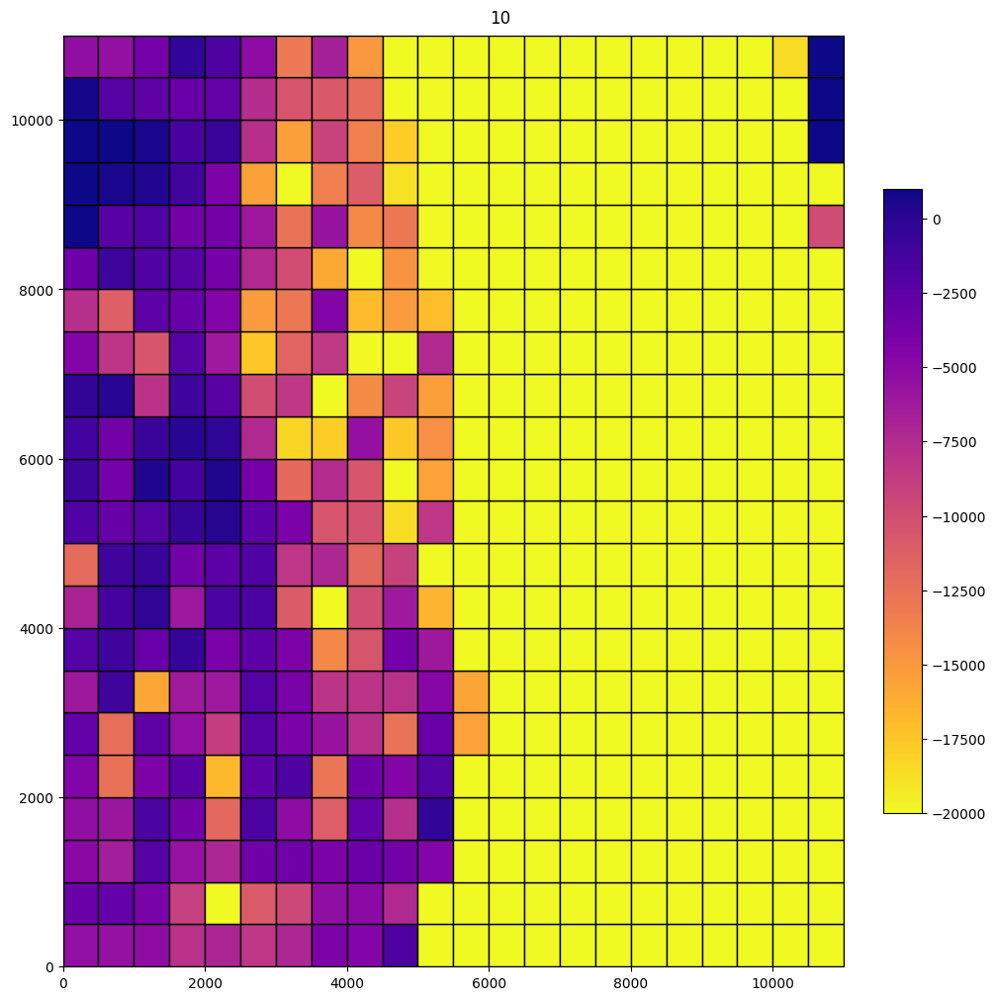

  0%|          | 0/484 [00:00<?, ?it/s]

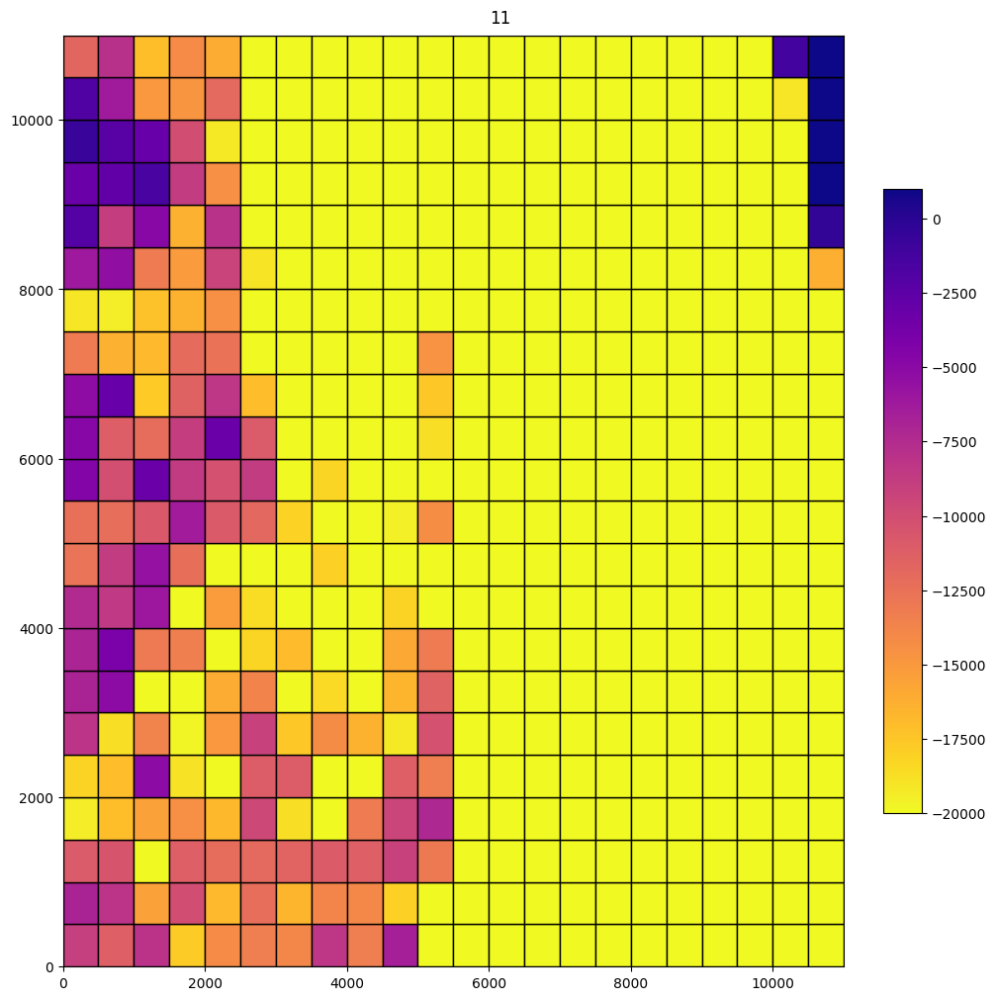

  0%|          | 0/484 [00:00<?, ?it/s]

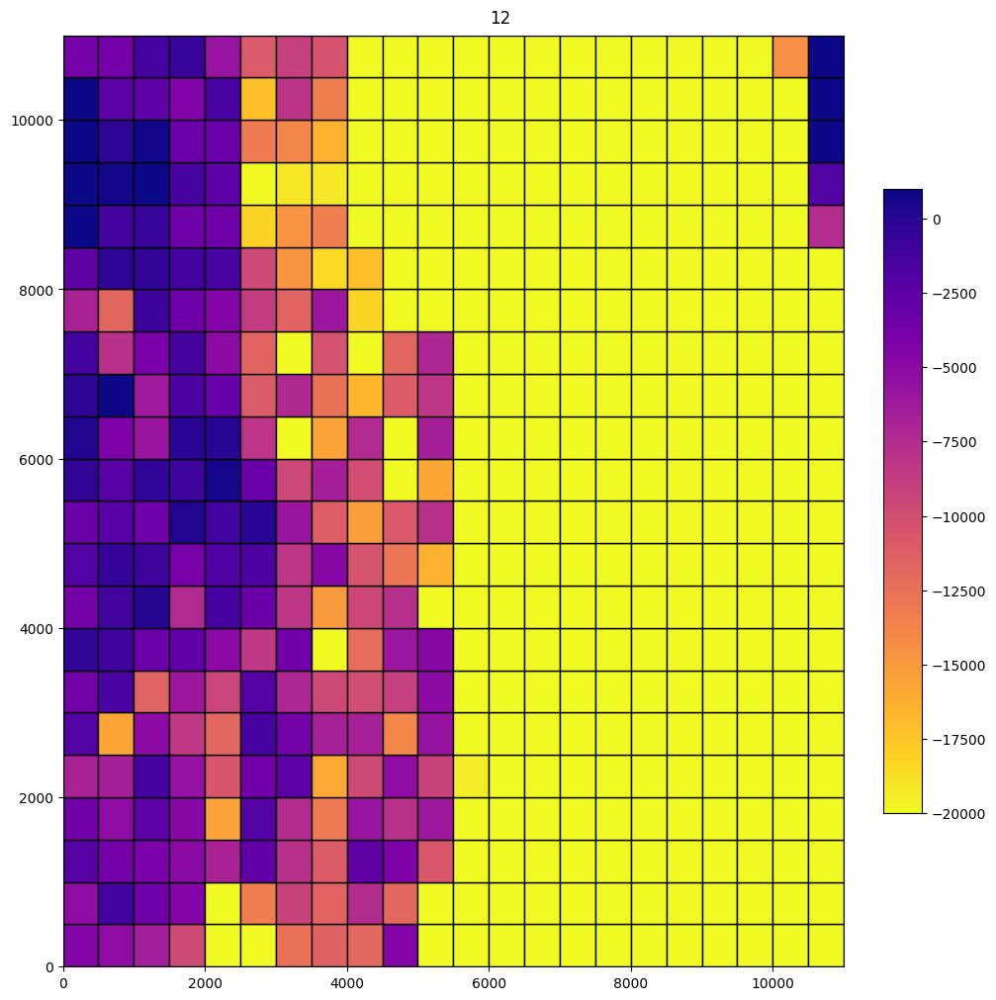

In [349]:
plt.close('all')
for m0 in trange(1, 13):
    ms = range(m0, m0 + 1)
    box_to_score = {}

    if m0 not in m_to_box_to_score:
        for w in tqdm(windows):
            window_embeddings = np.array([next(iter(d.values())) for d in box_to_embeddings[w]])
            month_embeddings_train = {}
            month_embeddings_2022 = {}
            for month in ms:
                month_embeddings_train[month] = []
                month_embeddings_2022[month] = []
                for t, e in zip(timestamps, window_embeddings):
                    Y, M, _ = t.split('-')
                    Y = int(Y)
                    M = int(M)
                    if M == month:
                        if 2017 <= Y < 2022:
                            month_embeddings_train[month].append(e)
                        elif Y == 2022:
                            month_embeddings_2022[month].append(e)
                month_embeddings_train[month] = np.stack(month_embeddings_train[month])
                month_embeddings_2022[month] = np.stack(month_embeddings_2022[month])
            
            gmm = GaussianMixture(n_components=1)
            gmm.fit(np.concatenate([month_embeddings_train[m] for m in ms]))
            
            box_to_score[w] = gmm.score(np.concatenate([month_embeddings_2022[m] for m in ms]))
    
        m_to_box_to_score[m0] = box_to_score
    else:
        box_to_score = m_to_box_to_score[m0]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10), constrained_layout=True, squeeze=True)
    fig.suptitle(str(m0))
    patches = []
    for w in windows:
        p = Polygon(w.to_points())
        patches.append(p)

    scores = np.array([box_to_score[w] for w in windows])
    cmap = plt.get_cmap('plasma_r')
    norm = colors.Normalize(vmin=-20_000, vmax=1_000)
    pc = PatchCollection(patches, fc=cmap(norm(scores)), ec='k', cmap=cmap, norm=norm)
    ax.add_collection(pc)
    # ax.autoscale()
    cbar = fig.colorbar(pc, ax=ax, fraction=0.05, pad=0.05, orientation='vertical', aspect=16)
    ax.set_xlim((0, 11_000))
    ax.set_ylim((0, 11_000))

    plt.show()
    # break

In [ ]:
scores

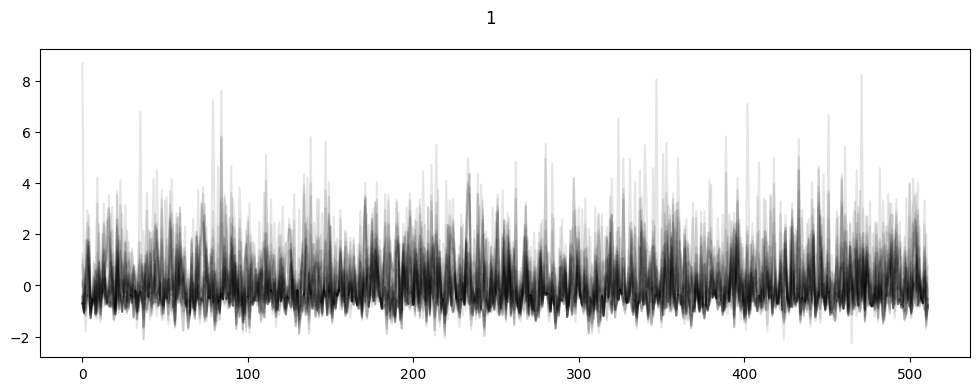

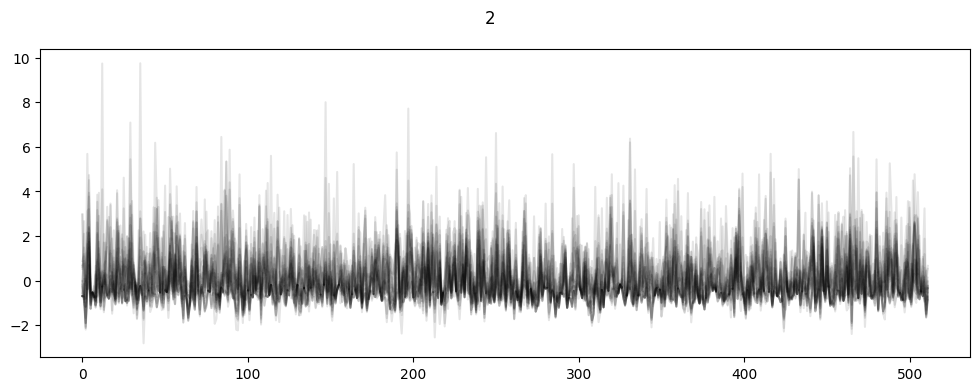

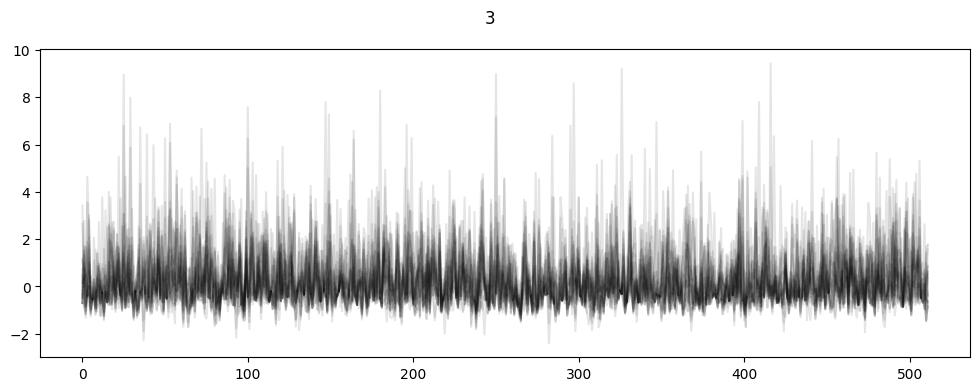

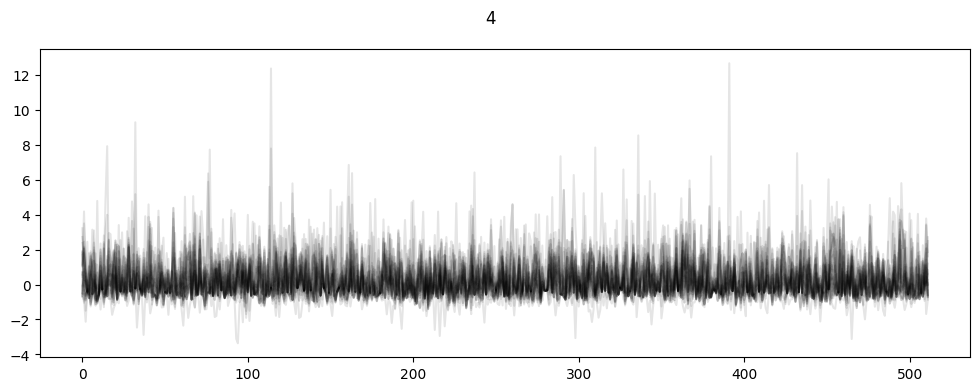

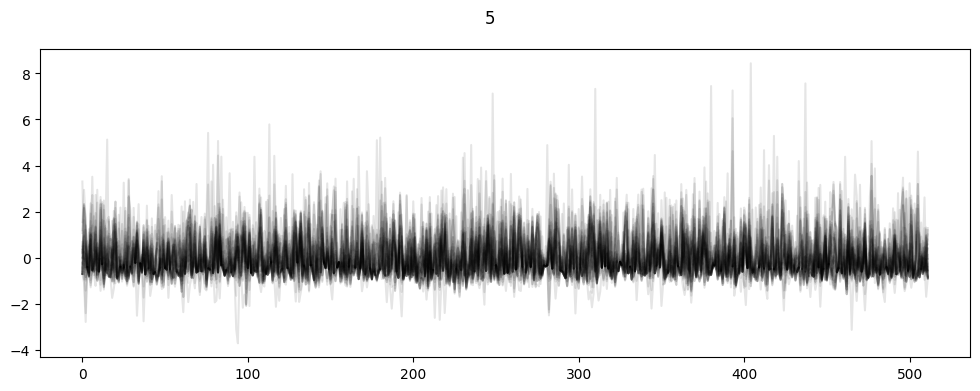

...

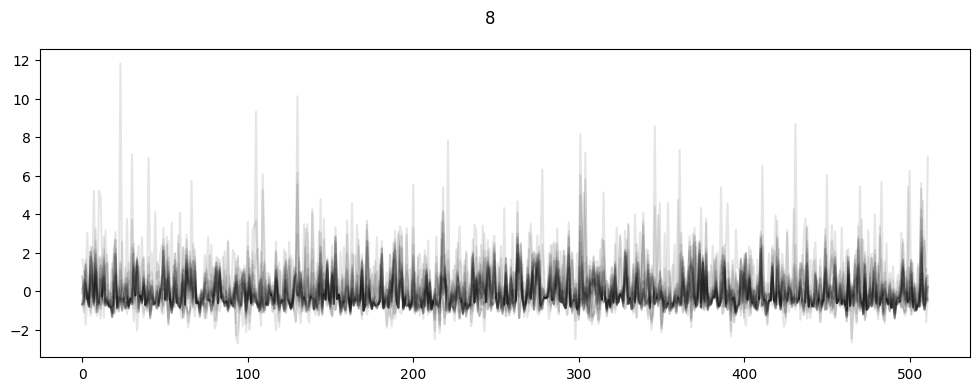

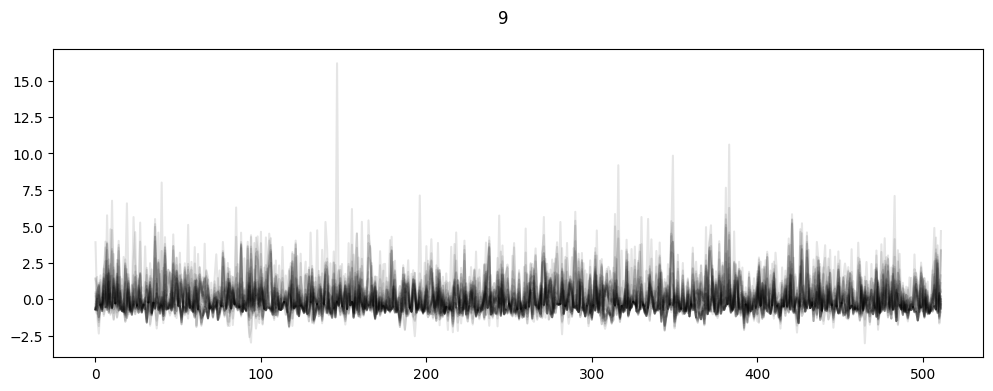

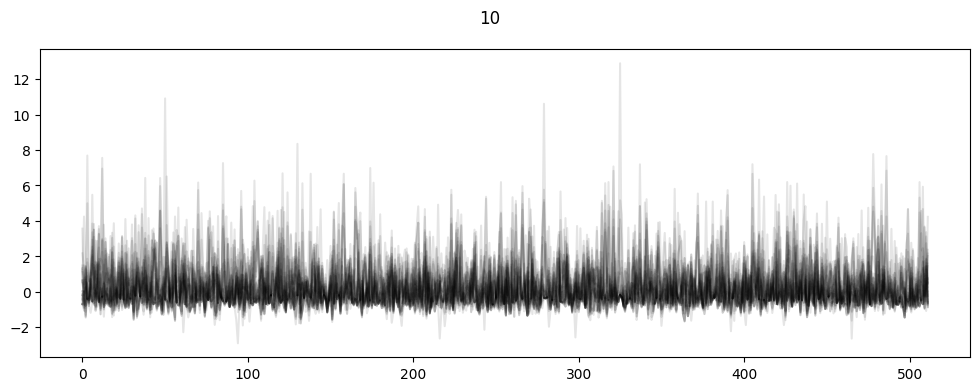

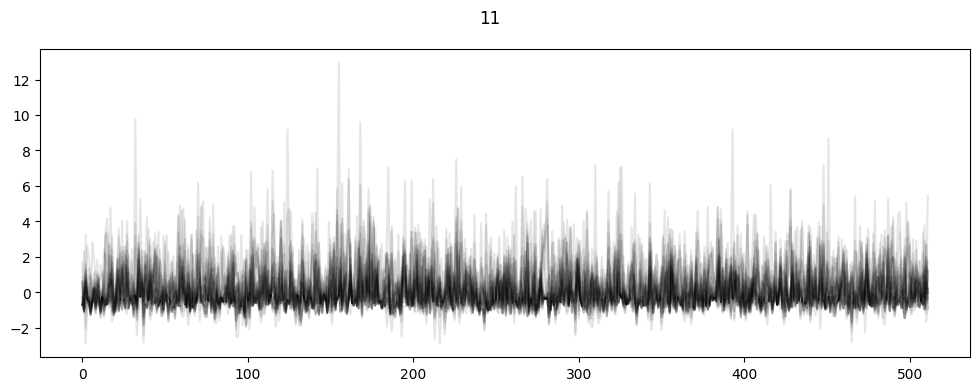

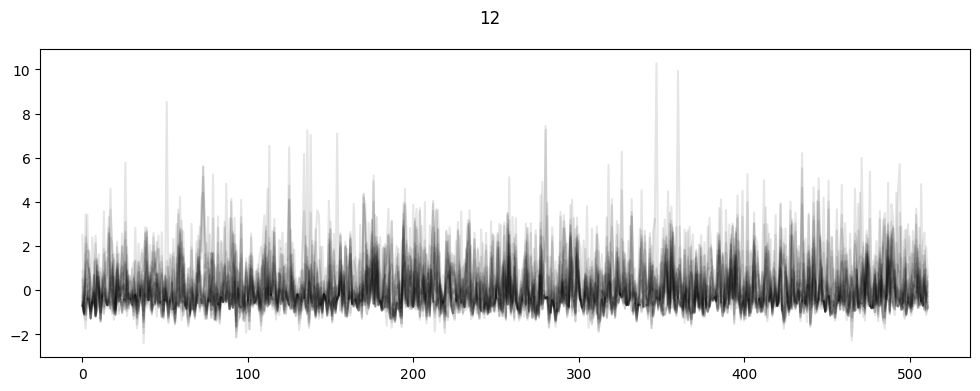

In [131]:
for month in range(1, 12 + 1):
    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    for t, e in zip(timestamps, window_embeddings_normalized):
        Y, M, _ = t.split('-')
        M = int(M)
        if M == month:
            ax.plot(e, c='k', alpha=0.1)
            c[month] += 1
    fig.suptitle(str(month))
    plt.show()

In [457]:
from sklearn.linear_model import LinearRegression

In [85]:
ts, xs, ys, embs = [], [], [], []
with tqdm(embeddings_all.items(), total=len(embeddings_all)) as bar:
    for t, d in bar:
        for w, e in zip(d['windows_pixel'], d['embeddings']):
            year, m, _ = t.split('-')
            if int(year) >= 2022:
                continue
            x = (w['xmin'] + w['xmax']) / 2
            y = (w['ymin'] + w['ymax']) / 2
            ts.append(float(m))
            xs.append(x)
            ys.append(y)
            embs.append(e)
ts = np.array(ts)
ts = np.sin(ts / (2 * np.pi))
xs = np.array(xs)
ys = np.array(ys)
embs = np.array(embs)

feats = np.vstack([ts, xs, ys]).T
# feats = (feats - feats.min(axis=0)) / (feats.max(axis=0) - feats.min(axis=0))
# targets = (embs - embs.min(axis=0)) / (embs.max(axis=0) - embs.min(axis=0))
feats = (feats - feats.mean(axis=0)) / feats.std(axis=0)
targets = (embs - embs.mean(axis=0)) / embs.std(axis=0)

  0%|          | 0/317 [00:00<?, ?it/s]

In [23]:
lr = LinearRegression()
lr.fit(feats, targets)

LinearRegression()

In [24]:
ts, xs, ys, embs = [], [], [], []
with tqdm(embeddings_all.items(), total=len(embeddings_all)) as bar:
    for t, d in bar:
        for w, e in zip(d['windows_pixel'], d['embeddings']):
            year, m, _ = t.split('-')
            if not (2022 <= int(year) < 2023):
                continue
            x = (w['xmin'] + w['xmax']) / 2
            y = (w['ymin'] + w['ymax']) / 2
            ts.append(float(m))
            xs.append(x)
            ys.append(y)
            embs.append(e)
ts = np.array(ts)
ts = np.sin(ts / (2 * np.pi))
xs = np.array(xs)
ys = np.array(ys)
embs = np.array(embs)

feats = np.vstack([ts, xs, ys]).T
# feats = (feats - feats.min(axis=0)) / (feats.max(axis=0) - feats.min(axis=0))
# targets = (embs - embs.min(axis=0)) / (embs.max(axis=0) - embs.min(axis=0))
feats = (feats - feats.mean(axis=0)) / feats.std(axis=0)
targets = (embs - embs.mean(axis=0)) / embs.std(axis=0)
len(feats)

  0%|          | 0/317 [00:00<?, ?it/s]

25168

In [25]:
lr.score(feats, targets)

0.10559132671654259

In [465]:
preds = lr.predict(feats)

In [471]:
np.sqrt(((preds - targets)**2).sum(axis=1))

10.59604078341339

---

In [53]:
from sklearn.linear_model import LinearRegression

def stats(x, axis=0):
    return x.mean(axis=axis), x.std(axis=axis)
    
def normalize(x, mu=None, sigma=None, axis=0):
    if mu is None or sigma is None:
        mu, sigma = stats(x, axis=axis)
    return np.nan_to_num((x - mu) / sigma)


In [38]:
(((6 - 1) + (1 / 30)) / 12)

0.41944444444444445

In [64]:
np.sqrt(((model.predict(window_ts_pred) - window_embeddings_pred)**2).sum(axis=1))

array([17.94830305, 18.16953006, 18.305388  , 16.36679652, 15.10136607])

In [76]:
m_to_box_to_score = {}

In [78]:
box_to_score

{Box(ymin=0, xmin=0, ymax=500, xmax=500): -760.7763255600692,
 Box(ymin=0, xmin=500, ymax=500, xmax=1000): -76.9062891769637,
 Box(ymin=0, xmin=1000, ymax=500, xmax=1500): -1062.5348364975114,
 Box(ymin=0, xmin=1500, ymax=500, xmax=2000): -909.6937794784876,
 Box(ymin=0, xmin=2000, ymax=500, xmax=2500): -212.5790903299011,
 Box(ymin=0, xmin=2500, ymax=500, xmax=3000): -3733806.283766351,
 Box(ymin=0, xmin=3000, ymax=500, xmax=3500): -12958.015184507998,
 Box(ymin=0, xmin=3500, ymax=500, xmax=4000): -1076.1124546540123,
 Box(ymin=0, xmin=4000, ymax=500, xmax=4500): -1533.6597350585264,
 Box(ymin=0, xmin=4500, ymax=500, xmax=5000): -88.0796342007128,
 Box(ymin=0, xmin=5000, ymax=500, xmax=5500): -12.143886082868237,
 Box(ymin=0, xmin=5500, ymax=500, xmax=6000): -97.28999949678635,
 Box(ymin=0, xmin=6000, ymax=500, xmax=6500): -28.261050562178905,
 Box(ymin=0, xmin=6500, ymax=500, xmax=7000): -32.79975964986179,
 Box(ymin=0, xmin=7000, ymax=500, xmax=7500): -35.26266043380329,
 Box(ymin=0

In [ ]:
plt.close('all')
for m0 in trange(1, 13):
    ms = range(m0, m0 + 1)
    box_to_score = {}

    if m0 not in m_to_box_to_score:
        for w in tqdm(windows):
            window_embeddings = np.array([next(iter(d.values())) for d in box_to_embeddings[w]])
            window_embeddings_train = []
            window_ts_train = []
            window_embeddings_pred = []
            window_ts_pred = []
            for t, e in zip(timestamps, window_embeddings):
                Y, M, D = t.split('-')
                Y = int(Y)
                M = float(M)
                D = float(D)
                t = (((M - 1) + (D / 30)) / 12)  # rough fraction of year estimate
                if Y > 2021:
                    continue
                elif Y == 2021 and M == m0:
                    window_embeddings_pred.append(e)
                    window_ts_pred.append(t)
                else:
                    window_embeddings_train.append(e)
                    window_ts_train.append(t)
            
            window_embeddings_train = np.stack(window_embeddings_train)
            window_embeddings_pred = np.stack(window_embeddings_pred)
            # mu, sigma = stats(window_embeddings_train)
            # window_embeddings_train = normalize(window_embeddings_train, mu, sigma)
            # window_embeddings_pred = normalize(window_embeddings_pred, mu, sigma)
            window_ts_train = np.sin(np.array(window_ts_train) / (2 * np.pi))[..., np.newaxis]
            window_ts_pred = np.sin(np.array(window_ts_pred) / (2 * np.pi))[..., np.newaxis]

            model = LinearRegression()
            model.fit(window_ts_train, window_embeddings_train)

            box_to_score[w] = model.score(window_ts_pred, window_embeddings_pred)
    
        m_to_box_to_score[m0] = box_to_score
    else:
        box_to_score = m_to_box_to_score[m0]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10), constrained_layout=True, squeeze=True)
    fig.suptitle(str(m0))
    patches = []
    for w in windows:
        p = Polygon(w.to_points())
        patches.append(p)

    scores = np.array([box_to_score[w] for w in windows])
    cmap = plt.get_cmap('plasma_r')
    norm = colors.Normalize(vmin=-100, vmax=10)
    pc = PatchCollection(patches, fc=cmap(norm(scores)), ec='k', cmap=cmap, norm=norm)
    ax.add_collection(pc)
    # ax.autoscale()
    cbar = fig.colorbar(pc, ax=ax, fraction=0.05, pad=0.05, orientation='vertical', aspect=16)
    ax.set_xlim((0, 11_000))
    ax.set_ylim((0, 11_000))

    plt.show()
    # break

## LR

In [90]:
es = []
for d in box_to_embeddings[windows[12]]:
    t, e = next(iter(d.items()))
    es.append(e)
es = np.stack(es)

(317, 512)

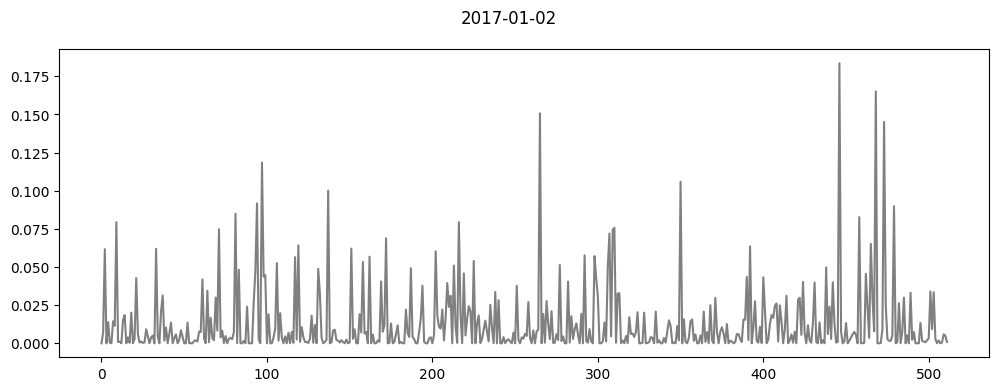

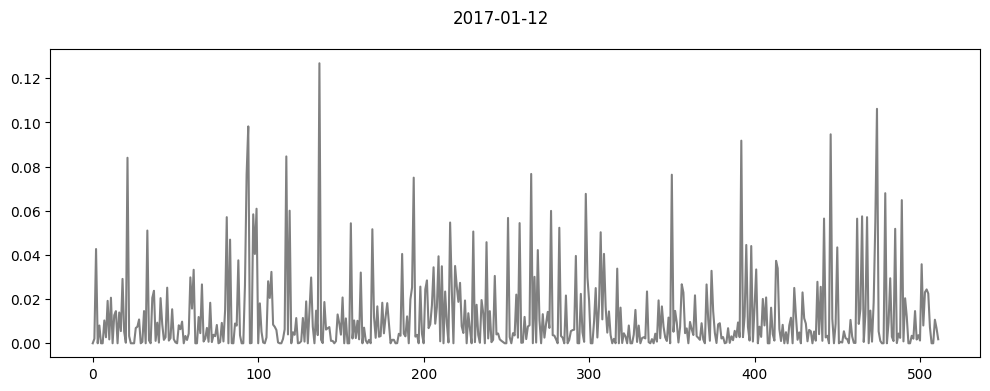

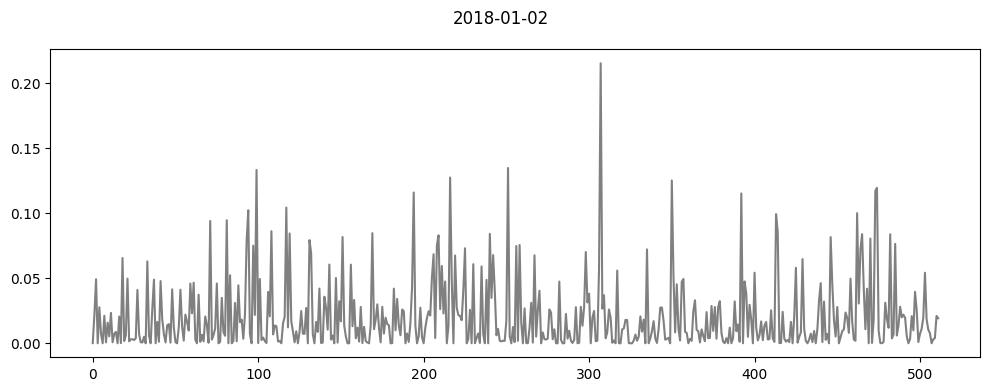

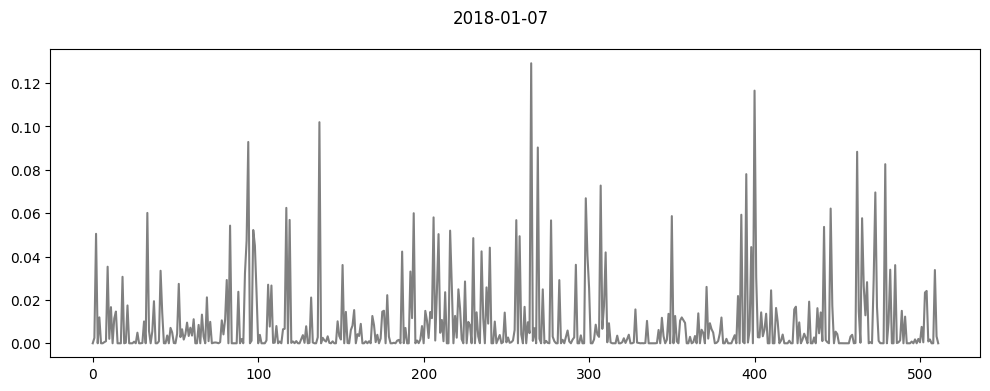

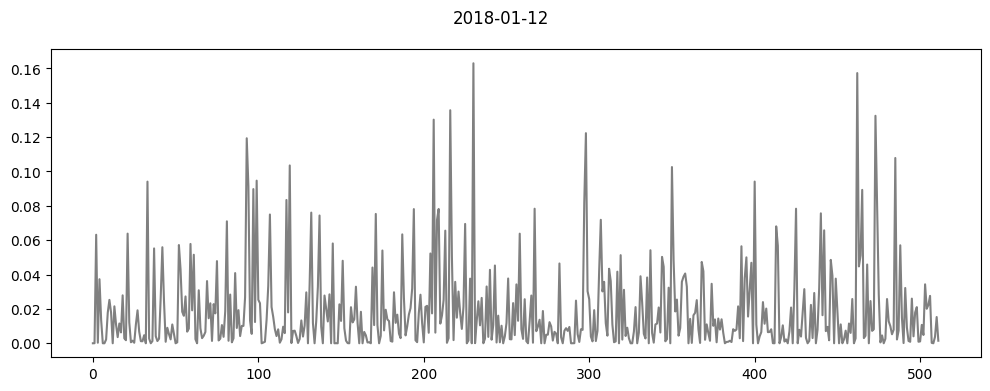

...

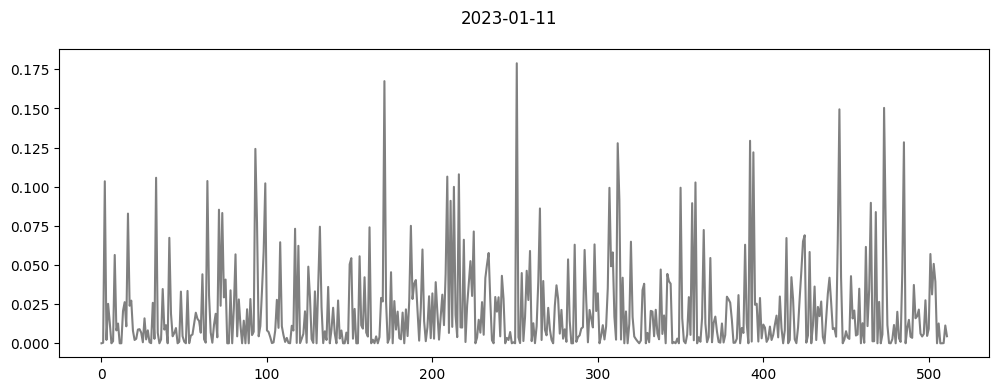

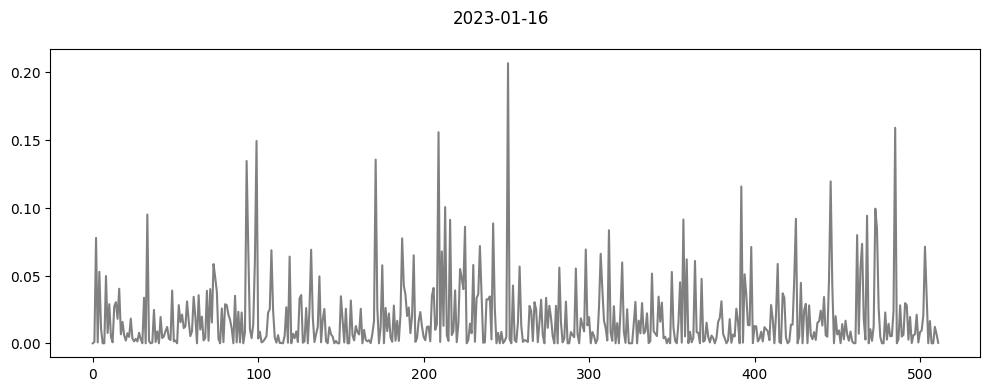

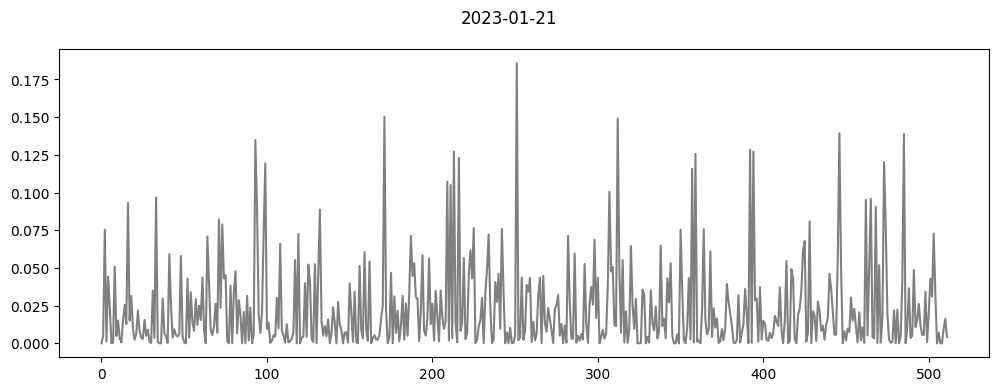

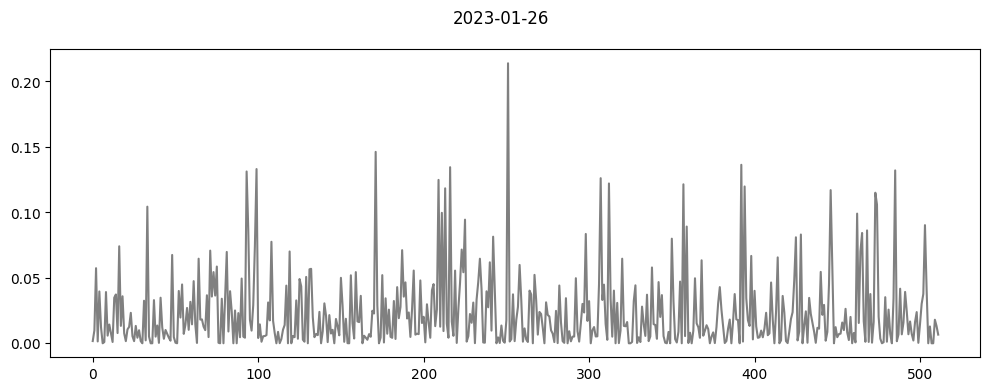

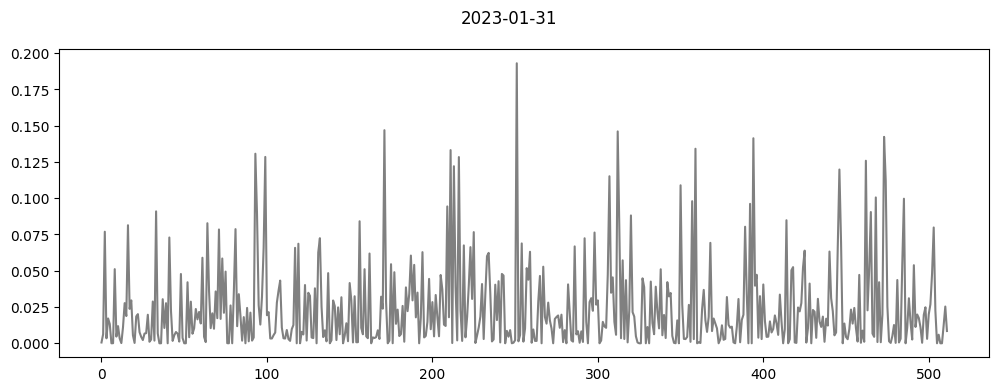

In [84]:
for d in box_to_embeddings[windows[12]]:
    t, e = next(iter(d.items()))
    if not ('-01-' in t):
        continue
    fig, ax = plt.subplots(1, 1, squeeze=True, figsize=(12, 4))
    ax.plot(e, c='gray', alpha=1)
    fig.suptitle(t)
    plt.show()

In [104]:
x = ((es - es.mean(axis=0)) / es.std(axis=0))

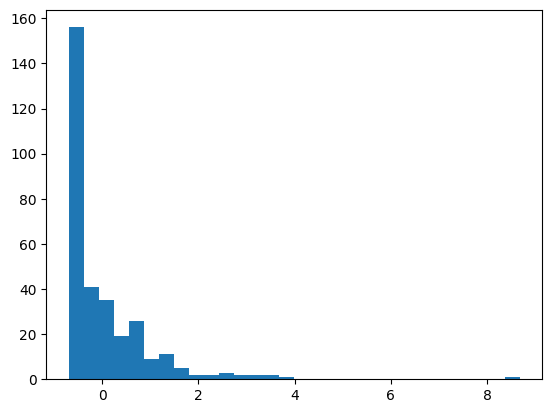

In [150]:
plt.hist(x[:, 0], bins=30)
plt.show()

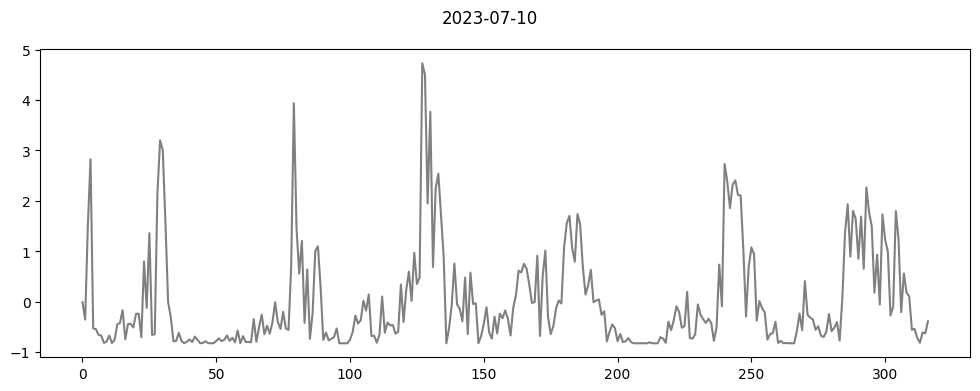

In [155]:
fig, ax = plt.subplots(1, 1, squeeze=True, figsize=(12, 4))
ax.plot(x[:, 4], c='gray', alpha=1)
fig.suptitle(t)
plt.show()